In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import math
import scipy.stats
import statsmodels.formula.api as smf
from statsmodels.graphics.regressionplots import abline_plot

In [2]:
os.getcwd()

'/Users/alvastrand/Library/Mobile Documents/com~apple~CloudDocs/Documents/OU/Research/notebooks/PeerJ'

In [3]:
path = '/Users/alvastrand/Downloads/'

os.chdir(path)

In [4]:
os.getcwd()

'/Users/alvastrand/Downloads'

In [5]:
pd.set_option('max_columns', 100)

In [6]:
matplotlib.rcParams['figure.dpi'] = 600

In [7]:
list_folders = sorted([i for i in os.listdir(path + 'vprs/') if 'vprs' in i])
print(len(list_folders))

print(list_folders)

6
['vprs20210327', 'vprs20210328', 'vprs20210329', 'vprs20210330', 'vprs20210425', 'vprs20210526']


In [8]:
list_files_w = sorted([i for i in os.listdir(path + 'wind_profiles/') if '.csv' in i])
print(len(list_files_w))

print(list_files_w)

30
['windprofile_20210327_00UTC_35.18N_97.44W.csv', 'windprofile_20210327_03UTC_35.18N_97.44W.csv', 'windprofile_20210327_06UTC_35.18N_97.44W.csv', 'windprofile_20210327_09UTC_35.18N_97.44W.csv', 'windprofile_20210327_12UTC_35.18N_97.44W.csv', 'windprofile_20210328_00UTC_35.18N_97.44W.csv', 'windprofile_20210328_03UTC_35.18N_97.44W.csv', 'windprofile_20210328_06UTC_35.18N_97.44W.csv', 'windprofile_20210328_09UTC_35.18N_97.44W.csv', 'windprofile_20210328_12UTC_35.18N_97.44W.csv', 'windprofile_20210329_00UTC_35.18N_97.44W.csv', 'windprofile_20210329_03UTC_35.18N_97.44W.csv', 'windprofile_20210329_06UTC_35.18N_97.44W.csv', 'windprofile_20210329_09UTC_35.18N_97.44W.csv', 'windprofile_20210329_12UTC_35.18N_97.44W.csv', 'windprofile_20210330_00UTC_35.18N_97.44W.csv', 'windprofile_20210330_03UTC_35.18N_97.44W.csv', 'windprofile_20210330_06UTC_35.18N_97.44W.csv', 'windprofile_20210330_09UTC_35.18N_97.44W.csv', 'windprofile_20210330_12UTC_35.18N_97.44W.csv', 'windprofile_20210425_00UTC_35.18N_9

In [9]:
list_hours = list(range(0, 15, 3))
print(len(list_hours))

print(list_hours)

5
[0, 3, 6, 9, 12]


In [10]:
list_all_dates = []
list_all_times = []
list_sum_Z = []
list_sum_eta = []
list_mean_wind_speed = []
list_mean_wind_direction = []

for folder_index in range(len(list_folders)):
    
    path_to_file = 'vprs/' + list_folders[folder_index] + '/csv_vpr/'

    list_files = sorted([i for i in os.listdir(path + 'vprs/' + list_folders[folder_index] + '/csv_vpr/')])
    print(len(list_files))

#     print(list_files)

    # set(i[13:15] for i in list_files)

    for file_index in range(len(list_files)):
        
        filename = list_files[file_index]
        
        print(path_to_file + filename)
        
        filename_date = filename[4:12]
#         print(filename_date)

        filename_time = filename[13:19]
#         print(filename_time)

        filename_time_hours = int(filename_time[0:2])
#         print(filename_time_hours)

        filename_time_minutes = int(filename_time[2:4])
#         print(filename_time_minutes)

        filename_time_seconds = int(filename_time[4:6])
#         print(filename_time_seconds)

        filename_time_minutes_converted = filename_time_minutes/60
#         print(filename_time_minutes_converted)

        filename_time_seconds_converted = filename_time_seconds/60/60
#         print(filename_time_seconds_converted)

        filename_time_converted = filename_time_hours + filename_time_minutes_converted + \
        filename_time_seconds_converted
#         print(filename_time_converted)
        
        list_all_dates.append(filename_date)
        
        list_all_times.append(filename_time)

        df = pd.read_csv(path_to_file + filename, names=['geopotential_height', 'Z', 'eta'])
        print(len(df))

        # above mean sea level (meters)
        # reflectivity factor (dBZ)
        # reflectivity (cm^2/km^3)

        df = df[(df['geopotential_height'] <= 1250) & (df['geopotential_height'] >= 450)]
        print(len(df))

        print(df.head(2))

        # df.plot('Z', 'geopotential_height', kind='scatter')

        # plt.show()

        path_to_file_w = 'wind_profiles/'

        list_files_date = [i for i in list_files_w if i[12:20] == filename_date]
        print(len(list_files_date))

#         print(list_files_date)

        list_differences = [abs(i - filename_time_converted) for i in list_hours]
#         print(list_differences)

        index_smallest = list_differences.index(min(list_differences))
#         print(index_smallest)

        filename_w = list_files_date[index_smallest]
    
        print(path_to_file_w + filename_w)

        df_w = pd.read_csv(path_to_file_w + filename_w, names=['geopotential_height', 'wind_speed', 'wind_direction'])
        print(len(df_w))

        # above mean sea level (meters)
        # (meters/second)
        # direction the wind is blowing toward (degrees clockwise from north)

        df_w = df_w[(df_w['geopotential_height'] <= 1250) & (df_w['geopotential_height'] >= 450)]
        print(len(df_w))

        df_w = df_w[df_w['wind_speed'] > 0]
        print(len(df_w))

        print(df_w.head(2))

        # df_w.plot('wind_speed', 'geopotential_height', kind='scatter')

        # plt.show()

        # df_w.plot('wind_direction', 'geopotential_height', kind='scatter')

        # plt.show()
        
#         list_sum_Z.append(df['Z'].sum(axis=0))
        
        list_sum_eta.append(df['eta'].sum(axis=0)/10)
        
        list_mean_wind_speed.append(df_w['wind_speed'].mean(axis=0))
        
        list_mean_wind_direction.append(df_w['wind_direction'].mean(axis=0))

88
vprs/vprs20210327/csv_vpr/vpr_20210327_000458UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.379388  619.685165
5                550.0   6.839452  137.460365
5
wind_profiles/windprofile_20210327_00UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           503.541077    4.301294      357.512390
3           733.497559    5.139190      359.189453
vprs/vprs20210327/csv_vpr/vpr_20210327_001434UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.615954  654.376610
5                550.0   7.374741  155.491434
5
wind_profiles/windprofile_20210327_00UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           503.541077    4.301294      357.512390
3           733.497559    5.139190      359.189453
vprs/vprs20210327/csv_vpr/vpr_20210327_002410UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  14.559656  813.20113

5                550.0  9.153178  234.180168
5
wind_profiles/windprofile_20210327_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           510.662994    4.710703      333.208984
3           739.761963    6.198569      350.750214
vprs/vprs20210327/csv_vpr/vpr_20210327_034724UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  7.457053  158.466559
5                550.0  9.134515  233.175938
5
wind_profiles/windprofile_20210327_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           510.662994    4.710703      333.208984
3           739.761963    6.198569      350.750214
vprs/vprs20210327/csv_vpr/vpr_20210327_035659UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  7.081633  145.343503
5                550.0  9.273331  240.749495
5
wind_profiles/windprofile_20210327_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_directio

3           746.399658    6.502614        7.576012
vprs/vprs20210327/csv_vpr/vpr_20210327_075632UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  8.561633  204.359866
5                550.0  9.931797  280.163819
5
wind_profiles/windprofile_20210327_09UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           517.050659    3.526151        3.911152
3           746.399658    6.502614        7.576012
vprs/vprs20210327/csv_vpr/vpr_20210327_080607UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  8.299400  192.385466
5                550.0  9.832496  273.830548
5
wind_profiles/windprofile_20210327_09UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           517.050659    3.526151        3.911152
3           746.399658    6.502614        7.576012
vprs/vprs20210327/csv_vpr/vpr_20210327_081542UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4  

4
   geopotential_height  wind_speed  wind_direction
2           517.050659    3.526151        3.911152
3           746.399658    6.502614        7.576012
vprs/vprs20210327/csv_vpr/vpr_20210327_103718UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0   9.758604  269.210969
5                550.0  11.452752  397.656055
5
wind_profiles/windprofile_20210327_12UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           528.650513    5.034187       41.513237
3           755.778076   10.639021       33.310829
vprs/vprs20210327/csv_vpr/vpr_20210327_104652UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0   9.651013  262.623536
5                550.0  11.241568  378.781833
5
wind_profiles/windprofile_20210327_12UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           528.650513    5.034187       41.513237
3           755.778076   10.639021       33.310829
v

59
9
   geopotential_height          Z         eta
4                450.0  10.164737  295.601043
5                550.0   3.961521   70.857275
5
wind_profiles/windprofile_20210328_00UTC_35.18N_97.44W.csv
29
4
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_011619UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.508856  319.976425
5                550.0   3.675499   66.341042
5
wind_profiles/windprofile_20210328_00UTC_35.18N_97.44W.csv
29
4
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_011934UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.338796  307.688954
5                550.0   3.257799   60.257644
5
wind_profiles/windprofile_20210328_00UTC_35.18N_97.44W.csv
29
4
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index:

vprs/vprs20210328/csv_vpr/vpr_20210328_031505UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  8.889078  220.363760
5                550.0  0.864680   34.729636
5
wind_profiles/windprofile_20210328_03UTC_35.18N_97.44W.csv
29
3
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_031840UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.722355  266.973311
5                550.0  0.892219   34.950568
5
wind_profiles/windprofile_20210328_03UTC_35.18N_97.44W.csv
29
3
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_032209UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.726411  267.222721
5                550.0  1.177366   37.322347
5
wind_profiles/windprofile_20210328_03UTC_35.18N_97.44W.csv
29
3
0
Empty DataFrame
Columns: [geopot

29
3
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_074220UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  4.476366  79.775377
5                550.0  0.328929  30.699070
5
wind_profiles/windprofile_20210328_09UTC_35.18N_97.44W.csv
29
3
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_075156UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  5.246906  95.262714
5                550.0  0.066715  28.900400
5
wind_profiles/windprofile_20210328_09UTC_35.18N_97.44W.csv
29
3
0
Empty DataFrame
Columns: [geopotential_height, wind_speed, wind_direction]
Index: []
vprs/vprs20210328/csv_vpr/vpr_20210328_080130UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  3.443941  62.896491
5                550.0  0.677025  33.260961
5
wind_profiles/w

5                550.0  10.497508  319.141357
5
wind_profiles/windprofile_20210329_00UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           620.920959    1.295282       37.727760
3           845.790771    1.626724       36.204147
vprs/vprs20210329/csv_vpr/vpr_20210329_005049UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  6.171212  117.856496
5                550.0  7.809084  171.846498
5
wind_profiles/windprofile_20210329_00UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           620.920959    1.295282       37.727760
3           845.790771    1.626724       36.204147
vprs/vprs20210329/csv_vpr/vpr_20210329_010024UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  2.715193  53.180411
5                550.0  3.638686  65.781055
5
wind_profiles/windprofile_20210329_00UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction


29
3
3
   geopotential_height  wind_speed  wind_direction
2           615.127563    5.037695        5.806774
3           840.176270    5.513830       14.097005
vprs/vprs20210329/csv_vpr/vpr_20210329_051138UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  5.702060  105.788460
5                550.0  6.895224  139.237009
5
wind_profiles/windprofile_20210329_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           615.127563    5.037695        5.806774
3           840.176270    5.513830       14.097005
vprs/vprs20210329/csv_vpr/vpr_20210329_052114UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  6.657248  131.812637
5                550.0  7.010364  142.977847
5
wind_profiles/windprofile_20210329_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           615.127563    5.037695        5.806774
3           840.176270    5.513830       14.097005
vp

3
   geopotential_height  wind_speed  wind_direction
2           598.705933    7.599156       18.152529
3           823.293457    8.212634       22.775761
vprs/vprs20210329/csv_vpr/vpr_20210329_082319UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  4.927107  88.499955
5                550.0  5.200207  94.243854
5
wind_profiles/windprofile_20210329_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           598.705933    7.599156       18.152529
3           823.293457    8.212634       22.775761
vprs/vprs20210329/csv_vpr/vpr_20210329_083255UTC_KTLX.csv
59
9
   geopotential_height         Z        eta
4                450.0  5.059457  91.238473
5                550.0  4.686781  83.735670
5
wind_profiles/windprofile_20210329_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           598.705933    7.599156       18.152529
3           823.293457    8.212634       22.775761
vprs/vprs2021

29
4
4
   geopotential_height  wind_speed  wind_direction
2           511.333496    4.823455        5.426140
3           740.255127    6.134830        5.948731
vprs/vprs20210330/csv_vpr/vpr_20210330_002424UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.002333  284.751150
5                550.0   5.242927   95.175474
5
wind_profiles/windprofile_20210330_00UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           511.333496    4.823455        5.426140
3           740.255127    6.134830        5.948731
vprs/vprs20210330/csv_vpr/vpr_20210330_003400UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.175774  296.353240
5                550.0   6.504918  127.269417
5
wind_profiles/windprofile_20210330_00UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           511.333496    4.823455        5.426140
3           740.255127    6.134830        5.948

29
4
4
   geopotential_height  wind_speed  wind_direction
2           509.311157    5.414252      358.356659
3           736.115479    7.489191        2.939464
vprs/vprs20210330/csv_vpr/vpr_20210330_033603UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  6.550701  128.618199
5                550.0  5.474538  100.388998
5
wind_profiles/windprofile_20210330_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           509.311157    5.414252      358.356659
3           736.115479    7.489191        2.939464
vprs/vprs20210330/csv_vpr/vpr_20210330_034538UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  6.944483  140.825282
5                550.0  5.691705  105.536522
5
wind_profiles/windprofile_20210330_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           509.311157    5.414252      358.356659
3           736.115479    7.489191        2.939464
vp

5                550.0  8.881904  219.999993
5
wind_profiles/windprofile_20210330_06UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           508.775574    5.182322        6.397404
3           734.818359    8.345284        9.523513
vprs/vprs20210330/csv_vpr/vpr_20210330_070900UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.838266  274.194600
5                550.0  9.365591  245.918592
5
wind_profiles/windprofile_20210330_06UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           508.775574    5.182322        6.397404
3           734.818359    8.345284        9.523513
vprs/vprs20210330/csv_vpr/vpr_20210330_071835UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.259156  239.964974
5                550.0  9.468453  251.812674
5
wind_profiles/windprofile_20210330_06UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_directio

3           715.422852    7.239718        8.903588
vprs/vprs20210330/csv_vpr/vpr_20210330_101101UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.263889  240.226677
5                550.0  9.074259  229.963134
5
wind_profiles/windprofile_20210330_09UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           490.688782    4.222943      359.269531
3           715.422852    7.239718        8.903588
vprs/vprs20210330/csv_vpr/vpr_20210330_102036UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  9.324107  243.580751
5                550.0  9.044704  228.403535
5
wind_profiles/windprofile_20210330_09UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           490.688782    4.222943      359.269531
3           715.422852    7.239718        8.903588
vprs/vprs20210330/csv_vpr/vpr_20210330_103011UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4  

59
9
   geopotential_height          Z         eta
4                450.0  13.545631  643.865988
5                550.0  13.704516  667.857559
5
wind_profiles/windprofile_20210425_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           555.395508    3.467320      294.826782
3           781.816895    3.052481      306.100616
vprs/vprs20210425/csv_vpr/vpr_20210425_023834UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.746845  674.398832
5                550.0  14.018265  717.891525
5
wind_profiles/windprofile_20210425_03UTC_35.18N_97.44W.csv
29
4
4
   geopotential_height  wind_speed  wind_direction
2           555.395508    3.467320      294.826782
3           781.816895    3.052481      306.100616
vprs/vprs20210425/csv_vpr/vpr_20210425_024809UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.695246  666.433678
5                550.0  13.980970  711.753116
5
wind_profil

29
3
3
   geopotential_height  wind_speed  wind_direction
2           571.925049    7.237227      310.006348
3           798.733154    6.652387      314.685913
vprs/vprs20210425/csv_vpr/vpr_20210425_055206UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.212107  596.270103
5                550.0  13.915987  701.182348
5
wind_profiles/windprofile_20210425_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           571.925049    7.237227      310.006348
3           798.733154    6.652387      314.685913
vprs/vprs20210425/csv_vpr/vpr_20210425_060140UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  13.431814  627.211060
5                550.0  13.746468  674.340255
5
wind_profiles/windprofile_20210425_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           571.925049    7.237227      310.006348
3           798.733154    6.652387      314.685

5                550.0  15.354257  976.468087
5
wind_profiles/windprofile_20210425_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           564.327881    6.883726      331.380096
3           791.247070    6.915935      332.436157
vprs/vprs20210425/csv_vpr/vpr_20210425_094206UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  15.102600  921.493546
5                550.0  15.150434  931.699086
5
wind_profiles/windprofile_20210425_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           564.327881    6.883726      331.380096
3           791.247070    6.915935      332.436157
vprs/vprs20210425/csv_vpr/vpr_20210425_095141UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  15.03498  907.256793
5                550.0  15.00689  901.407918
5
wind_profiles/windprofile_20210425_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_dire

29
3
3
   geopotential_height  wind_speed  wind_direction
2           570.485352    3.764643      319.194977
3           804.161621    3.905353      321.536835
vprs/vprs20210526/csv_vpr/vpr_20210526_003228UTC_KTLX.csv
59
9
   geopotential_height          Z          eta
4                450.0  15.678585  1052.181975
5                550.0  12.343642   488.198627
5
wind_profiles/windprofile_20210526_00UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           570.485352    3.764643      319.194977
3           804.161621    3.905353      321.536835
vprs/vprs20210526/csv_vpr/vpr_20210526_003659UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  14.932579  886.115141
5                550.0  11.622938  413.548162
5
wind_profiles/windprofile_20210526_00UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           570.485352    3.764643      319.194977
3           804.161621    3.905353      321.

5                550.0   8.699042  210.929115
5
wind_profiles/windprofile_20210526_03UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           584.188232    6.475486      336.282501
3           816.105957    6.256140      338.811737
vprs/vprs20210526/csv_vpr/vpr_20210526_020712UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.806405  543.091324
5                550.0   8.943663  223.150914
5
wind_profiles/windprofile_20210526_03UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           584.188232    6.475486      336.282501
3           816.105957    6.256140      338.811737
vprs/vprs20210526/csv_vpr/vpr_20210526_021147UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.956475  562.185657
5                550.0   9.612272  260.291243
5
wind_profiles/windprofile_20210526_03UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_d

3           816.105957    6.256140      338.811737
vprs/vprs20210526/csv_vpr/vpr_20210526_040005UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.449844  500.284017
5                550.0  11.852680  436.013954
5
wind_profiles/windprofile_20210526_03UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           584.188232    6.475486      336.282501
3           816.105957    6.256140      338.811737
vprs/vprs20210526/csv_vpr/vpr_20210526_040341UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.634933  522.066282
5                550.0  11.834457  434.188118
5
wind_profiles/windprofile_20210526_03UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           584.188232    6.475486      336.282501
3           816.105957    6.256140      338.811737
vprs/vprs20210526/csv_vpr/vpr_20210526_040716UTC_KTLX.csv
59
9
   geopotential_height          Z         

3           826.571777    5.620647       11.241467
vprs/vprs20210526/csv_vpr/vpr_20210526_051139UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  11.842952  435.038262
5                550.0  11.753759  426.194883
5
wind_profiles/windprofile_20210526_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           594.098877    4.851018        6.155469
3           826.571777    5.620647       11.241467
vprs/vprs20210526/csv_vpr/vpr_20210526_051508UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.502977  506.442302
5                550.0  12.076133  459.034888
5
wind_profiles/windprofile_20210526_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           594.098877    4.851018        6.155469
3           826.571777    5.620647       11.241467
vprs/vprs20210526/csv_vpr/vpr_20210526_051827UTC_KTLX.csv
59
9
   geopotential_height          Z         

29
3
3
   geopotential_height  wind_speed  wind_direction
2           594.098877    4.851018        6.155469
3           826.571777    5.620647       11.241467
vprs/vprs20210526/csv_vpr/vpr_20210526_062223UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.130600  464.827943
5                550.0  11.509836  402.917279
5
wind_profiles/windprofile_20210526_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           594.098877    4.851018        6.155469
3           826.571777    5.620647       11.241467
vprs/vprs20210526/csv_vpr/vpr_20210526_062542UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  12.001493  451.212927
5                550.0  11.346656  388.059151
5
wind_profiles/windprofile_20210526_06UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           594.098877    4.851018        6.155469
3           826.571777    5.620647       11.241

3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_073713UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  11.431575  395.721658
5                550.0   9.865543  275.922162
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_074027UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  11.713898  422.301027
5                550.0   9.908147  278.642298
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_074343UTC_KTLX.csv
59
9
   geopotential_height          Z         

3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_085459UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.519499  320.761490
5                550.0   9.370980  246.223994
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_085822UTC_KTLX.csv
59
9
   geopotential_height          Z         eta
4                450.0  10.611064  327.596087
5                550.0   9.254228  239.692935
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
v

59
9
   geopotential_height         Z         eta
4                450.0  8.753203  213.576072
5                550.0  6.447376  125.594292
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_101034UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  8.420099  197.807265
5                550.0  5.935162  111.621683
5
wind_profiles/windprofile_20210526_09UTC_35.18N_97.44W.csv
29
3
3
   geopotential_height  wind_speed  wind_direction
2           586.652100    5.976166       24.646540
3           819.096436    8.906633       34.968838
vprs/vprs20210526/csv_vpr/vpr_20210526_102008UTC_KTLX.csv
59
9
   geopotential_height         Z         eta
4                450.0  7.404794  156.571106
5                550.0  5.465688  100.184637
5
wind_profiles/windpr

In [11]:
df_all = pd.DataFrame(data={'date': list_all_dates, 'time': list_all_times, 
                            'sum_of_eta': list_sum_eta, 'mean_wind_speed': list_mean_wind_speed, 
                            'mean_wind_direction': list_mean_wind_direction})
print(df_all.shape)

df_all.head(2)

(600, 5)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction
0,20210327,000458,96.245742,5.103788,181.45099
1,20210327,001434,102.304289,5.103788,181.45099


In [12]:
df_all_sum_of_eta = df_all[['date', 'sum_of_eta']].groupby(['date']).sum()

df_all_sum_of_eta = df_all_sum_of_eta.reset_index()

print(df_all_sum_of_eta.shape)

df_all_sum_of_eta

(6, 2)


,date,sum_of_eta
0,20210327,17983.304201
1,20210328,3882.663501
2,20210329,3411.572205
3,20210330,9357.458624
4,20210425,27443.680754
5,20210526,42798.092193


In [13]:
df_all[df_all['mean_wind_speed'] < 1]

,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction
355,20210425,000516,871.116914,0.244471,229.433563
356,20210425,001451,837.100157,0.244471,229.433563
357,20210425,002425,854.464320,0.244471,229.433563
358,20210425,003400,708.373698,0.244471,229.433563
359,20210425,004335,440.879997,0.244471,229.433563
360,20210425,005309,279.052031,0.244471,229.433563
361,20210425,010244,192.621083,0.244471,229.433563
362,20210425,011219,116.122060,0.244471,229.433563
363,20210425,012154,61.195255,0.244471,229.433563


In [14]:
df_all = df_all.dropna(subset=['mean_wind_speed'])
print(len(df_all))

492


In [15]:
sorted(df_all['mean_wind_speed'].unique())

[0.2444714605808258,
 1.637691895167033,
 2.579850435256958,
 2.8596293330192566,
 3.893770694732666,
 4.458998203277588,
 5.103787899017334,
 5.192956765492757,
 5.494330406188965,
 5.542444070180257,
 5.660233497619629,
 5.6956400871276855,
 5.9883049329121905,
 6.158851146697998,
 6.325281977653503,
 6.442067623138428,
 6.463170210520427,
 6.957543075084686,
 8.133653163909912,
 8.374328255653381,
 8.497021834055582,
 8.915222883224487,
 9.851682424545288,
 10.371143579483032,
 11.504145622253418,
 11.747793197631836]

In [16]:
sorted(df_all['mean_wind_direction'].unique())

[7.982284188270568,
 13.542842864990234,
 13.934544801712036,
 14.447250962257385,
 15.131118297576904,
 24.23280652364095,
 25.130089441935223,
 31.49457550048828,
 33.95177777608236,
 34.994462966918945,
 35.94317499796549,
 39.58657169342041,
 42.69509665171305,
 97.09245419502258,
 104.68808579444885,
 175.88008069992065,
 179.5215429216623,
 181.45098966360092,
 209.7421722412109,
 229.43356323242188,
 263.01514053344727,
 315.56797281901044,
 316.97264099121094,
 320.7643737792969,
 334.48252360026044,
 340.2341715494792]

In [17]:
list(df_all['mean_wind_direction'])

[181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 181.45098966360092,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 263.01514053344727,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 175.88008069992065,
 14.447250962

In [18]:
list(df_all['mean_wind_speed'])

[5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.103787899017334,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 5.660233497619629,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.158851146697998,
 6.957543075084686,
 6.957543075084686,
 6.957543075084686,


In [19]:
list(df_all['mean_wind_direction'].unique())

[181.45098966360092,
 263.01514053344727,
 175.88008069992065,
 14.447250962257385,
 39.58657169342041,
 209.7421722412109,
 35.94317499796549,
 24.23280652364095,
 15.131118297576904,
 25.130089441935223,
 33.95177777608236,
 7.982284188270568,
 97.09245419502258,
 13.934544801712036,
 104.68808579444885,
 31.49457550048828,
 229.43356323242188,
 316.97264099121094,
 315.56797281901044,
 334.48252360026044,
 179.5215429216623,
 320.7643737792969,
 340.2341715494792,
 13.542842864990234,
 34.994462966918945,
 42.69509665171305]

In [20]:
list(df_all['mean_wind_speed'].unique())

[5.103787899017334,
 5.660233497619629,
 6.158851146697998,
 6.957543075084686,
 10.371143579483032,
 2.579850435256958,
 1.637691895167033,
 5.192956765492757,
 5.6956400871276855,
 8.497021834055582,
 11.747793197631836,
 6.325281977653503,
 8.374328255653381,
 9.851682424545288,
 8.915222883224487,
 11.504145622253418,
 0.2444714605808258,
 2.8596293330192566,
 6.442067623138428,
 6.463170210520427,
 5.494330406188965,
 3.893770694732666,
 5.9883049329121905,
 5.542444070180257,
 8.133653163909912,
 4.458998203277588]

In [21]:
len(list(df_all['mean_wind_direction'].unique()))

26

In [22]:
len(list(df_all['mean_wind_speed'].unique()))

26

In [23]:
df_all_copy = df_all.copy()

In [24]:
df_all_copy['date']

0      20210327
1      20210327
2      20210327
3      20210327
4      20210327
         ...   
595    20210526
596    20210526
597    20210526
598    20210526
599    20210526
Name: date, Length: 492, dtype: object

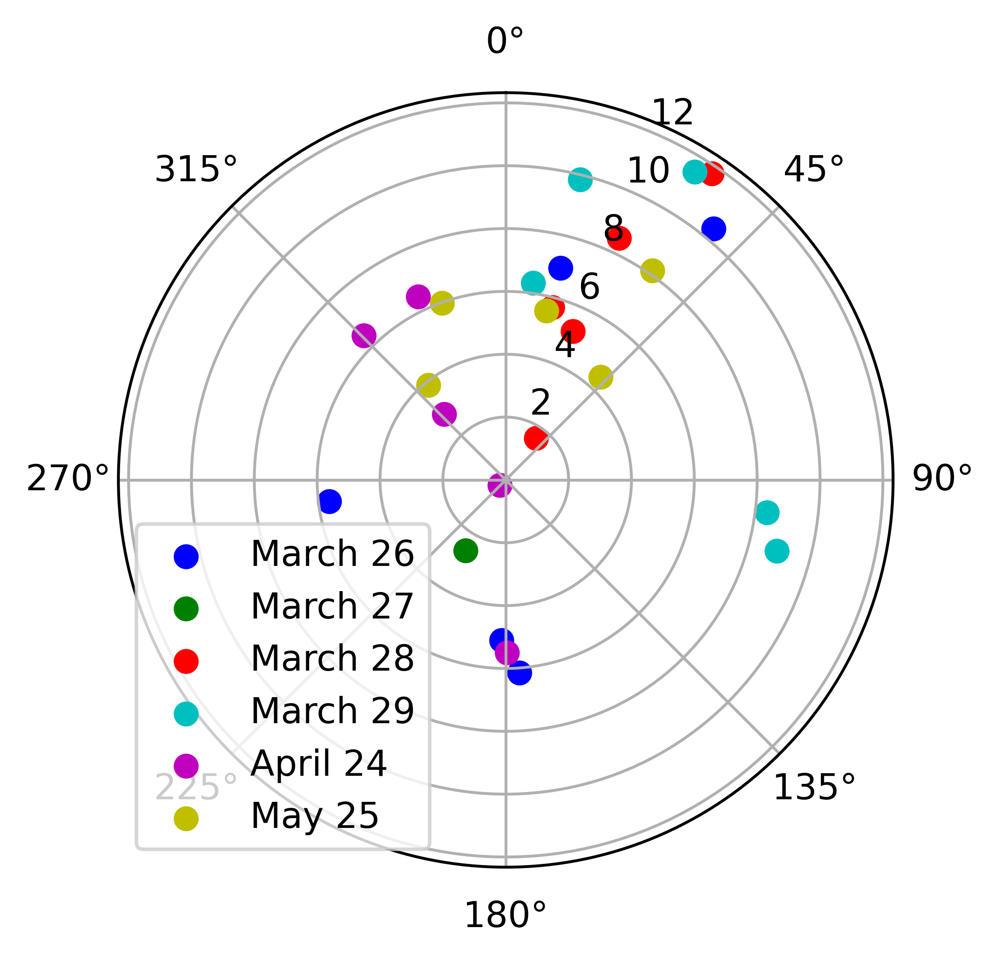

In [25]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, dpi=600)

# ax.scatter([math.radians(i) for i in df_all['mean_wind_direction'].unique()], df_all['mean_wind_speed'].unique())

dates = ['March 26', 'March 27', 'March 28', 'March 29', 'April 24', 'May 25']

colors = ['b', 'g', 'r', 'c', 'm', 'y']

for i in range(len(dates)):
    
    df_subset = df_all[
        df_all['date'] == df_all['date'].unique()[i]]
    
    ax.scatter([math.radians(i) for i in df_subset['mean_wind_direction'].unique()], 
               df_subset['mean_wind_speed'].unique(), c=colors[i], label=dates[i])

ax.legend()

ax.set_theta_direction(-1)

ax.set_theta_zero_location("N")

# plt.show()

In [26]:
# plt.savefig('PeerJ/Figures/Figure_3.pdf', bbox_inches='tight')

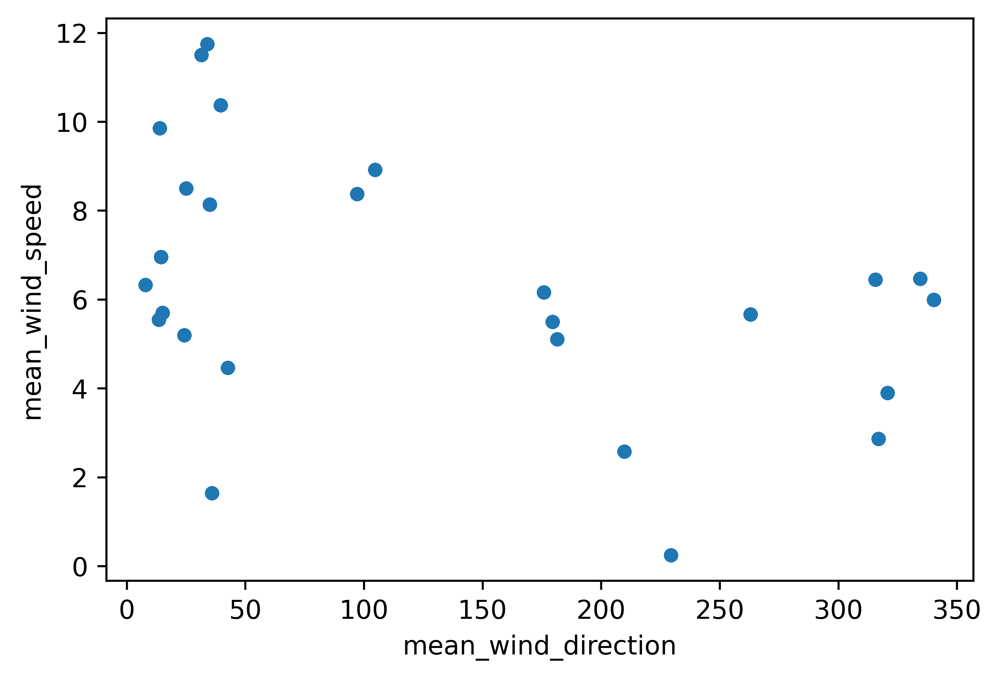

In [27]:
df_all.plot.scatter('mean_wind_direction', 'mean_wind_speed')

plt.show()

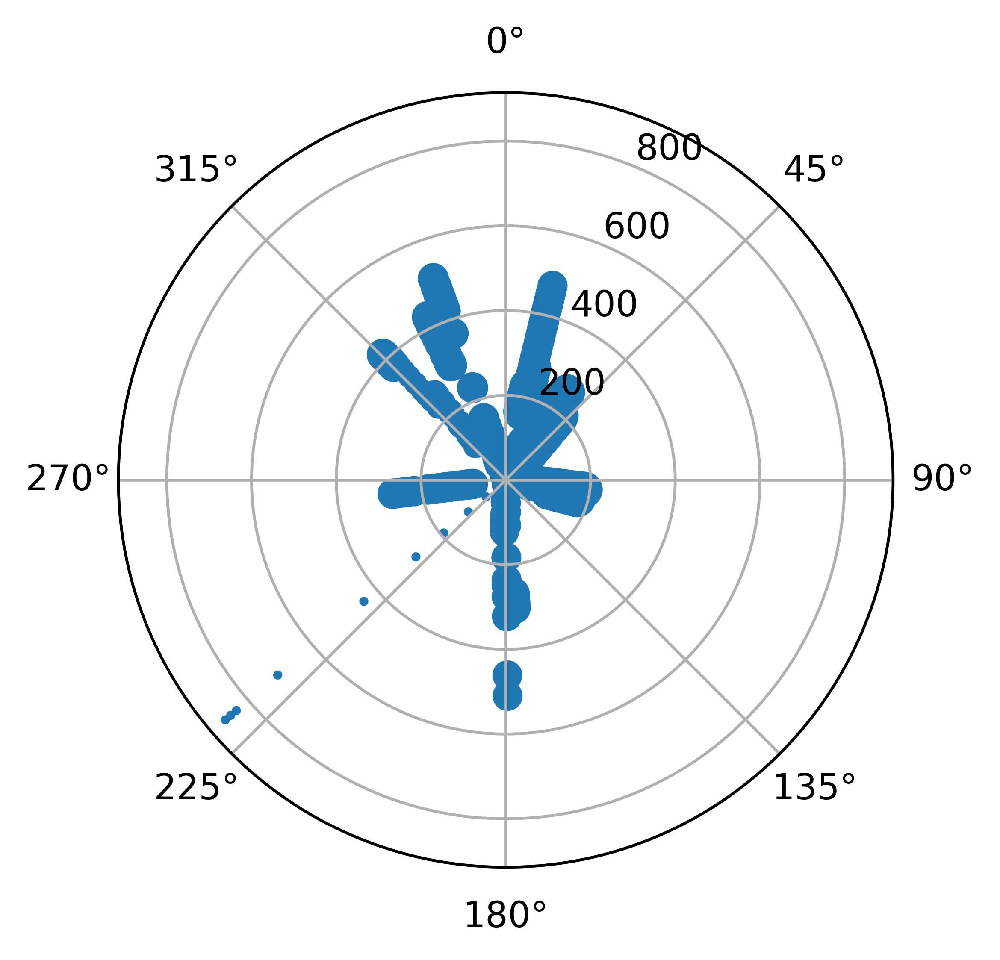

In [28]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, dpi=600)

# ax.scatter([math.radians(i) for i in df_all['mean_wind_direction']], df_all['sum_of_eta'], 
#            s=df_all['mean_wind_speed']*10, facecolors='none', edgecolors='b')

# ax.scatter([math.radians(i) for i in df_all['mean_wind_direction']], df_all['sum_of_eta'], facecolors='none', 
#            edgecolors='b')

# ax.scatter([math.radians(i) for i in df_all['mean_wind_direction']], df_all['sum_of_eta'])

ax.scatter([math.radians(i) for i in df_all['mean_wind_direction']], df_all['sum_of_eta'], 
           s=df_all['mean_wind_speed']*10)

ax.set_theta_direction(-1)

ax.set_theta_zero_location("N")

plt.show()

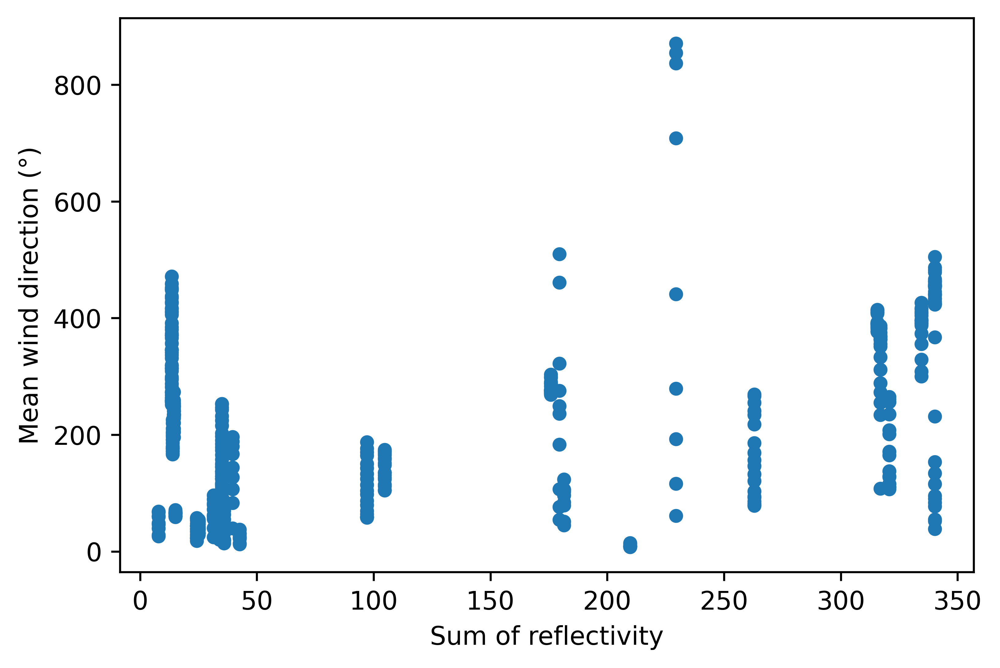

In [29]:
df_all.plot.scatter('mean_wind_direction', 'sum_of_eta')

plt.xlabel('Sum of reflectivity')

plt.ylabel('Mean wind direction (°)')

plt.show()

In [30]:
scipy.stats.pearsonr(df_all['mean_wind_direction'], df_all['sum_of_eta'])

(0.44138739110962116, 7.106105219144997e-25)

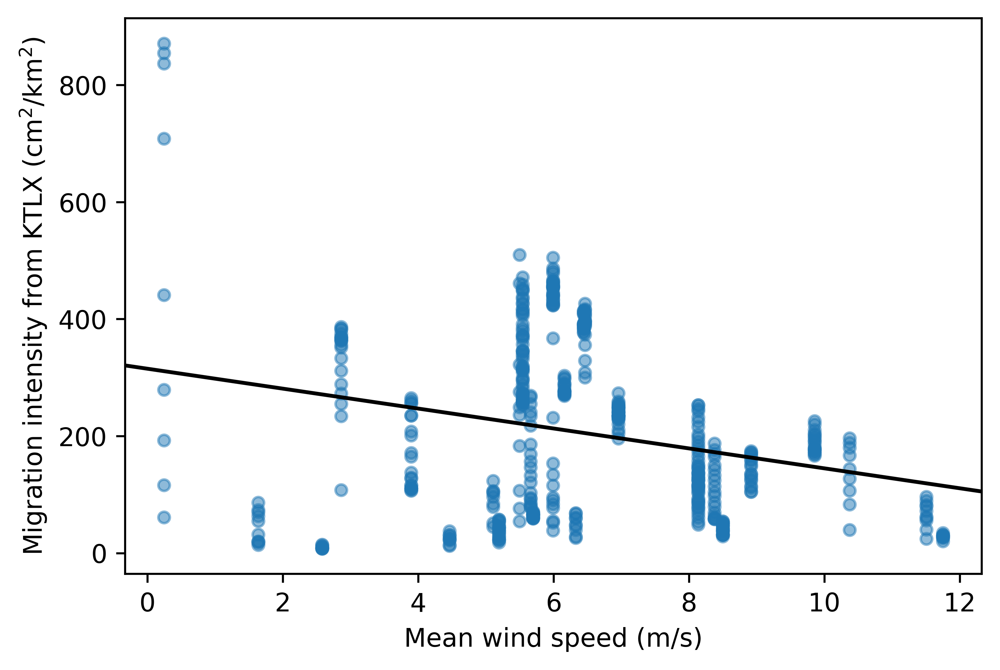

In [31]:
first_plot = df_all.plot.scatter('mean_wind_speed', 'sum_of_eta', alpha=0.5)

model_ols = smf.ols(formula='sum_of_eta ~ mean_wind_speed', data=df_all)

res_ols = model_ols.fit()

abline_plot(model_results=res_ols, ax=first_plot, color='black')

plt.xlabel('Mean wind speed (m/s)')

plt.ylabel('Migration intensity from KTLX ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.show()

In [32]:
scipy.stats.pearsonr(df_all['mean_wind_speed'], df_all['sum_of_eta'])

(-0.25939017382420704, 5.246654714475527e-09)

In [33]:
# plt.scatter(df_all['mean_wind_direction'], df_all['sum_of_eta'], s=df_all['mean_wind_speed']*50, facecolors='none', 
#             edgecolors='b')

# plt.xlabel('Mean wind direction')

# plt.ylabel('Sum of reflectivity')

# plt.show()

In [34]:
df_all_added_cols = df_all.copy()
print(len(df_all_added_cols))

df_all_added_cols.head(2)

492


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction
0,20210327,000458,96.245742,5.103788,181.45099
1,20210327,001434,102.304289,5.103788,181.45099


In [35]:
df_all_added_cols['hours'] = df_all_added_cols['time'].str[0:2].astype(int)

df_all_added_cols['minutes'] = df_all_added_cols['time'].str[2:4].astype(int)

df_all_added_cols['seconds'] = df_all_added_cols['time'].str[4:6].astype(int)

df_all_added_cols['minutes_converted'] = df_all_added_cols['minutes']/60

df_all_added_cols['seconds_converted'] = df_all_added_cols['seconds']/60/60

df_all_added_cols['time_converted'] = df_all_added_cols['hours'] + df_all_added_cols['minutes_converted'] + \
df_all_added_cols['seconds_converted']

print(len(df_all_added_cols))

df_all_added_cols.head(2)

492


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted
0,20210327,000458,96.245742,5.103788,181.45099,0,4,58,0.066667,0.016111,0.082778
1,20210327,001434,102.304289,5.103788,181.45099,0,14,34,0.233333,0.009444,0.242778


In [36]:
filename = 'all_rot_tracks.csv'

df_m = pd.read_csv(filename)
print(len(df_m))

df_m.head(2)

6218


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix
0,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0
1,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0


In [37]:
df_m['moonElevation'].sort_values()

1155     3.88
1154     3.88
4491     4.01
4490     5.72
4489     6.26
        ...  
3348    70.40
3350    70.50
3349    70.59
3352    70.65
3353    70.67
Name: moonElevation, Length: 6218, dtype: float64

In [38]:
df_m['date'] = df_m['timeUTC'].str[0:4] + df_m['timeUTC'].str[5:7] + df_m['timeUTC'].str[8:10]
print(len(df_m))

df_m.head(2)

6218


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date
0,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0,20210327
1,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0,20210327


In [39]:
df_m['actual_time'] = df_m['timeUTC'].str[11:13] + df_m['timeUTC'].str[14:16] + df_m['timeUTC'].str[17:19]

df_m['actual_hours'] = df_m['actual_time'].str[0:2].astype(int)

df_m['actual_minutes'] = df_m['actual_time'].str[2:4].astype(int)

df_m['actual_seconds'] = df_m['actual_time'].str[4:6].astype(int)

df_m['actual_minutes_converted'] = df_m['actual_minutes']/60

df_m['actual_seconds_converted'] = df_m['actual_seconds']/60/60

df_m['actual_time_converted'] = df_m['actual_hours'] + df_m['actual_minutes_converted'] + \
df_m['actual_seconds_converted']

print(len(df_m))

df_m.head(2)

6218


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date,actual_time,actual_hours,actual_minutes,actual_seconds,actual_minutes_converted,actual_seconds_converted,actual_time_converted
0,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0,20210327,011354,1,13,54,0.216667,0.015000,1.231667
1,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0,20210327,011355,1,13,55,0.216667,0.015278,1.231944


In [40]:
print(min(df_m['actual_time_converted']))

print(max(df_m['actual_time_converted']))

1.2316666666666667
11.900555555555556


In [41]:
print(len(df_m['date'].unique()))

print(list(df_m['date'].unique()))

29
['20210327', '20210328', '20210329', '20210330', '20210425', '20210526', '20180428', '20180429', '20180430', '20190421', '20190422', '20200506', '20200508', '20210525', '20200306', '20180928', '20190520', '20200308', '20200829', '20200830', '20200831', '20200903', '20200929', '20181022', '20181023', '20181024', '20200904', '20201003', '20201005']


In [42]:
print(len(df_all_added_cols['date'].unique()))

print(list(df_all_added_cols['date'].unique()))

6
['20210327', '20210328', '20210329', '20210330', '20210425', '20210526']


In [43]:
df_m = df_m[df_m['date'].isin(list(df_all_added_cols['date'].unique()))]
print(df_m.shape)

(2207, 32)


In [44]:
df_m[df_m['moonElevation'] < 14].shape

(64, 32)

In [45]:
df_m = df_m[df_m['moonElevation'] >= 20]
print(df_m.shape)

(2025, 32)


In [46]:
cnt = 0

for i in range(len(df_m)):

    df_row_merged = df_m.iloc[[i]].merge(df_all_added_cols, on='date')
    
    df_row_merged['time_difference'] = (df_row_merged['actual_time_converted'] - \
                                        df_row_merged['time_converted']).abs()

    print(len(df_row_merged))
    
#     print(df_row_merged.head(2))

    df_row = df_row_merged.iloc[[df_row_merged['time_difference'].idxmin()]]
    print(len(df_row))

#     print(df_row)

    if cnt == 0:

        df_m_added_cols = df_row

    else:

        df_m_added_cols = pd.concat([df_m_added_cols, df_row])

    print(len(df_m_added_cols))

#     print(df_m_added_cols)

    cnt += 1

88
1
1
88
1
2
88
1
3
88
1
4
88
1
5
88
1
6
88
1
7
88
1
8
88
1
9
88
1
10
88
1
11
88
1
12
88
1
13
88
1
14
88
1
15
88
1
16
88
1
17
88
1
18
88
1
19
88
1
20
88
1
21
88
1
22
88
1
23
88
1
24
88
1
25
88
1
26
88
1
27
88
1
28
88
1
29
88
1
30
88
1
31
88
1
32
88
1
33
88
1
34
88
1
35
88
1
36
88
1
37
88
1
38
88
1
39
88
1
40
88
1
41
88
1
42
88
1
43
88
1
44
88
1
45
88
1
46
88
1
47
88
1
48
88
1
49
88
1
50
88
1
51
88
1
52
88
1
53
88
1
54
88
1
55
88
1
56
88
1
57
88
1
58
88
1
59
88
1
60
88
1
61
88
1
62
88
1
63
88
1
64
88
1
65
88
1
66
88
1
67
88
1
68
88
1
69
88
1
70
88
1
71
88
1
72
88
1
73
88
1
74
88
1
75
88
1
76
88
1
77
88
1
78
88
1
79
88
1
80
88
1
81
88
1
82
88
1
83
88
1
84
88
1
85
88
1
86
88
1
87
88
1
88
88
1
89
88
1
90
88
1
91
88
1
92
88
1
93
88
1
94
88
1
95
88
1
96
88
1
97
88
1
98
88
1
99
88
1
100
88
1
101
88
1
102
88
1
103
88
1
104
88
1
105
88
1
106
88
1
107
88
1
108
88
1
109
88
1
110
88
1
111
88
1
112
88
1
113
88
1
114
88
1
115
88
1
116
88
1
117
88
1
118
88
1
119
88
1
120
88
1
121
88
1
122
88
1
123
8

88
1
927
88
1
928
88
1
929
88
1
930
88
1
931
88
1
932
88
1
933
88
1
934
88
1
935
88
1
936
88
1
937
88
1
938
88
1
939
88
1
940
88
1
941
88
1
942
88
1
943
88
1
944
88
1
945
88
1
946
88
1
947
88
1
948
88
1
949
88
1
950
88
1
951
88
1
952
88
1
953
88
1
954
88
1
955
88
1
956
88
1
957
88
1
958
88
1
959
88
1
960
88
1
961
88
1
962
88
1
963
88
1
964
88
1
965
88
1
966
88
1
967
88
1
968
88
1
969
88
1
970
88
1
971
88
1
972
88
1
973
88
1
974
88
1
975
88
1
976
88
1
977
88
1
978
88
1
979
88
1
980
88
1
981
88
1
982
88
1
983
88
1
984
88
1
985
88
1
986
88
1
987
88
1
988
88
1
989
88
1
990
88
1
991
88
1
992
88
1
993
88
1
994
88
1
995
88
1
996
88
1
997
88
1
998
88
1
999
88
1
1000
88
1
1001
88
1
1002
88
1
1003
88
1
1004
88
1
1005
88
1
1006
88
1
1007
88
1
1008
88
1
1009
88
1
1010
88
1
1011
88
1
1012
88
1
1013
88
1
1014
88
1
1015
88
1
1016
88
1
1017
88
1
1018
88
1
1019
88
1
1020
88
1
1021
88
1
1022
88
1
1023
88
1
1024
88
1
1025
88
1
1026
88
1
1027
88
1
1028
88
1
1029
88
1
1030
88
1
1031
88
1
1032
88
1
1033
88


75
1
1761
75
1
1762
75
1
1763
75
1
1764
75
1
1765
75
1
1766
75
1
1767
75
1
1768
75
1
1769
75
1
1770
75
1
1771
75
1
1772
75
1
1773
75
1
1774
75
1
1775
75
1
1776
75
1
1777
75
1
1778
75
1
1779
75
1
1780
75
1
1781
75
1
1782
75
1
1783
75
1
1784
75
1
1785
75
1
1786
75
1
1787
75
1
1788
75
1
1789
75
1
1790
75
1
1791
75
1
1792
75
1
1793
75
1
1794
75
1
1795
75
1
1796
75
1
1797
75
1
1798
75
1
1799
75
1
1800
75
1
1801
75
1
1802
75
1
1803
75
1
1804
75
1
1805
75
1
1806
75
1
1807
75
1
1808
75
1
1809
75
1
1810
75
1
1811
75
1
1812
75
1
1813
75
1
1814
75
1
1815
75
1
1816
75
1
1817
75
1
1818
75
1
1819
75
1
1820
75
1
1821
75
1
1822
75
1
1823
75
1
1824
75
1
1825
75
1
1826
75
1
1827
75
1
1828
75
1
1829
75
1
1830
75
1
1831
75
1
1832
75
1
1833
75
1
1834
75
1
1835
75
1
1836
75
1
1837
75
1
1838
75
1
1839
75
1
1840
75
1
1841
75
1
1842
75
1
1843
75
1
1844
75
1
1845
75
1
1846
75
1
1847
75
1
1848
75
1
1849
75
1
1850
75
1
1851
75
1
1852
75
1
1853
75
1
1854
75
1
1855
75
1
1856
75
1
1857
75
1
1858
75
1
1859
75
1
1860


In [47]:
print(len(df_m_added_cols))

df_m_added_cols.head(2)

2025


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date,actual_time,actual_hours,actual_minutes,actual_seconds,actual_minutes_converted,actual_seconds_converted,actual_time_converted,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_difference
7,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0,20210327,011354,1,13,54,0.216667,0.015000,1.231667,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.029722
7,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0,20210327,011355,1,13,55,0.216667,0.015278,1.231944,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.030000


In [48]:
df_m_added_cols['min_direction'] = df_m_added_cols[['mean_wind_direction', 'bearing']].min(axis=1)

df_m_added_cols['max_direction'] = df_m_added_cols[['mean_wind_direction', 'bearing']].max(axis=1)

df_m_added_cols['difference_directions'] = df_m_added_cols['max_direction'] - df_m_added_cols['min_direction']

df_m_added_cols = df_m_added_cols.reset_index(drop=True)

df_m_added_cols.loc[(df_m_added_cols['min_direction'] < df_m_added_cols['max_direction'] - 180), 
                    'difference_directions'] = 360 - df_m_added_cols['max_direction'] + df_m_added_cols['min_direction']

print(len(df_m_added_cols))

df_m_added_cols.head(2)

2025


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date,actual_time,actual_hours,actual_minutes,actual_seconds,actual_minutes_converted,actual_seconds_converted,actual_time_converted,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_difference,min_direction,max_direction,difference_directions
0,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0,20210327,011354,1,13,54,0.216667,0.015000,1.231667,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.029722,181.45099,325.46000,144.00901
1,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0,20210327,011355,1,13,55,0.216667,0.015278,1.231944,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.030000,0.48000,181.45099,179.02901


In [49]:
df_m_mean_diff = df_m_added_cols[['difference_directions', 'mean_wind_speed']].groupby(['mean_wind_speed']).mean()

df_m_mean_diff = df_m_mean_diff.rename(columns={'difference_directions': 'mean_difference'})

df_m_mean_diff = df_m_mean_diff.reset_index()

print(df_m_mean_diff.shape)

df_m_mean_diff

(16, 2)


,mean_wind_speed,mean_difference
0,2.579850,32.990724
1,2.859629,33.314345
2,5.103788,162.044654
3,5.192957,36.431474
4,5.542444,24.526716
5,5.660233,85.328170
6,5.695640,13.629313
7,5.988305,35.132646
8,6.158851,169.845367
9,6.463170,16.377320


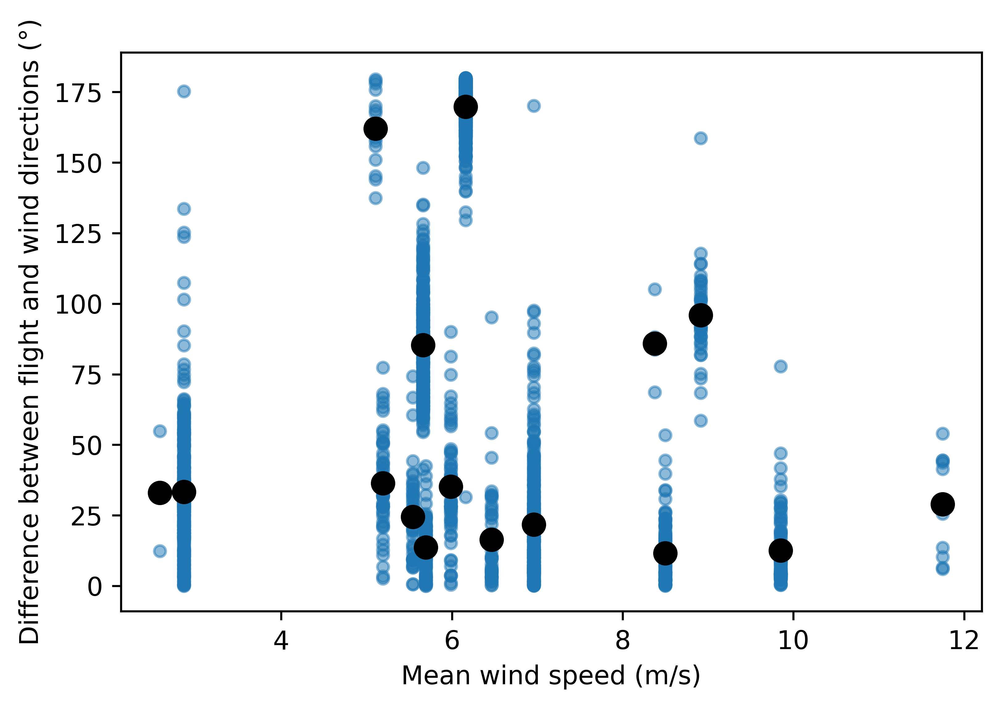

In [50]:
first_plot = df_m_added_cols.plot.scatter('mean_wind_speed', 'difference_directions', alpha=0.5)

df_m_mean_diff.plot.scatter('mean_wind_speed', 'mean_difference', marker='o', s=72, color='black', ax=first_plot)

plt.xlabel('Mean wind speed (m/s)')

plt.ylabel('Difference between flight and wind directions (°)')

plt.show()

In [51]:
# matplotlib.rcParams

In [52]:
df_m_added_cols_north = df_m_added_cols[(df_m_added_cols['mean_wind_direction'] >= 90) & 
                                        (df_m_added_cols['mean_wind_direction'] < 270)]
print(df_m_added_cols_north.shape)

df_m_added_cols_north.head(2)

(870, 46)


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date,actual_time,actual_hours,actual_minutes,actual_seconds,actual_minutes_converted,actual_seconds_converted,actual_time_converted,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_difference,min_direction,max_direction,difference_directions
0,KES120210327011151_1,2021-03-27 01:13:54,2021-03-27 00:47:34,2021-03-27 12:24:44,26.33,670.83,-97.52,34.98,3682,3687,6,6,0.200000,0.1776,294.183981,5.00,29.70,97.65,365546,0.0,912,970,325.46,15.0,20210327,011354,1,13,54,0.216667,0.015000,1.231667,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.029722,181.45099,325.46000,144.00901
1,KES120210327011151_2,2021-03-27 01:13:55,2021-03-27 00:47:34,2021-03-27 12:24:44,26.35,670.82,-97.52,34.98,3734,3743,10,8,0.333333,0.0943,273.566873,135.75,29.71,97.65,365545,0.0,912,970,0.48,226.0,20210327,011355,1,13,55,0.216667,0.015278,1.231944,011207,79.127213,5.103788,181.45099,1,12,7,0.2,0.001944,1.201944,0.030000,0.48000,181.45099,179.02901


In [53]:
df_m_mean_diff_north = df_m_added_cols_north[['difference_directions', 'mean_wind_speed']].groupby(
    ['mean_wind_speed']).mean()

df_m_mean_diff_north = df_m_mean_diff_north.rename(columns={'difference_directions': 'mean_difference'})

df_m_mean_diff_north = df_m_mean_diff_north.reset_index()

print(df_m_mean_diff_north.shape)

df_m_mean_diff_north

(6, 2)


,mean_wind_speed,mean_difference
0,2.579850,32.990724
1,5.103788,162.044654
2,5.660233,85.328170
3,6.158851,169.845367
4,8.374328,85.938454
5,8.915223,95.950393


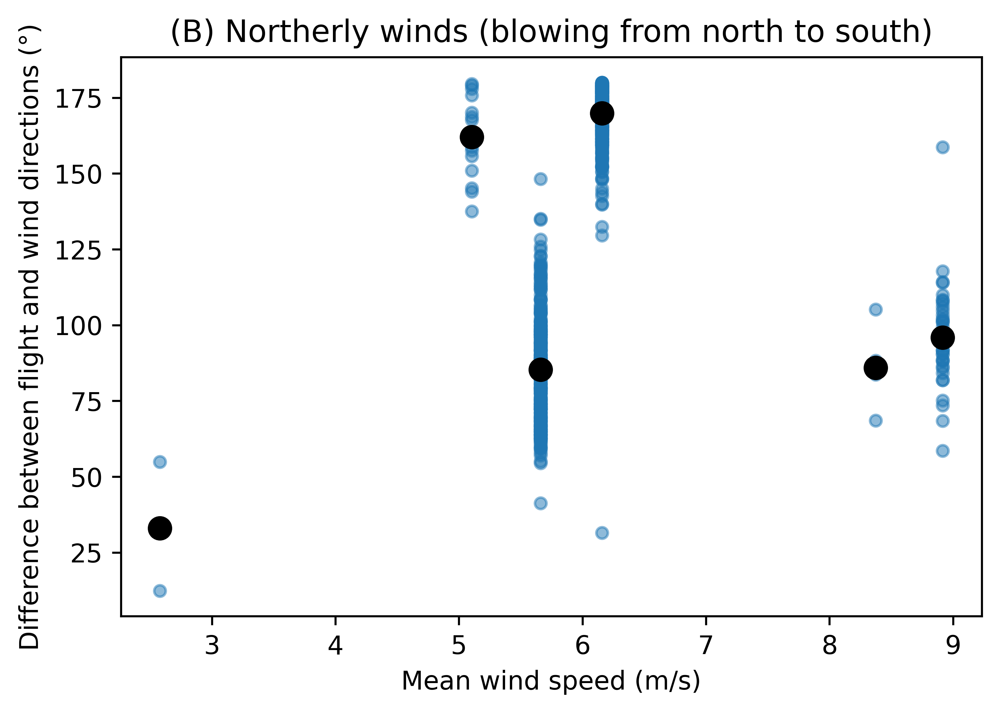

In [55]:
first_plot = df_m_added_cols_north.plot.scatter('mean_wind_speed', 'difference_directions', alpha=0.5)

# df_m_mean_diff_north.plot.scatter('mean_wind_speed', 'mean_difference', marker='x', s=72, color='red', 
#                                   ax=first_plot)

df_m_mean_diff_north.plot.scatter('mean_wind_speed', 'mean_difference', marker='o', s=72, color='black', 
                                  ax=first_plot)

plt.xlabel('Mean wind speed (m/s)')

plt.ylabel('Difference between flight and wind directions (°)')

plt.title('(B) Northerly winds (blowing from north to south)')

plt.show()

In [56]:
df_m_added_cols_south = df_m_added_cols[(df_m_added_cols['mean_wind_direction'] < 90) | 
                                        (df_m_added_cols['mean_wind_direction'] >= 270)]
print(df_m_added_cols_south.shape)

df_m_added_cols_south.head(2)

(1155, 46)


,trackID,timeUTC,sunSet,sunRise,minAfterSet,minBefRise,locLon,locLat,startFrm,endFrm,noFrames,frmsDet,durSec,moonSpd,scrnAzimuth,avgPixSz,moonElevation,moonAzimuth,moonDistance,camRotCorr,moonDiamPix,vidDim,bearing,maxPix,date,actual_time,actual_hours,actual_minutes,actual_seconds,actual_minutes_converted,actual_seconds_converted,actual_time_converted,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_difference,min_direction,max_direction,difference_directions
818,KES120210327072209_37,2021-03-27 07:32:38,2021-03-27 00:47:34,2021-03-27 12:24:44,405.07,292.10,-97.52,34.98,18863,18868,6,5,0.200000,0.1331,69.794884,15.2,51.72,235.75,362466,-0.174533,924,968,2.31,25.0,20210327,073238,7,32,38,0.533333,0.010556,7.543889,073723,273.374945,6.957543,14.447251,7,37,23,0.616667,0.006389,7.623056,0.079167,2.310000,14.447251,12.137251
819,KES120210327072209_38,2021-03-27 07:32:52,2021-03-27 00:47:34,2021-03-27 12:24:44,405.30,291.87,-97.52,34.98,19281,19284,4,4,0.133333,0.1753,77.724771,43.5,51.68,235.81,362468,-0.174533,924,968,353.38,49.0,20210327,073252,7,32,52,0.533333,0.014444,7.547778,073723,273.374945,6.957543,14.447251,7,37,23,0.616667,0.006389,7.623056,0.075278,14.447251,353.380000,21.067251


In [57]:
df_m_mean_diff_south = df_m_added_cols_south[['difference_directions', 'mean_wind_speed']].groupby(
    ['mean_wind_speed']).mean()

df_m_mean_diff_south = df_m_mean_diff_south.rename(columns={'difference_directions': 'mean_difference'})

df_m_mean_diff_south = df_m_mean_diff_south.reset_index()

print(df_m_mean_diff_south.shape)

df_m_mean_diff_south

(10, 2)


,mean_wind_speed,mean_difference
0,2.859629,33.314345
1,5.192957,36.431474
2,5.542444,24.526716
3,5.695640,13.629313
4,5.988305,35.132646
5,6.463170,16.377320
6,6.957543,21.729090
7,8.497022,11.598745
8,9.851682,12.612187
9,11.747793,28.987778


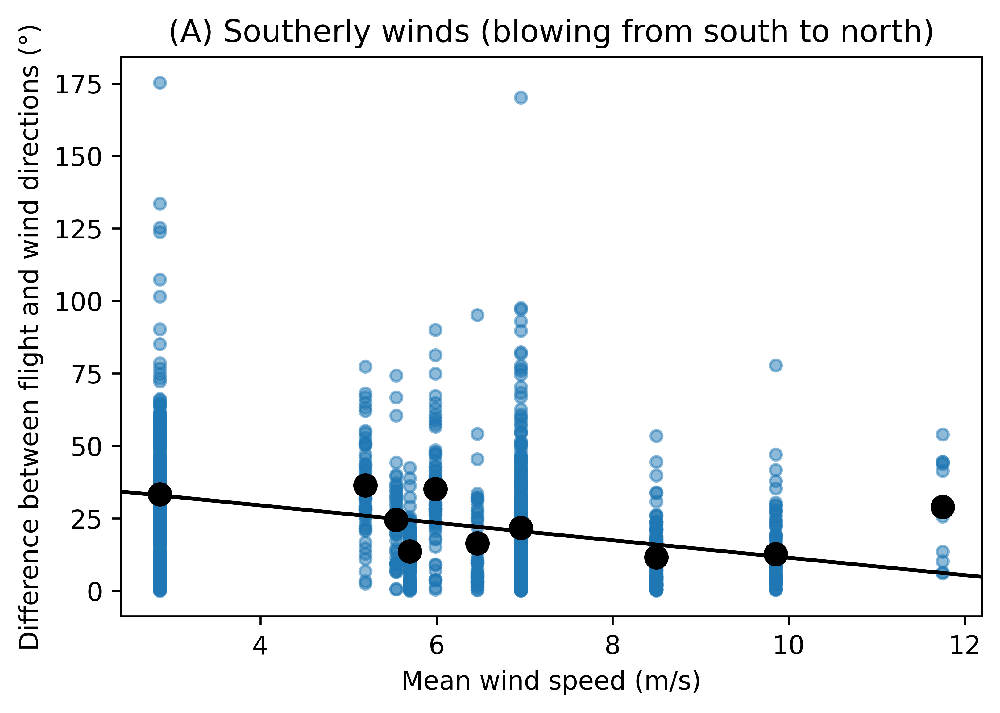

In [58]:
first_plot = df_m_added_cols_south.plot.scatter('mean_wind_speed', 'difference_directions', alpha=0.5)

# second_plot = df_m_mean_diff_south.plot.scatter('mean_wind_speed', 'mean_difference', marker='x', s=72, 
#                                                 color='red', ax=first_plot)

second_plot = df_m_mean_diff_south.plot.scatter('mean_wind_speed', 'mean_difference', marker='o', s=72, 
                                                color='black', ax=first_plot)

model_ols = smf.ols(formula='difference_directions ~ mean_wind_speed', data=df_m_added_cols_south)

res_ols = model_ols.fit()

abline_plot(model_results=res_ols, ax=second_plot, color='black')

plt.xlabel('Mean wind speed (m/s)')

plt.ylabel('Difference between flight and wind directions (°)')

plt.title('(A) Southerly winds (blowing from south to north)')

plt.show()

In [59]:
scipy.stats.pearsonr(df_m_added_cols_south['mean_wind_speed'], df_m_added_cols_south['difference_directions'])

(-0.3289834877996311, 1.4840448477287962e-30)

In [60]:
scipy.stats.pearsonr(df_m_added_cols_north['mean_wind_speed'], df_m_added_cols_north['difference_directions'])

(0.12264859647996118, 0.0002877217847799524)

In [61]:
# df_m_added_cols.plot.scatter('mean_wind_speed', 'moonSpd')

# plt.show()

In [62]:
df_m_cnt_date = df_m_added_cols[['trackID', 'date']].groupby(['date']).count()

df_m_cnt_date = df_m_cnt_date.rename(columns={'trackID': 'track_cnt'})

df_m_cnt_date = df_m_cnt_date.reset_index()

print(len(df_m_cnt_date))

df_m_cnt_date

6


,date,track_cnt
0,20210327,1138
1,20210328,3
2,20210329,281
3,20210330,123
4,20210425,380
5,20210526,100


In [63]:
df_m_cnt_res = df_m_added_cols[['trackID', 'date', 'time']].groupby(['date', 'time']).count()

df_m_cnt_res = df_m_cnt_res.rename(columns={'trackID': 'track_cnt'})

df_m_cnt_res = df_m_cnt_res.reset_index()

print(df_m_cnt_res.shape)

df_m_cnt_res

(208, 3)


,date,time,track_cnt
0,20210327,011207,9
1,20210327,012142,8
2,20210327,013117,8
3,20210327,014053,7
4,20210327,015028,9
...,...,...,...
203,20210526,053903,1
204,20210526,054553,1
205,20210526,054921,2
206,20210526,055619,1


In [64]:
df_sum_of_eta = df_m_added_cols[['date', 'hours', 'time', 'sum_of_eta']].drop_duplicates()
print(df_sum_of_eta.shape)

df_sum_of_eta

(208, 4)


,date,hours,time,sum_of_eta
0,20210327,1,011207,79.127213
8,20210327,1,012142,104.884437
17,20210327,1,013117,93.991138
25,20210327,1,014053,82.288660
32,20210327,1,015028,79.433407
...,...,...,...,...
2017,20210526,4,045734,425.812954
2020,20210526,5,051508,411.899164
2021,20210526,5,051827,391.238961
2022,20210526,5,052152,409.415256


In [65]:
df_m_cnt_sum_eta = df_sum_of_eta.merge(df_m_cnt_res, on=['date', 'time'])
print(df_m_cnt_sum_eta.shape)

df_m_cnt_sum_eta

(208, 5)


,date,hours,time,sum_of_eta,track_cnt
0,20210327,1,011207,79.127213,9
1,20210327,1,012142,104.884437,8
2,20210327,1,013117,93.991138,8
3,20210327,1,014053,82.288660,7
4,20210327,1,015028,79.433407,9
...,...,...,...,...,...
203,20210526,4,045734,425.812954,2
204,20210526,5,051508,411.899164,1
205,20210526,5,051827,391.238961,2
206,20210526,5,052152,409.415256,1


In [66]:
df_m_cnt_hour_res = df_m_cnt_sum_eta[['track_cnt', 'date', 'hours']].groupby(['date', 'hours']).sum()

df_m_cnt_hour_res = df_m_cnt_hour_res.reset_index()

print(len(df_m_cnt_hour_res))

df_m_cnt_hour_res

36


,date,hours,track_cnt
0,20210327,1,41
1,20210327,2,89
2,20210327,3,126
3,20210327,4,132
4,20210327,5,150
5,20210327,6,189
6,20210327,7,178
7,20210327,8,114
8,20210327,9,89
9,20210327,10,30


In [67]:
df_sum_eta_hour = df_m_cnt_sum_eta[['sum_of_eta', 'date', 'hours']].groupby(['date', 'hours']).sum()

df_sum_eta_hour = df_sum_eta_hour.reset_index()

print(len(df_sum_eta_hour))

df_sum_eta_hour

36


,date,hours,sum_of_eta
0,20210327,1,439.724855
1,20210327,2,759.244175
2,20210327,3,1203.867856
3,20210327,4,1643.332009
4,20210327,5,1749.634597
5,20210327,6,1917.137084
6,20210327,7,1610.663085
7,20210327,8,2234.789323
8,20210327,9,3973.837791
9,20210327,10,415.176648


In [68]:
df_m_cnt_sum_eta_cnt_hour = df_sum_eta_hour.merge(df_m_cnt_hour_res, on=['date', 'hours'])
print(len(df_m_cnt_sum_eta_cnt_hour))

df_m_cnt_sum_eta_cnt_hour

36


,date,hours,sum_of_eta,track_cnt
0,20210327,1,439.724855,41
1,20210327,2,759.244175,89
2,20210327,3,1203.867856,126
3,20210327,4,1643.332009,132
4,20210327,5,1749.634597,150
5,20210327,6,1917.137084,189
6,20210327,7,1610.663085,178
7,20210327,8,2234.789323,114
8,20210327,9,3973.837791,89
9,20210327,10,415.176648,30


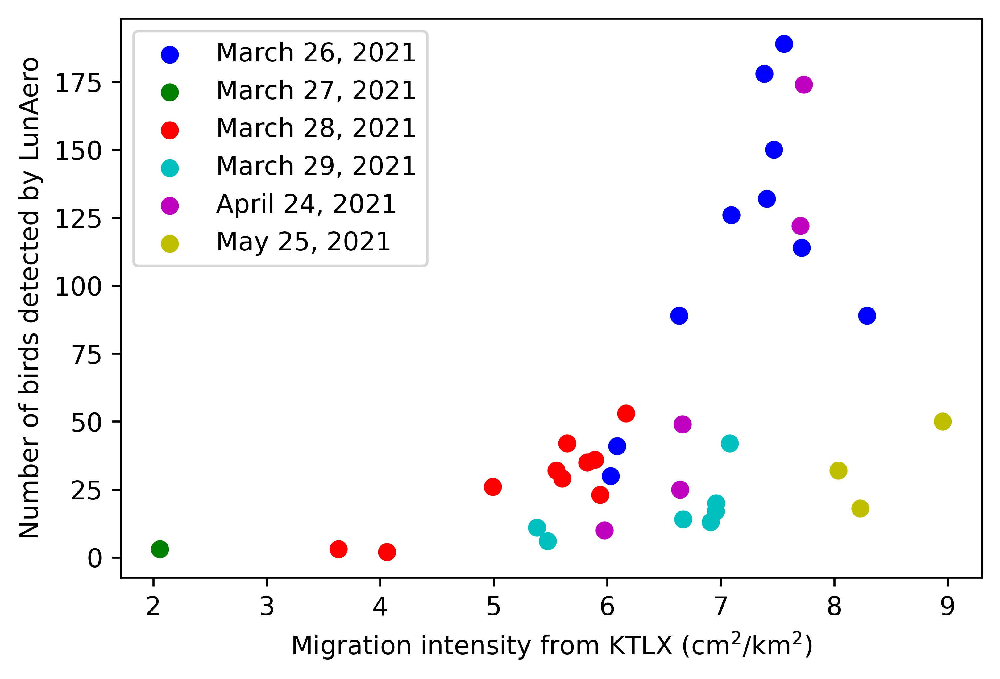

In [69]:
fig, ax = plt.subplots()

dates = ['March 26, 2021', 'March 27, 2021', 'March 28, 2021', 'March 29, 2021', 'April 24, 2021', 'May 25, 2021']

colors = ['b', 'g', 'r', 'c', 'm', 'y']

for i in range(len(dates)):
    
    df_subset = df_m_cnt_sum_eta_cnt_hour[
        df_m_cnt_sum_eta_cnt_hour['date'] == df_m_cnt_sum_eta_cnt_hour['date'].unique()[i]]

    ax.scatter(np.log(df_subset['sum_of_eta']), df_subset['track_cnt'], c=colors[i], label=dates[i])

ax.legend()

plt.xlabel('Migration intensity from KTLX ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.ylabel('Number of birds detected by LunAero')

plt.show()

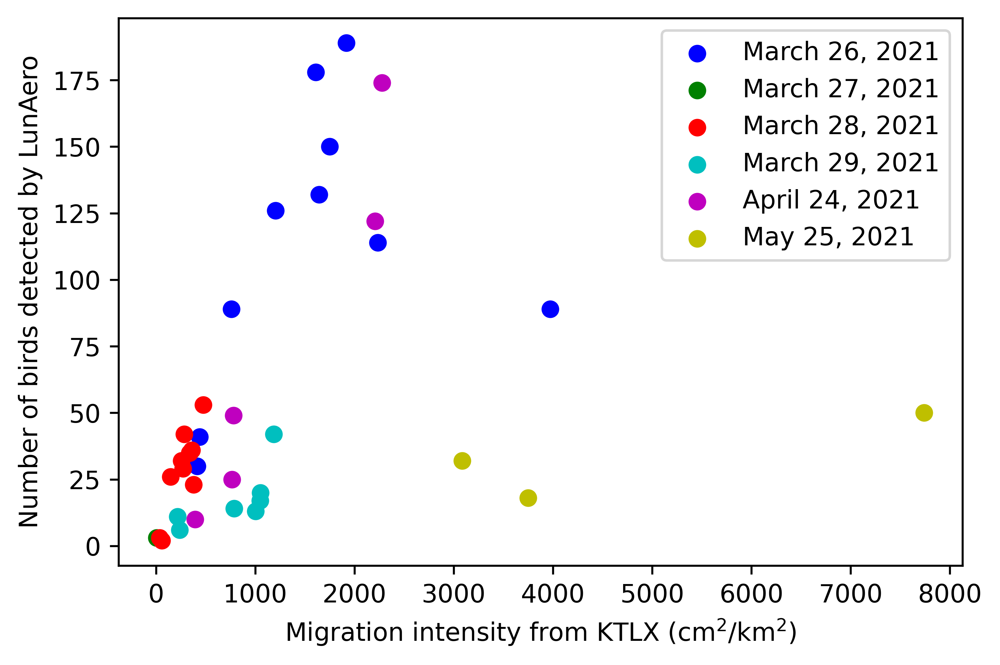

In [70]:
fig, ax = plt.subplots(dpi=600)

dates = ['March 26, 2021', 'March 27, 2021', 'March 28, 2021', 'March 29, 2021', 'April 24, 2021', 'May 25, 2021']

colors = ['b', 'g', 'r', 'c', 'm', 'y']

for i in range(len(dates)):
    
    df_subset = df_m_cnt_sum_eta_cnt_hour[
        df_m_cnt_sum_eta_cnt_hour['date'] == df_m_cnt_sum_eta_cnt_hour['date'].unique()[i]]

    ax.scatter(df_subset['sum_of_eta'], df_subset['track_cnt'], c=colors[i], label=dates[i])

ax.legend()

plt.xlabel('Migration intensity from KTLX ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.ylabel('Number of birds detected by LunAero')

plt.show()

In [71]:
scipy.stats.pearsonr(df_m_cnt_sum_eta_cnt_hour['sum_of_eta'], df_m_cnt_sum_eta_cnt_hour['track_cnt'])

(0.32224343307864833, 0.05527546034072357)

In [72]:
df_m_cnt_sum_eta_cnt_hour_3_4 = df_m_cnt_sum_eta_cnt_hour[df_m_cnt_sum_eta_cnt_hour['date'] != '20210526']
print(len(df_m_cnt_sum_eta_cnt_hour_3_4))

33


In [73]:
scipy.stats.pearsonr(df_m_cnt_sum_eta_cnt_hour_3_4['sum_of_eta'], df_m_cnt_sum_eta_cnt_hour_3_4['track_cnt'])

(0.7138511738932276, 3.0974895498843093e-06)

In [74]:
df_m_cnt_sum_eta_cnt_hour_5 = df_m_cnt_sum_eta_cnt_hour[df_m_cnt_sum_eta_cnt_hour['date'] == '20210526']
print(len(df_m_cnt_sum_eta_cnt_hour_5))

3


In [75]:
scipy.stats.pearsonr(df_m_cnt_sum_eta_cnt_hour_5['sum_of_eta'], df_m_cnt_sum_eta_cnt_hour_5['track_cnt'])

(0.834247340154183, 0.37180503045001206)

In [76]:
filename = 'avian_flight_calls.csv'

df_rec = pd.read_csv(filename)
print(df_rec.shape)

df_rec.head(2)

(246, 24)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination
0,Spring,2021,thrush,NOMO,0,Kessler,3/27/21,20:00:00,11:00:00,6:28:08,2:28:08,3/28/21 2:28,2:30:00,no,3/27/21 19:47,3/27/21 20:13,3/27/21 20:42,3/27/21 21:13,3/28/21 5:56,3/28/21 6:26,3/28/21 6:56,3/28/21 7:22,54.4,99.5
1,Spring,2021,thrush,NOMO,0,Kessler,3/27/21,20:00:00,11:00:00,6:28:09,2:28:08,3/28/21 2:28,2:30:00,yes,3/27/21 19:47,3/27/21 20:13,3/27/21 20:42,3/27/21 21:13,3/28/21 5:56,3/28/21 6:26,3/28/21 6:56,3/28/21 7:22,54.4,99.5


In [77]:
df_rec['date'].unique()

array(['3/27/21', '3/29/21', '3/30/21', '4/25/21', '5/26/21', '3/28/21'],
      dtype=object)

In [78]:
df_rec = df_rec[df_rec['Mig'] == 1]
print(df_rec.shape)

df_rec.head(2)

# duplicate?
# detection_time?

(88, 24)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4
69,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:17,20:31:17,3/30/21 20:31,20:30:00,yes,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4


In [79]:
df_rec['date'].unique()

array(['3/30/21', '4/25/21', '5/26/21', '3/28/21'], dtype=object)

In [80]:
df_rec = df_rec[df_rec['duplicate'] == 'no']
print(df_rec.shape)

df_rec.head(2)

(66, 24)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4
70,Spring,2021,thrush,PESA,1,Kessler,3/30/21,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8


In [81]:
df_rec['local_time_datetime'] = pd.to_datetime(df_rec['real_detection_time.1'])
print(df_rec.shape)

df_rec.head(2)

(66, 25)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00
70,Spring,2021,thrush,PESA,1,Kessler,3/30/21,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00


In [82]:
df_rec['local_time_datetime'] = df_rec['local_time_datetime'].dt.tz_localize(tz='US/Central')
print(df_rec.shape)

df_rec.head(2)

(66, 25)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00
70,Spring,2021,thrush,PESA,1,Kessler,3/30/21,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00


In [83]:
df_rec['time_utc_datetime'] = df_rec['local_time_datetime'].dt.tz_convert(None)
print(df_rec.shape)

df_rec.head(2)

(66, 26)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00
70,Spring,2021,thrush,PESA,1,Kessler,3/30/21,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00


In [84]:
df_rec['date_datetime'] = pd.to_datetime(df_rec['date'])
print(df_rec.shape)

df_rec.head(2)

(66, 27)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime
68,Spring,2021,thrush,CANG,1,Kessler,3/30/21,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00,2021-03-30
70,Spring,2021,thrush,PESA,1,Kessler,3/30/21,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00,2021-03-30


In [85]:
df_rec['date'] = df_rec['date_datetime'].dt.strftime('%Y%m%d')
print(df_rec.shape)

df_rec.head(2)

(66, 27)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime
68,Spring,2021,thrush,CANG,1,Kessler,20210330,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00,2021-03-30
70,Spring,2021,thrush,PESA,1,Kessler,20210330,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00,2021-03-30


In [86]:
df_rec['hours'] = pd.to_numeric(df_rec['time_utc_datetime'].dt.strftime('%H'))
print(df_rec.shape)

df_rec.head(2)

(66, 28)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours
68,Spring,2021,thrush,CANG,1,Kessler,20210330,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00,2021-03-30,1
70,Spring,2021,thrush,PESA,1,Kessler,20210330,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00,2021-03-30,10


In [87]:
len(df_rec['species'].unique())

15

In [88]:
df_rec_cnt_date = df_rec[['date', 'hours']].groupby(['date']).count()

df_rec_cnt_date = df_rec_cnt_date.rename(columns={'hours': 'number_of_birds'})

df_rec_cnt_date = df_rec_cnt_date.reset_index()

print(df_rec_cnt_date.shape)

df_rec_cnt_date

(4, 2)


,date,number_of_birds
0,20210328,4
1,20210330,2
2,20210425,41
3,20210526,19


In [89]:
df_rec_cnt_date_species = df_rec[['date', 'species', 'hours']].groupby(['date', 'species']).count()

df_rec_cnt_date_species = df_rec_cnt_date_species.rename(columns={'hours': 'number_of_birds'})

df_rec_cnt_date_species = df_rec_cnt_date_species.reset_index()

print(df_rec_cnt_date_species.shape)

df_rec_cnt_date_species

(18, 3)


,date,species,number_of_birds
0,20210328,PROW,1
1,20210328,SAVS,3
2,20210330,CANG,1
3,20210330,PESA,1
4,20210425,CCSP,4
5,20210425,CHSP,1
6,20210425,GRSP,5
7,20210425,LEYE,1
8,20210425,SAVS,4
9,20210425,SWTH,4


In [90]:
df_rec['date_hour_datetime'] = pd.to_datetime(df_rec['local_time_datetime'].dt.strftime('%Y-%m-%d %H'))
print(df_rec.shape)

df_rec.head(2)

(66, 29)


,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours,date_hour_datetime
68,Spring,2021,thrush,CANG,1,Kessler,20210330,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00,2021-03-30,1,2021-03-30 20:00:00
70,Spring,2021,thrush,PESA,1,Kessler,20210330,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00,2021-03-30,10,2021-03-31 05:00:00


In [91]:
df_rec_cnt_hour = df_rec[['date_hour_datetime', 'date', 'hours', 'species']].groupby(
    ['date_hour_datetime', 'date', 'hours']).count()

df_rec_cnt_hour = df_rec_cnt_hour.rename(columns={'species': 'number_of_birds'})

df_rec_cnt_hour = df_rec_cnt_hour.reset_index()

print(df_rec_cnt_hour.shape)

df_rec_cnt_hour

(21, 4)


,date_hour_datetime,date,hours,number_of_birds
0,2021-03-28 22:00:00,20210328,3,1
1,2021-03-28 23:00:00,20210328,4,1
2,2021-03-29 00:00:00,20210328,5,1
3,2021-03-29 01:00:00,20210328,6,1
4,2021-03-30 20:00:00,20210330,1,1
5,2021-03-31 05:00:00,20210330,10,1
6,2021-04-25 20:00:00,20210425,1,3
7,2021-04-25 21:00:00,20210425,2,1
8,2021-04-25 23:00:00,20210425,4,2
9,2021-04-26 00:00:00,20210425,5,6


In [92]:
df_rec_cnt_hour_species = df_rec[['date', 'hours', 'species', 'season']].groupby(['date', 'hours', 'species']).count()

df_rec_cnt_hour_species = df_rec_cnt_hour_species.rename(columns={'species': 'number_of_birds'})

df_rec_cnt_hour_species = df_rec_cnt_hour_species.reset_index()

print(df_rec_cnt_hour_species.shape)

df_rec_cnt_hour_species

(40, 4)


,date,hours,species,season
0,20210328,3,PROW,1
1,20210328,4,SAVS,1
2,20210328,5,SAVS,1
3,20210328,6,SAVS,1
4,20210330,1,CANG,1
5,20210330,10,PESA,1
6,20210425,1,UPSA,3
7,20210425,2,UPSA,1
8,20210425,4,UPSA,1
9,20210425,4,WCSP,1


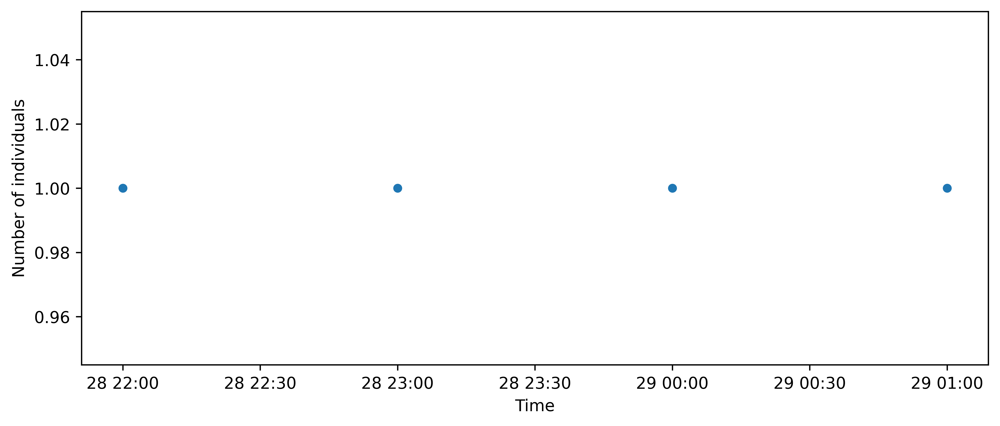

In [93]:
df_rec_cnt_hour[df_rec_cnt_hour['date'] == '20210328'].plot.scatter(
    x='date_hour_datetime', y='number_of_birds', figsize=(10,4))

plt.xlabel('Time')

plt.ylabel('Number of individuals')

plt.show()

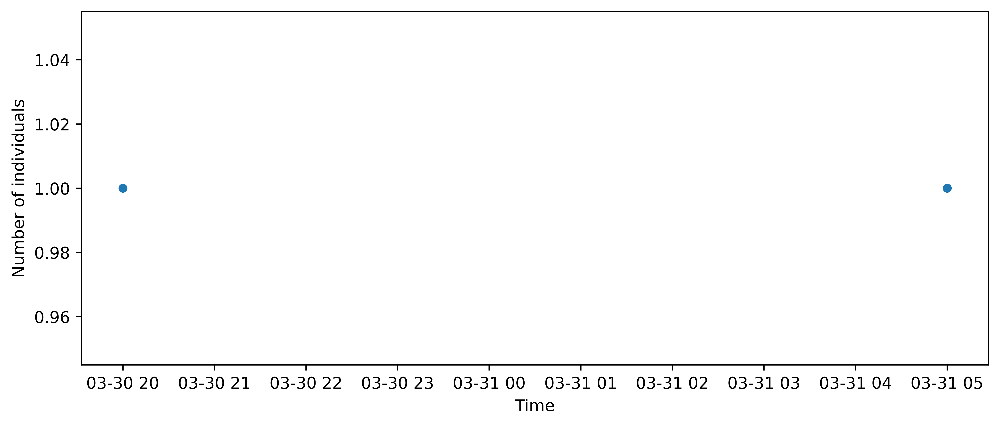

In [94]:
df_rec_cnt_hour[df_rec_cnt_hour['date'] == '20210330'].plot.scatter(
    x='date_hour_datetime', y='number_of_birds', figsize=(10,4))

plt.xlabel('Time')

plt.ylabel('Number of individuals')

plt.show()

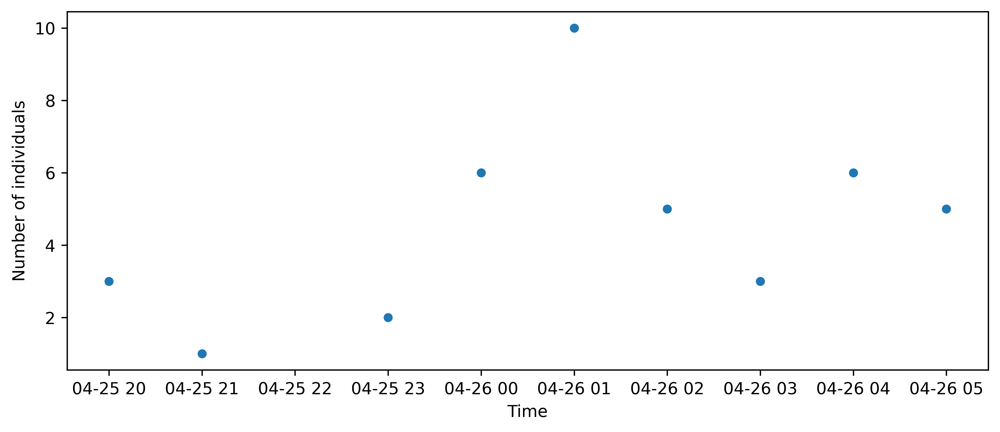

In [95]:
df_rec_cnt_hour[df_rec_cnt_hour['date'] == '20210425'].plot.scatter(
    x='date_hour_datetime', y='number_of_birds', figsize=(10,4))

plt.xlabel('Time')

plt.ylabel('Number of individuals')

plt.show()

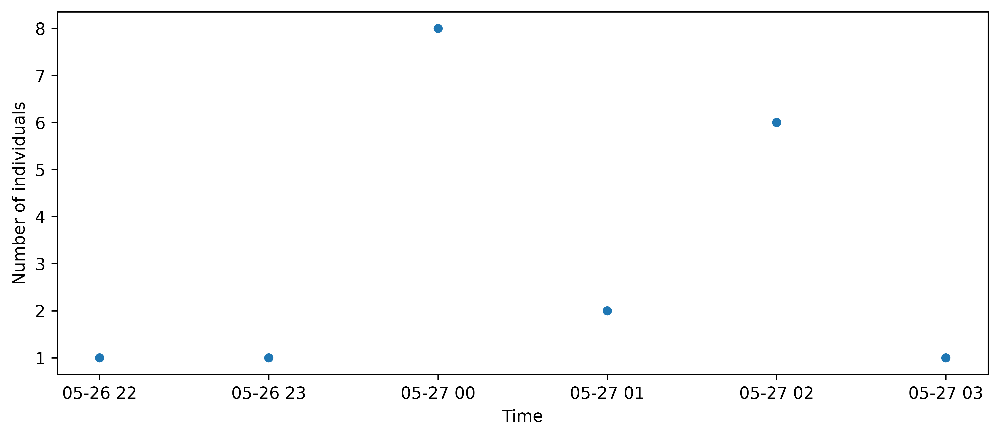

In [96]:
df_rec_cnt_hour[df_rec_cnt_hour['date'] == '20210526'].plot.scatter(
    x='date_hour_datetime', y='number_of_birds', figsize=(10,4))

plt.xlabel('Time')

plt.ylabel('Number of individuals')

plt.show()

In [97]:
df_m_sum_eta_rec_cnt_hour = df_m_cnt_sum_eta_cnt_hour.merge(df_rec_cnt_hour[['date', 'hours', 'number_of_birds']], 
                                                        on=['date', 'hours'])
print(df_m_sum_eta_rec_cnt_hour.shape)

df_m_sum_eta_rec_cnt_hour

(8, 5)


,date,hours,sum_of_eta,track_cnt,number_of_birds
0,20210330,10,217.121805,11,1
1,20210425,2,2276.881597,174,1
2,20210425,4,766.111316,25,2
3,20210425,8,393.925903,10,3
4,20210425,9,782.090662,49,6
5,20210526,3,3085.790793,32,1
6,20210526,4,7739.951357,50,1
7,20210526,5,3750.767471,18,8


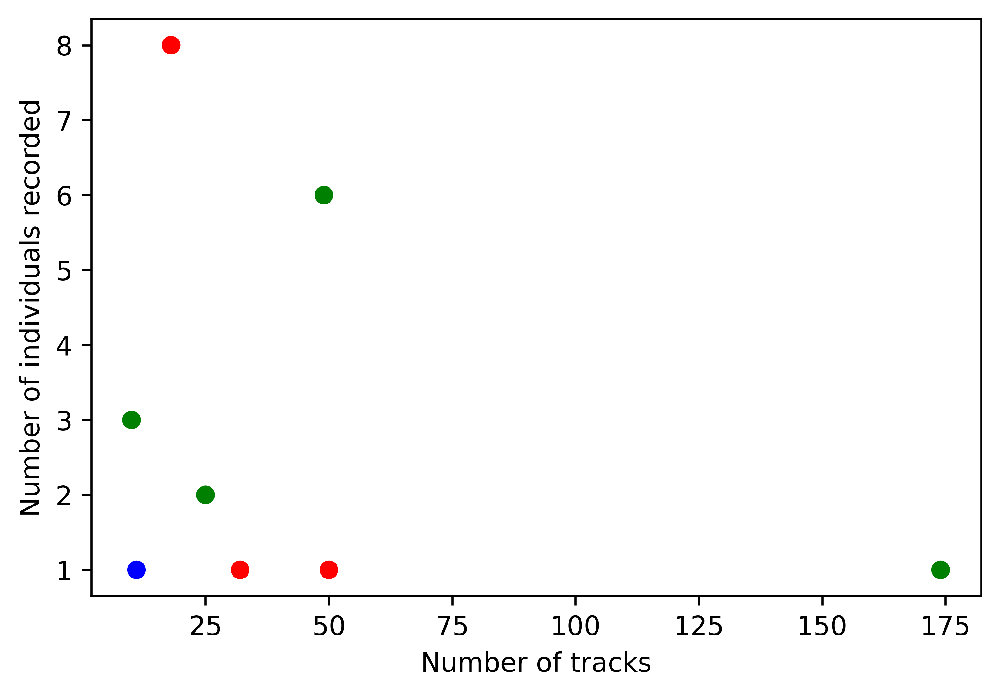

In [98]:
plt.scatter(df_m_sum_eta_rec_cnt_hour['track_cnt'], df_m_sum_eta_rec_cnt_hour['number_of_birds'], 
            c=df_m_sum_eta_rec_cnt_hour['date'].map(
                dict(zip(df_m_sum_eta_rec_cnt_hour['date'].unique(), ['b', 'g', 'r', 'c']))))

plt.xlabel('Number of tracks')

plt.ylabel('Number of individuals recorded')

plt.show()

In [99]:
dict(zip(df_m_sum_eta_rec_cnt_hour['date'].unique(), ['b', 'g', 'r']))

{'20210330': 'b', '20210425': 'g', '20210526': 'r'}

In [100]:
df_sum_eta_hour = df_all_added_cols[['date', 'hours', 'sum_of_eta']].groupby(['date', 'hours']).sum()

df_sum_eta_hour = df_sum_eta_hour.reset_index()

print(df_sum_eta_hour.shape)

df_sum_eta_hour

(62, 3)


,date,hours,sum_of_eta
0,20210327,0,563.742690
1,20210327,1,484.347927
2,20210327,2,759.244175
3,20210327,3,1203.867856
4,20210327,4,1643.332009
...,...,...,...
57,20210526,7,4404.790433
58,20210526,8,2691.660317
59,20210526,9,1682.896986
60,20210526,10,300.701057


In [101]:
df_sum_eta_rec_cnt_hour = df_sum_eta_hour.merge(df_rec_cnt_hour[['date', 'hours', 'number_of_birds']], 
                                                        on=['date', 'hours'])
print(df_sum_eta_rec_cnt_hour.shape)

df_sum_eta_rec_cnt_hour

(17, 4)


,date,hours,sum_of_eta,number_of_birds
0,20210330,1,289.113719,1
1,20210330,10,669.630811,1
2,20210425,1,966.710124,3
3,20210425,2,2276.881597,1
4,20210425,4,2319.937731,2
5,20210425,5,2314.416427,6
6,20210425,6,2757.401875,10
7,20210425,7,2489.994610,5
8,20210425,8,2409.263812,3
9,20210425,9,2297.143076,6


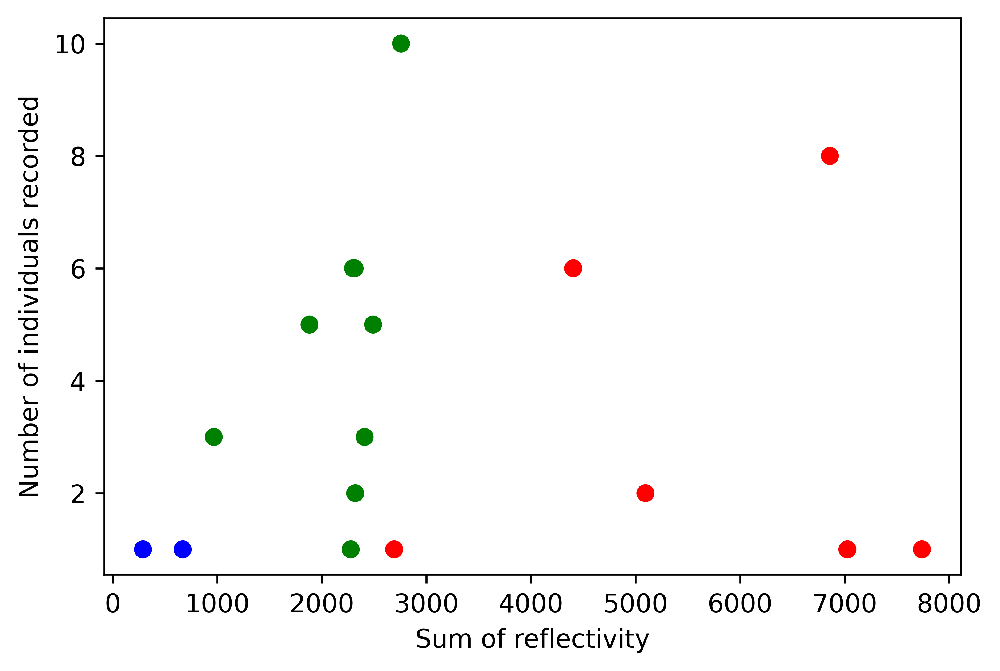

In [102]:
plt.scatter(df_sum_eta_rec_cnt_hour['sum_of_eta'], df_sum_eta_rec_cnt_hour['number_of_birds'], 
            c=df_sum_eta_rec_cnt_hour['date'].map(
                dict(zip(df_sum_eta_rec_cnt_hour['date'].unique(), ['b', 'g', 'r']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Number of individuals recorded')

plt.show()

In [103]:
dict(zip(df_sum_eta_rec_cnt_hour['date'].unique(), ['b', 'g', 'r']))

{'20210330': 'b', '20210425': 'g', '20210526': 'r'}

In [104]:
df_rec_20210328 = df_rec[df_rec['date'] == '20210328']

df_rec_20210328 = df_rec_20210328.reset_index()

print(df_rec_20210328.shape)

df_rec_20210328.head(2)

(4, 30)


,index,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours,date_hour_datetime
0,152,Spring,2021,tseep,PROW,1,Kessler,20210328,20:00:00,11:00:00,2:52:51,22:52:51,3/28/21 22:52,23:00:00,no,3/28/21 19:48,3/28/21 20:13,3/28/21 20:43,3/28/21 21:14,3/29/21 5:55,3/29/21 6:25,3/29/21 6:55,3/29/21 7:20,32.0,99.6,2021-03-28 22:52:00-05:00,2021-03-29 03:52:00,2021-03-28,3,2021-03-28 22:00:00
1,153,Spring,2021,tseep,SAVS,1,Kessler,20210328,20:00:00,11:00:00,3:20:06,23:20:06,3/28/21 23:20,23:30:00,no,3/28/21 19:48,3/28/21 20:13,3/28/21 20:43,3/28/21 21:14,3/29/21 5:55,3/29/21 6:25,3/29/21 6:55,3/29/21 7:20,36.5,99.6,2021-03-28 23:20:00-05:00,2021-03-29 04:20:00,2021-03-28,4,2021-03-28 23:00:00


In [105]:
df_rec_20210330 = df_rec[df_rec['date'] == '20210330']

df_rec_20210330 = df_rec_20210330.reset_index()

print(df_rec_20210330.shape)

df_rec_20210330.head(2)

(2, 30)


,index,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours,date_hour_datetime
0,68,Spring,2021,thrush,CANG,1,Kessler,20210330,20:00:00,11:00:00,0:31:16,20:31:16,3/30/21 20:31,20:30:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,-22.1,92.4,2021-03-30 20:31:00-05:00,2021-03-31 01:31:00,2021-03-30,1,2021-03-30 20:00:00
1,70,Spring,2021,thrush,PESA,1,Kessler,20210330,20:00:00,11:00:00,9:54:17,5:54:17,3/31/21 5:54,6:00:00,no,3/30/21 19:50,3/30/21 20:15,3/30/21 20:45,3/30/21 21:16,3/31/21 5:52,3/31/21 6:22,3/31/21 6:52,3/31/21 7:17,32.0,89.8,2021-03-31 05:54:00-05:00,2021-03-31 10:54:00,2021-03-30,10,2021-03-31 05:00:00


In [106]:
df_rec_20210425 = df_rec[df_rec['date'] == '20210425']

df_rec_20210425 = df_rec_20210425.reset_index()

print(df_rec_20210425.shape)

df_rec_20210425.head(2)

(41, 30)


,index,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours,date_hour_datetime
0,71,Spring,2021,thrush,UPSA,1,Kessler,20210425,20:30:00,10:30:00,0:14:28,20:44:27,4/25/21 20:44,20:30:00,no,4/25/21 20:10,4/25/21 20:37,4/25/21 21:09,4/25/21 21:43,4/26/21 5:12,4/26/21 5:45,4/26/21 6:17,4/26/21 6:44,22.0,98.1,2021-04-25 20:44:00-05:00,2021-04-26 01:44:00,2021-04-25,1,2021-04-25 20:00:00
1,74,Spring,2021,thrush,UPSA,1,Kessler,20210425,20:30:00,10:30:00,0:19:38,20:49:38,4/25/21 20:49,21:00:00,no,4/25/21 20:10,4/25/21 20:37,4/25/21 21:09,4/25/21 21:43,4/26/21 5:12,4/26/21 5:45,4/26/21 6:17,4/26/21 6:44,23.0,98.1,2021-04-25 20:49:00-05:00,2021-04-26 01:49:00,2021-04-25,1,2021-04-25 20:00:00


In [107]:
df_rec_20210526 = df_rec[df_rec['date'] == '20210526']

df_rec_20210526 = df_rec_20210526.reset_index()

print(df_rec_20210526.shape)

df_rec_20210526.head(2)

(19, 30)


,index,season,year,detector,species,Mig,site,date,recording_start,recording_length,detection_time,real_detection_time,real_detection_time.1,rounded_to_half_hour,duplicate,sunset,civil_dusk,nautical_dusk,astronomical_dusk,astronomical_dawn,nautical_dawn,civil_dawn,sunrise,moon_altitude,moon_illumination,local_time_datetime,time_utc_datetime,date_datetime,hours,date_hour_datetime
0,123,Spring,2021,thrush,SWTH,1,Kessler,20210526,20:30:00,10:30:00,3:04:22,23:34:22,5/26/21 23:34,23:30:00,no,5/26/21 20:35,5/26/21 21:04,5/26/21 21:39,5/26/21 22:17,5/27/21 4:36,5/27/21 5:14,5/27/21 5:50,5/27/21 6:19,20.0,99.2,2021-05-26 23:34:00-05:00,2021-05-27 04:34:00,2021-05-26,4,2021-05-26 23:00:00
1,124,Spring,2021,thrush,SWTH,1,Kessler,20210526,20:30:00,10:30:00,3:37:17,0:07:17,5/27/21 0:07,0:00:00,no,5/26/21 20:35,5/26/21 21:04,5/26/21 21:39,5/26/21 22:17,5/27/21 4:36,5/27/21 5:14,5/27/21 5:50,5/27/21 6:19,23.7,99.2,2021-05-27 00:07:00-05:00,2021-05-27 05:07:00,2021-05-26,5,2021-05-27 00:00:00


In [108]:
df_rec_cnt_species_20210328 = df_rec_20210328[['species', 'hours']].groupby(['species']).count()

df_rec_cnt_species_20210328 = df_rec_cnt_species_20210328.rename(columns={'hours': '2021/03/28'})

df_rec_cnt_species_20210328 = df_rec_cnt_species_20210328.reset_index()

print(df_rec_cnt_species_20210328.shape)

df_rec_cnt_species_20210328

(2, 2)


,species,2021/03/28
0,PROW,1
1,SAVS,3


In [109]:
df_rec_cnt_species_20210330 = df_rec_20210330[['species', 'hours']].groupby(['species']).count()

df_rec_cnt_species_20210330 = df_rec_cnt_species_20210330.rename(columns={'hours': '2021/03/30'})

df_rec_cnt_species_20210330 = df_rec_cnt_species_20210330.reset_index()

print(df_rec_cnt_species_20210330.shape)

df_rec_cnt_species_20210330

(2, 2)


,species,2021/03/30
0,CANG,1
1,PESA,1


In [110]:
df_rec_cnt_species_20210425 = df_rec_20210425[['species', 'hours']].groupby(['species']).count()

df_rec_cnt_species_20210425 = df_rec_cnt_species_20210425.rename(columns={'hours': '2021/04/25'})

df_rec_cnt_species_20210425 = df_rec_cnt_species_20210425.reset_index()

print(df_rec_cnt_species_20210425.shape)

df_rec_cnt_species_20210425

(11, 2)


,species,2021/04/25
0,CCSP,4
1,CHSP,1
2,GRSP,5
3,LEYE,1
4,SAVS,4
5,SWTH,4
6,UPSA,14
7,VESP,2
8,WCSP,3
9,WIWA,2


In [111]:
df_rec_cnt_species_20210526 = df_rec_20210526[['species', 'hours']].groupby(['species']).count()

df_rec_cnt_species_20210526 = df_rec_cnt_species_20210526.rename(columns={'hours': '2021/05/26'})

df_rec_cnt_species_20210526 = df_rec_cnt_species_20210526.reset_index()

print(df_rec_cnt_species_20210526.shape)

df_rec_cnt_species_20210526

(3, 2)


,species,2021/05/26
0,CHSP,1
1,SWTH,17
2,YEWA,1


In [112]:
df_rec_cnt_species = df_rec_cnt_species_20210328.merge(df_rec_cnt_species_20210330, on='species', how='outer')
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(4, 3)


,species,2021/03/28,2021/03/30
0,PROW,1.0,NaN
1,SAVS,3.0,NaN
2,CANG,NaN,1.0
3,PESA,NaN,1.0


In [113]:
df_rec_cnt_species = df_rec_cnt_species.merge(df_rec_cnt_species_20210425, on='species', how='outer')
print(df_rec_cnt_species.shape)

df_rec_cnt_species = df_rec_cnt_species.merge(df_rec_cnt_species_20210526, on='species', how='outer')
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(14, 4)
(15, 5)


,species,2021/03/28,2021/03/30,2021/04/25,2021/05/26
0,PROW,1.0,NaN,NaN,NaN
1,SAVS,3.0,NaN,4.0,NaN
2,CANG,NaN,1.0,NaN,NaN
3,PESA,NaN,1.0,NaN,NaN
4,CCSP,NaN,NaN,4.0,NaN
5,CHSP,NaN,NaN,1.0,1.0
6,GRSP,NaN,NaN,5.0,NaN
7,LEYE,NaN,NaN,1.0,NaN
8,SWTH,NaN,NaN,4.0,17.0
9,UPSA,NaN,NaN,14.0,NaN


In [114]:
df_rec_cnt_species = df_rec_cnt_species.fillna(0)
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(15, 5)


,species,2021/03/28,2021/03/30,2021/04/25,2021/05/26
0,PROW,1.0,0.0,0.0,0.0
1,SAVS,3.0,0.0,4.0,0.0
2,CANG,0.0,1.0,0.0,0.0
3,PESA,0.0,1.0,0.0,0.0
4,CCSP,0.0,0.0,4.0,0.0
5,CHSP,0.0,0.0,1.0,1.0
6,GRSP,0.0,0.0,5.0,0.0
7,LEYE,0.0,0.0,1.0,0.0
8,SWTH,0.0,0.0,4.0,17.0
9,UPSA,0.0,0.0,14.0,0.0


In [115]:
df_rec_cnt_species[['2021/03/28', '2021/03/30', '2021/04/25', '2021/05/26']] = df_rec_cnt_species[['2021/03/28', '2021/03/30', '2021/04/25', '2021/05/26']].astype(int)
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(15, 5)


,species,2021/03/28,2021/03/30,2021/04/25,2021/05/26
0,PROW,1,0,0,0
1,SAVS,3,0,4,0
2,CANG,0,1,0,0
3,PESA,0,1,0,0
4,CCSP,0,0,4,0
5,CHSP,0,0,1,1
6,GRSP,0,0,5,0
7,LEYE,0,0,1,0
8,SWTH,0,0,4,17
9,UPSA,0,0,14,0


In [116]:
df_rec_cnt_species['Number of individuals per species'] = df_rec_cnt_species[[
    '2021/03/28', '2021/03/30', '2021/04/25', '2021/05/26']].sum(axis=1)
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(15, 6)


,species,2021/03/28,2021/03/30,2021/04/25,2021/05/26,Number of individuals per species
0,PROW,1,0,0,0,1
1,SAVS,3,0,4,0,7
2,CANG,0,1,0,0,1
3,PESA,0,1,0,0,1
4,CCSP,0,0,4,0,4
5,CHSP,0,0,1,1,2
6,GRSP,0,0,5,0,5
7,LEYE,0,0,1,0,1
8,SWTH,0,0,4,17,21
9,UPSA,0,0,14,0,14


In [117]:
df_rec_cnt_species.loc['Number of individuals per day', :] = df_rec_cnt_species[[
    '2021/03/28', '2021/03/30', '2021/04/25', '2021/05/26', 'Number of individuals per species']].sum(axis=0)
print(df_rec_cnt_species.shape)

df_rec_cnt_species

(16, 6)


,species,2021/03/28,2021/03/30,2021/04/25,2021/05/26,Number of individuals per species
0,PROW,1.0,0.0,0.0,0.0,1.0
1,SAVS,3.0,0.0,4.0,0.0,7.0
2,CANG,0.0,1.0,0.0,0.0,1.0
3,PESA,0.0,1.0,0.0,0.0,1.0
4,CCSP,0.0,0.0,4.0,0.0,4.0
5,CHSP,0.0,0.0,1.0,1.0,2.0
6,GRSP,0.0,0.0,5.0,0.0,5.0
7,LEYE,0.0,0.0,1.0,0.0,1.0
8,SWTH,0.0,0.0,4.0,17.0,21.0
9,UPSA,0.0,0.0,14.0,0.0,14.0


In [118]:
list_folders = sorted([i for i in os.listdir(path + 'vprs_PX-1000/') if '20210' in i])
print(len(list_folders))

print(list_folders)

6
['20210327', '20210328', '20210329', '20210330', '20210425', '20210526']


In [119]:
list_all_dates = []
list_all_times = []
list_sum_eta = []
list_all_hours = []
list_all_minutes = []
list_all_seconds = []
list_all_minutes_converted = []
list_all_seconds_converted = []
list_all_times_converted = []

for folder_index in range(len(list_folders)):
    
    path_to_file = 'vprs_PX-1000/' + list_folders[folder_index]

    list_files = sorted([i for i in os.listdir(path + path_to_file) if 'vpr_20210' in i])
    print(len(list_files))

    print(list_files)

    for file_index in range(len(list_files)):
        
        filename = list_files[file_index]
        
        print(path_to_file + '/' + filename)
        
        filename_date = filename[4:12]
        print(filename_date)

        filename_time = filename[13:19]
        print(filename_time)
        
        filename_time_hours = int(filename_time[0:2])
        print(filename_time_hours)

        filename_time_minutes = int(filename_time[2:4])
        print(filename_time_minutes)

        filename_time_seconds = int(filename_time[4:6])
        print(filename_time_seconds)

        filename_time_minutes_converted = filename_time_minutes/60
        print(filename_time_minutes_converted)

        filename_time_seconds_converted = filename_time_seconds/60/60
        print(filename_time_seconds_converted)

        filename_time_converted = filename_time_hours + filename_time_minutes_converted + \
        filename_time_seconds_converted
        print(filename_time_converted)
        
        list_all_dates.append(filename_date)
        
        list_all_times.append(filename_time)
        
        list_all_hours.append(filename_time_hours)
        
        list_all_minutes.append(filename_time_minutes)
        
        list_all_seconds.append(filename_time_seconds)
        
        list_all_minutes_converted.append(filename_time_minutes_converted)
        
        list_all_seconds_converted.append(filename_time_seconds_converted)
        
        list_all_times_converted.append(filename_time_converted)

        df = pd.read_csv(path_to_file + '/' + filename, names=['height', 'eta'])
        print(df.shape)

        # above ground level (meters)
        # reflectivity (cm^2/km^3)
        
        if filename_date == '20210526':
            
            max_height = 1
            
        else:
            
            max_height = 0.5
            
        if df['height'].dtype == 'O':
            
            df['height'] = df['height'].str.replace('q', '')
            
            df['height'] = pd.to_numeric(df['height'])
            
            print(df.shape)

        df = df[(df['height'] <= max_height)]
        print(df.shape)

        print(df.head(2))

#         df.plot.scatter('eta', 'height')

#         plt.show()
        
        list_sum_eta.append(df['eta'].sum(axis=0))

71
['vpr_20210327_000000.csv', 'vpr_20210327_001000.csv', 'vpr_20210327_002000.csv', 'vpr_20210327_003000.csv', 'vpr_20210327_004000.csv', 'vpr_20210327_005000.csv', 'vpr_20210327_010000.csv', 'vpr_20210327_011000.csv', 'vpr_20210327_012000.csv', 'vpr_20210327_013000.csv', 'vpr_20210327_014000.csv', 'vpr_20210327_015000.csv', 'vpr_20210327_020000.csv', 'vpr_20210327_021000.csv', 'vpr_20210327_022000.csv', 'vpr_20210327_023000.csv', 'vpr_20210327_024000.csv', 'vpr_20210327_025000.csv', 'vpr_20210327_030000.csv', 'vpr_20210327_031000.csv', 'vpr_20210327_032000.csv', 'vpr_20210327_033000.csv', 'vpr_20210327_034000.csv', 'vpr_20210327_035000.csv', 'vpr_20210327_040000.csv', 'vpr_20210327_041000.csv', 'vpr_20210327_042000.csv', 'vpr_20210327_043000.csv', 'vpr_20210327_044000.csv', 'vpr_20210327_045000.csv', 'vpr_20210327_050000.csv', 'vpr_20210327_051000.csv', 'vpr_20210327_052000.csv', 'vpr_20210327_053000.csv', 'vpr_20210327_054000.csv', 'vpr_20210327_055000.csv', 'vpr_20210327_060000.csv

1     0.1   654.906511
vprs_PX-1000/20210327/vpr_20210327_055000.csv
20210327
055000
5
50
0
0.8333333333333334
0.0
5.833333333333333
(51, 2)
(6, 2)
   height           eta
0     0.0  75365.007881
1     0.1   1047.114015
vprs_PX-1000/20210327/vpr_20210327_060000.csv
20210327
060000
6
0
0
0.0
0.0
6.0
(51, 2)
(6, 2)
   height           eta
0     0.0  10726.574794
1     0.1    491.887620
vprs_PX-1000/20210327/vpr_20210327_061000.csv
20210327
061000
6
10
0
0.16666666666666666
0.0
6.166666666666667
(51, 2)
(6, 2)
   height          eta
0     0.0  3556.968710
1     0.1   604.060041
vprs_PX-1000/20210327/vpr_20210327_062000.csv
20210327
062000
6
20
0
0.3333333333333333
0.0
6.333333333333333
(51, 2)
(6, 2)
   height          eta
0     0.0  8909.513924
1     0.1   623.781284
vprs_PX-1000/20210327/vpr_20210327_063000.csv
20210327
063000
6
30
0
0.5
0.0
6.5
(51, 2)
(6, 2)
   height          eta
0     0.0  2595.465934
1     0.1   611.127373
vprs_PX-1000/20210327/vpr_20210327_064000.csv
20210327
0640

(51, 2)
(6, 2)
   height            eta
0     0.0  255126.140186
1     0.1    1728.858589
vprs_PX-1000/20210328/vpr_20210328_001000.csv
20210328
001000
0
10
0
0.16666666666666666
0.0
0.16666666666666666
(51, 2)
(6, 2)
   height            eta
0     0.0  332389.118945
1     0.1    1683.288253
vprs_PX-1000/20210328/vpr_20210328_002000.csv
20210328
002000
0
20
0
0.3333333333333333
0.0
0.3333333333333333
(51, 2)
(6, 2)
   height            eta
0     0.0  476675.414687
1     0.1     897.132454
vprs_PX-1000/20210328/vpr_20210328_003000.csv
20210328
003000
0
30
0
0.5
0.0
0.5
(51, 2)
(6, 2)
   height           eta
0     0.0  1.001969e+06
1     0.1  7.945050e+02
vprs_PX-1000/20210328/vpr_20210328_004000.csv
20210328
004000
0
40
0
0.6666666666666666
0.0
0.6666666666666666
(51, 2)
(6, 2)
   height            eta
0     0.0  470716.004272
1     0.1    2964.107736
vprs_PX-1000/20210328/vpr_20210328_005000.csv
20210328
005000
0
50
0
0.8333333333333334
0.0
0.8333333333333334
(51, 2)
(6, 2)
   height  

(6, 2)
   height          eta
0     0.0  5439.603592
1     0.1   343.477185
vprs_PX-1000/20210328/vpr_20210328_075000.csv
20210328
075000
7
50
0
0.8333333333333334
0.0
7.833333333333333
(51, 2)
(6, 2)
   height           eta
0     0.0  65009.007205
1     0.1    462.746249
vprs_PX-1000/20210328/vpr_20210328_080000.csv
20210328
080000
8
0
0
0.0
0.0
8.0
(51, 2)
(6, 2)
   height          eta
0     0.0  5600.080847
1     0.1   574.010567
vprs_PX-1000/20210328/vpr_20210328_081000.csv
20210328
081000
8
10
0
0.16666666666666666
0.0
8.166666666666666
(51, 2)
(6, 2)
   height           eta
0     0.0  15129.418382
1     0.1    988.676926
vprs_PX-1000/20210328/vpr_20210328_082000.csv
20210328
082000
8
20
0
0.3333333333333333
0.0
8.333333333333334
(51, 2)
(6, 2)
   height            eta
0     0.0  121669.148849
1     0.1     224.240597
vprs_PX-1000/20210328/vpr_20210328_083000.csv
20210328
083000
8
30
0
0.5
0.0
8.5
(51, 2)
(6, 2)
   height           eta
0     0.0  10310.542392
1     0.1    511.6959

1     0.1  366.773352
vprs_PX-1000/20210329/vpr_20210329_013000.csv
20210329
013000
1
30
0
0.5
0.0
1.5
(51, 2)
(6, 2)
   height           eta
0     0.0  13506.752999
1     0.1   1087.230930
vprs_PX-1000/20210329/vpr_20210329_014000.csv
20210329
014000
1
40
0
0.6666666666666666
0.0
1.6666666666666665
(51, 2)
(6, 2)
   height          eta
0     0.0  5162.903812
1     0.1   599.824737
vprs_PX-1000/20210329/vpr_20210329_015000.csv
20210329
015000
1
50
0
0.8333333333333334
0.0
1.8333333333333335
(51, 2)
(6, 2)
   height           eta
0     0.0  18429.225108
1     0.1    524.471019
vprs_PX-1000/20210329/vpr_20210329_020000.csv
20210329
020000
2
0
0
0.0
0.0
2.0
(51, 2)
(6, 2)
   height          eta
0     0.0  1186.667791
1     0.1   601.344222
vprs_PX-1000/20210329/vpr_20210329_021000.csv
20210329
021000
2
10
0
0.16666666666666666
0.0
2.1666666666666665
(51, 2)
(6, 2)
   height           eta
0     0.0  10001.020372
1     0.1   4797.629790
vprs_PX-1000/20210329/vpr_20210329_022000.csv
20210329

1     0.1   865.782031
vprs_PX-1000/20210329/vpr_20210329_091000.csv
20210329
091000
9
10
0
0.16666666666666666
0.0
9.166666666666666
(51, 2)
(6, 2)
   height           eta
0     0.0  10884.613441
1     0.1    810.801863
vprs_PX-1000/20210329/vpr_20210329_092000.csv
20210329
092000
9
20
0
0.3333333333333333
0.0
9.333333333333334
(51, 2)
(6, 2)
   height          eta
0     0.0  1338.400073
1     0.1   509.555153
vprs_PX-1000/20210329/vpr_20210329_093000.csv
20210329
093000
9
30
0
0.5
0.0
9.5
(51, 2)
(6, 2)
   height           eta
0     0.0  71136.381344
1     0.1    712.747116
vprs_PX-1000/20210329/vpr_20210329_094000.csv
20210329
094000
9
40
0
0.6666666666666666
0.0
9.666666666666666
(51, 2)
(6, 2)
   height           eta
0     0.0  95527.686073
1     0.1    567.632907
vprs_PX-1000/20210329/vpr_20210329_095000.csv
20210329
095000
9
50
0
0.8333333333333334
0.0
9.833333333333334
(51, 2)
(6, 2)
   height           eta
0     0.0  52880.897769
1     0.1    741.405676
vprs_PX-1000/20210329/v

(51, 2)
(6, 2)
   height            eta
0     0.0  262985.619884
1     0.1    1077.207170
vprs_PX-1000/20210330/vpr_20210330_034000.csv
20210330
034000
3
40
0
0.6666666666666666
0.0
3.6666666666666665
(51, 2)
(6, 2)
   height            eta
0     0.0  296942.654648
1     0.1    1555.919712
vprs_PX-1000/20210330/vpr_20210330_035000.csv
20210330
035000
3
50
0
0.8333333333333334
0.0
3.8333333333333335
(51, 2)
(6, 2)
   height            eta
0     0.0  336312.040501
1     0.1    1465.574638
vprs_PX-1000/20210330/vpr_20210330_040000.csv
20210330
040000
4
0
0
0.0
0.0
4.0
(51, 2)
(6, 2)
   height            eta
0     0.0  364631.592538
1     0.1     946.590878
vprs_PX-1000/20210330/vpr_20210330_041000.csv
20210330
041000
4
10
0
0.16666666666666666
0.0
4.166666666666667
(51, 2)
(6, 2)
   height            eta
0     0.0  142080.871665
1     0.1    1427.928136
vprs_PX-1000/20210330/vpr_20210330_042000.csv
20210330
042000
4
20
0
0.3333333333333333
0.0
4.333333333333333
(51, 2)
(6, 2)
   height   

1     0.1    712.938020
vprs_PX-1000/20210330/vpr_20210330_110000.csv
20210330
110000
11
0
0
0.0
0.0
11.0
(51, 2)
(6, 2)
   height           eta
0     0.0  35523.239293
1     0.1    745.269428
vprs_PX-1000/20210330/vpr_20210330_111000.csv
20210330
111000
11
10
0
0.16666666666666666
0.0
11.166666666666666
(51, 2)
(6, 2)
   height            eta
0     0.0  280829.121222
1     0.1     995.286560
vprs_PX-1000/20210330/vpr_20210330_112000.csv
20210330
112000
11
20
0
0.3333333333333333
0.0
11.333333333333334
(51, 2)
(6, 2)
   height           eta
0     0.0  13085.411542
1     0.1    625.394244
vprs_PX-1000/20210330/vpr_20210330_113000.csv
20210330
113000
11
30
0
0.5
0.0
11.5
(51, 2)
(6, 2)
   height           eta
0     0.0  13820.110063
1     0.1    747.368651
vprs_PX-1000/20210330/vpr_20210330_114000.csv
20210330
114000
11
40
0
0.6666666666666666
0.0
11.666666666666666
(51, 2)
(6, 2)
   height           eta
0     0.0  16430.414150
1     0.1    475.111754
vprs_PX-1000/20210330/vpr_20210330_1

(51, 2)
(6, 2)
   height          eta
0     0.0  5516.823594
1     0.1  1684.650338
vprs_PX-1000/20210425/vpr_20210425_073000.csv
20210425
073000
7
30
0
0.5
0.0
7.5
(51, 2)
(6, 2)
   height          eta
0     0.0  3949.263482
1     0.1  1881.493952
vprs_PX-1000/20210425/vpr_20210425_074000.csv
20210425
074000
7
40
0
0.6666666666666666
0.0
7.666666666666667
(51, 2)
(6, 2)
   height          eta
0     0.0  5999.465856
1     0.1  1469.510788
vprs_PX-1000/20210425/vpr_20210425_075000.csv
20210425
075000
7
50
0
0.8333333333333334
0.0
7.833333333333333
(51, 2)
(6, 2)
   height          eta
0     0.0  2739.566211
1     0.1  1806.270613
vprs_PX-1000/20210425/vpr_20210425_080000.csv
20210425
080000
8
0
0
0.0
0.0
8.0
(51, 2)
(6, 2)
   height          eta
0     0.0  6187.976489
1     0.1  1224.424643
vprs_PX-1000/20210425/vpr_20210425_081000.csv
20210425
081000
8
10
0
0.16666666666666666
0.0
8.166666666666666
(51, 2)
(6, 2)
   height          eta
0     0.0  5134.907009
1     0.1  1825.807877
vprs

(51, 2)
(11, 2)
   height         eta
0     0.0  337.548430
1     0.1  254.110228
vprs_PX-1000/20210526/vpr_20210526_013000.csv
20210526
013000
1
30
0
0.5
0.0
1.5
(51, 2)
(11, 2)
   height         eta
0     0.0  299.799842
1     0.1  207.132199
vprs_PX-1000/20210526/vpr_20210526_014000.csv
20210526
014000
1
40
0
0.6666666666666666
0.0
1.6666666666666665
(51, 2)
(11, 2)
   height         eta
0     0.0  299.728802
1     0.1  163.709102
vprs_PX-1000/20210526/vpr_20210526_015000.csv
20210526
015000
1
50
0
0.8333333333333334
0.0
1.8333333333333335
(51, 2)
(11, 2)
   height         eta
0     0.0  253.678773
1     0.1  153.789585
vprs_PX-1000/20210526/vpr_20210526_020000.csv
20210526
020000
2
0
0
0.0
0.0
2.0
(51, 2)
(11, 2)
   height         eta
0     0.0  337.044890
1     0.1  192.590823
vprs_PX-1000/20210526/vpr_20210526_021000.csv
20210526
021000
2
10
0
0.16666666666666666
0.0
2.1666666666666665
(51, 2)
(11, 2)
   height         eta
0     0.0  444.197663
1     0.1  341.604746
vprs_PX-1000/

1     0.1  153.914885
vprs_PX-1000/20210526/vpr_20210526_092000.csv
20210526
092000
9
20
0
0.3333333333333333
0.0
9.333333333333334
(51, 2)
(11, 2)
   height         eta
0     0.0  209.263301
1     0.1  164.557385
vprs_PX-1000/20210526/vpr_20210526_093000.csv
20210526
093000
9
30
0
0.5
0.0
9.5
(51, 2)
(11, 2)
   height         eta
0     0.0  234.775094
1     0.1  136.350428
vprs_PX-1000/20210526/vpr_20210526_094000.csv
20210526
094000
9
40
0
0.6666666666666666
0.0
9.666666666666666
(51, 2)
(11, 2)
   height         eta
0     0.0  225.710122
1     0.1  137.932362
vprs_PX-1000/20210526/vpr_20210526_095000.csv
20210526
095000
9
50
0
0.8333333333333334
0.0
9.833333333333334
(51, 2)
(11, 2)
   height         eta
0     0.0  196.011591
1     0.1  120.660040
vprs_PX-1000/20210526/vpr_20210526_100000.csv
20210526
100000
10
0
0
0.0
0.0
10.0
(51, 2)
(11, 2)
   height         eta
0     0.0  181.599188
1     0.1  121.487619
vprs_PX-1000/20210526/vpr_20210526_101000.csv
20210526
101000
10
10
0
0.166

In [120]:
df_px = pd.DataFrame(data={'date': list_all_dates, 'time_PX1000': list_all_times, 'sum_of_eta_PX1000': list_sum_eta, 
                           'hours_PX1000': list_all_hours, 'minutes_PX1000': list_all_minutes, 
                           'seconds_PX1000': list_all_seconds, 
                           'minutes_converted_PX1000': list_all_minutes_converted, 
                           'seconds_converted_PX1000': list_all_seconds_converted, 
                           'time_converted_PX1000': list_all_times_converted})
print(df_px.shape)

df_px.head(2)

(423, 9)


,date,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000
0,20210327,000000,13000.272258,0,0,0,0.000000,0.0,0.000000
1,20210327,001000,4830.505495,0,10,0,0.166667,0.0,0.166667


In [121]:
print(df_all_added_cols.shape)

df_all_added_cols.head(2)

(492, 11)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted
0,20210327,000458,96.245742,5.103788,181.45099,0,4,58,0.066667,0.016111,0.082778
1,20210327,001434,102.304289,5.103788,181.45099,0,14,34,0.233333,0.009444,0.242778


In [122]:
cnt = 0

for i in range(len(df_all_added_cols)):

    df_row_merged = df_all_added_cols.iloc[[i]].merge(df_px, on='date')
    
    df_row_merged['time_difference'] = (df_row_merged['time_converted'] - \
                                        df_row_merged['time_converted_PX1000']).abs()

    print(df_row_merged.shape)
    
    print(df_row_merged.head(2))

    df_row = df_row_merged.iloc[[df_row_merged['time_difference'].idxmin()]]
    print(df_row.shape)

    print(df_row)

    if cnt == 0:

        df_px_added_cols = df_row

    else:

        df_px_added_cols = pd.concat([df_px_added_cols, df_row])

    print(df_px_added_cols.shape)

    print(df_px_added_cols)

    cnt += 1

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  000458   96.245742         5.103788            181.45099      0   
1  20210327  000458   96.245742         5.103788            181.45099      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        4       58           0.066667           0.016111        0.082778   
1        4       58           0.066667           0.016111        0.082778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         0.082778  
1          

(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
3  20210327  003344  106.255423         5.103788            181.45099      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
3       33       44               0.55           0.012222        0.562222   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
3      003000       59820.481525             0              30   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
3               0                       0.5                       0.0   

   time_converted_PX1000  time_difference  
3                    0.5         0.062222  
(4, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  000458   96.245742         5.103788            181.45099      0   
1  20210327  001434  102.304289         5.103788            181.45099      0   
2  20210327  002410  123.218705         5.103788            

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  010231   44.623072         5.103788            181.45099      1   
1  20210327  010231   44.623072         5.103788            181.45099      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        2       31           0.033333           0.008611        1.041944   
1        2       31           0.033333           0.008611        1.041944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         1.041944  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  012142  104.884437         5.103788            181.45099      1   
1  20210327  012142  104.884437         5.103788            181.45099      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       21       42               0.35           0.011667        1.361667   
1       21       42               0.35           0.011667        1.361667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         1.361667  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
10  20210327  014053    82.28866         5.660233           263.015141      1   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
10       40       53           0.666667           0.014722        1.681389   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
10      014000        4331.324899             1              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
10               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
10               1.666667         0.014722  
(11, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788     

(13, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233           263.015141      1   
11  20210327  01502

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
14  20210327  021912   92.622341         5.660233           263.015141      2   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
14       19       12           0.316667           0.003333            2.32   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
14      022000        8956.351311             2              20   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
14               0                  0.333333                       0.0   

    time_converted_PX1000  time_difference  
14               2.333333         0.013333  
(15, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103

16               2.666667         0.027222  
(17, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233      

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  025732  146.289342         5.660233           263.015141      2   
1  20210327  025732  146.289342         5.660233           263.015141      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       57       32               0.95           0.008889        2.958889   
1       57       32               0.95           0.008889        2.958889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         2.958889  
1               0.16

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  030707  156.303082         5.660233           263.015141      3   
1  20210327  030707  156.303082         5.660233           263.015141      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        7        7           0.116667           0.001944        3.118611   
1        7        7           0.116667           0.001944        3.118611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         3.118611  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  031642  169.304337         5.660233           263.015141      3   
1  20210327  031642  169.304337         5.660233           263.015141      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16       42           0.266667           0.011667        3.278333   
1       16       42           0.266667           0.011667        3.278333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         3.278333  
1          

1               0.166667         3.271667  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
21  20210327  032618  185.803647         5.660233           263.015141      3   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
21       26       18           0.433333              0.005        3.438333   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
21      033000        6430.103754             3              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
21               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
21                    3.5         0.061667  
(22, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2 

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
22  20210327  033748  217.587125         5.660233           263.015141      3   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
22       37       48           0.616667           0.013333            3.63   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
22      034000        7504.776315             3              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
22               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
22               3.666667         0.036667  
(23, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  034724  233.975661         5.660233           263.015141      3   
1  20210327  034724  233.975661         5.660233           263.015141      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       47       24           0.783333           0.006667            3.79   
1       47       24           0.783333           0.006667            3.79   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         3.790000  
1          

23               3.833333         0.043333  
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  035659  240.894004         5.660233           263.015141      3   
1  20210327  035659  240.894004         5.660233           263.015141      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       56       59           0.933333           0.016389        3.949722   
1       56       59           0.933333           0.016389        3.949722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0         

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  040634  255.274166         5.660233           263.015141      4   
1  20210327  040634  255.274166         5.660233           263.015141      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        6       34                0.1           0.009444        4.109444   
1        6       34                0.1           0.009444        4.109444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.109444  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  041609  266.359017         5.660233           263.015141      4   
1  20210327  041609  266.359017         5.660233           263.015141      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16        9           0.266667             0.0025        4.269167   
1       16        9           0.266667             0.0025        4.269167   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.269167  
1          

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  042544   269.00822         5.660233           263.015141      4   
1  20210327  042544   269.00822         5.660233           263.015141      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       25       44           0.416667           0.012222        4.428889   
1       25       44           0.416667           0.012222        4.428889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.428889  
1               0.16

28               4.666667         0.078333  
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  044453  287.466283         6.158851           175.880081      4   
1  20210327  044453  287.466283         6.158851           175.880081      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       44       53           0.733333           0.014722        4.748056   
1       44       53           0.733333           0.014722        4.748056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0         

29               4.833333         0.074444  
(31, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233      

(33, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233           263.015141      1   
11  20210327  01502

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  052312   303.47668         6.158851           175.880081      5   
1  20210327  052312   303.47668         6.158851           175.880081      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       23       12           0.383333           0.003333        5.386667   
1       23       12           0.383333           0.003333        5.386667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.386667  
1          

(35, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233           263.015141      1   
11  20210327  01502

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  054222  283.131886         6.158851           175.880081      5   
1  20210327  054222  283.131886         6.158851           175.880081      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       42       22                0.7           0.006111        5.706111   
1       42       22                0.7           0.006111        5.706111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.706111  
1               0.16

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  055157  276.473095         6.158851           175.880081      5   
1  20210327  055157  276.473095         6.158851           175.880081      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       51       57               0.85           0.015833        5.865833   
1       51       57               0.85           0.015833        5.865833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.865833  
1          

1               0.166667         5.859167  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
36  20210327  060133  273.209434         6.158851           175.880081      6   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
36        1       33           0.016667           0.009167        6.025833   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
36      060000       13674.684843             6               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
36               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
36                    6.0         0.025833  
(38, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2 

36               6.000000         0.025833  
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  061109  277.043447         6.158851           175.880081      6   
1  20210327  061109  277.043447         6.158851           175.880081      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       11        9           0.183333             0.0025        6.185833   
1       11        9           0.183333             0.0025        6.185833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0         

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  062043  270.795023         6.158851           175.880081      6   
1  20210327  062043  270.795023         6.158851           175.880081      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       20       43           0.333333           0.011944        6.345278   
1       20       43           0.333333           0.011944        6.345278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         6.345278  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233           263.015141      1   
11  20210327  015028   79.43

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  064928  270.989963         6.158851           175.880081      6   
1  20210327  064928  270.989963         6.158851           175.880081      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       49       28           0.816667           0.007778        6.824444   
1       49       28           0.816667           0.007778        6.824444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         6.824444  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233           263.015141      1   
11  20210327  015028   79.43

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  071813  275.117178         6.158851           175.880081      7   
1  20210327  071813  275.117178         6.158851           175.880081      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       18       13                0.3           0.003611        7.303611   
1       18       13                0.3           0.003611        7.303611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.303611  
1          

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
45  20210327  072748  268.474806         6.158851           175.880081      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
45       27       48               0.45           0.013333        7.463333   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
45      073000        5734.737289             7              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
45               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
45                    7.5         0.036667  
(47, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103

46               7.666667         0.043611  
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  074657  259.355395         6.957543            14.447251      7   
1  20210327  074657  259.355395         6.957543            14.447251      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       46       57           0.766667           0.015833          7.7825   
1       46       57           0.766667           0.015833          7.7825   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0         

1               0.166667         7.775556  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
48  20210327  075632  256.855035         6.957543            14.447251      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
48       56       32           0.933333           0.008889        7.942222   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
48      080000       10783.888303             8               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
48               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
48                    8.0         0.057778  
(50, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2 

49               8.166667         0.064722  
(51, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
5   20210327  005256   51.318411         5.103788           181.450990      0   
6   20210327  010231   44.623072         5.103788           181.450990      1   
7   20210327  011207   79.127213         5.103788           181.450990      1   
8   20210327  012142  104.884437         5.103788           181.450990      1   
9   20210327  013117   93.991138         5.660233           263.015141      1   
10  20210327  014053   82.288660         5.660233      

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
50  20210327  081542  241.116202         6.957543            14.447251      8   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
50       15       42               0.25           0.011667        8.261667   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
50      082000        5893.149336             8              20   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
50               0                  0.333333                       0.0   

    time_converted_PX1000  time_difference  
50               8.333333         0.071667  
(52, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  082517  248.901807         6.957543            14.447251      8   
1  20210327  082517  248.901807         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       25       17           0.416667           0.004722        8.421389   
1       25       17           0.416667           0.004722        8.421389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.421389  
1               0.16

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
51  20210327  083453  243.452444         6.957543            14.447251      8   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
51       34       53           0.566667           0.014722        8.581389   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
51      083000       11453.842481             8              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
51               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
51                    8.5         0.081389  
(54, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  084429  252.880766         6.957543            14.447251      8   
1  20210327  084429  252.880766         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       44       29           0.733333           0.008056        8.741389   
1       44       29           0.733333           0.008056        8.741389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.741389  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  084754  253.469248         6.957543            14.447251      8   
1  20210327  084754  253.469248         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       47       54           0.783333              0.015        8.798333   
1       47       54           0.783333              0.015        8.798333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.798333  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  085124   248.12286         6.957543            14.447251      8   
1  20210327  085124   248.12286         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       51       24               0.85           0.006667        8.856667   
1       51       24               0.85           0.006667        8.856667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.856667  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  085453  249.983852         6.957543            14.447251      8   
1  20210327  085453  249.983852         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       54       53                0.9           0.014722        8.914722   
1       54       53                0.9           0.014722        8.914722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.914722  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  085822  246.578378         6.957543            14.447251      8   
1  20210327  085822  246.578378         6.957543            14.447251      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       58       22           0.966667           0.006111        8.972778   
1       58       22           0.966667           0.006111        8.972778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.972778  
1          

1               0.166667         8.864167  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
54  20210327  090151  240.457959         6.957543            14.447251      9   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
54        1       51           0.016667           0.014167        9.030833   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
54      090000       12389.951352             9               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
54               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
54                    9.0         0.030833  
(60, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2 

54               9.000000         0.030833  
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  090519  235.830621         6.957543            14.447251      9   
1  20210327  090519  235.830621         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        5       19           0.083333           0.005278        9.088611   
1        5       19           0.083333           0.005278        9.088611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0         

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  091216  232.468677         6.957543            14.447251      9   
1  20210327  091216  232.468677         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       12       16                0.2           0.004444        9.204444   
1       12       16                0.2           0.004444        9.204444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.204444  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  091926  234.276037         6.957543            14.447251      9   
1  20210327  091926  234.276037         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       19       26           0.316667           0.007222        9.323889   
1       19       26           0.316667           0.007222        9.323889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.323889  
1          

[66 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  092637  231.424657         6.957543            14.447251      9   
1  20210327  092637  231.424657         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       26       37           0.433333           0.010278        9.443611   
1       26       37           0.433333           0.010278        9.443611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

(69, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
56  20210327  091926  234.276037         6.957543            14.447251      9   
56  20210327  092301  229.134087         6.957543            14.447251      9   
57  20210327  092637  231.424657         6.957543            14.447251      9   
57  20210327  093013  232.784119         6.957543            14.447251      9   
57  20210327  093349  235.844189         6.957543            14.447251      9   

    minutes  secon

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  094059  235.060937         6.957543            14.447251      9   
1  20210327  094059  235.060937         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       40       59           0.666667           0.016389        9.683056   
1       40       59           0.666667           0.016389        9.683056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.683056  
1          

59               9.833333         0.030556  
(73, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
57  20210327  093349  235.844189         6.957543            14.447251      9   
58  20210327  093723  228.067760         6.957543            14.447251      9   
58  20210327  094059  235.060937         6.957543            14.447251      9   
58  20210327  094434  232.817698         6.957543            14.447251      9   
59  20210327  094810  241.367429         6.957543      

[74 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  095523  235.073367         6.957543            14.447251      9   
1  20210327  095523  235.073367         6.957543            14.447251      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       55       23           0.916667           0.006389        9.923056   
1       55       23           0.916667           0.006389        9.923056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  100834  210.481745         6.957543            14.447251     10   
1  20210327  100834  210.481745         6.957543            14.447251     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        8       34           0.133333           0.009444       10.142778   
1        8       34           0.133333           0.009444       10.142778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        10.142778  
1          

[79 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  103718  196.126546        10.371144            39.586572     10   
1  20210327  103718  196.126546        10.371144            39.586572     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       37       18           0.616667              0.005       10.621667   
1       37       18           0.616667              0.005       10.621667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

[81 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  105627  179.948224        10.371144            39.586572     10   
1  20210327  105627  179.948224        10.371144            39.586572     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       56       27           0.933333             0.0075       10.940833   
1       56       27           0.933333             0.0075       10.940833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

[83 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210327  111536  143.980329        10.371144            39.586572     11   
1  20210327  111536  143.980329        10.371144            39.586572     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       15       36               0.25               0.01           11.26   
1       15       36               0.25               0.01           11.26   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       13000.272258             0               0   
1      001000        4830.505495             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
69  20210327  113447  106.476502        10.371144            39.586572     11   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
69       34       47           0.566667           0.013056       11.579722   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
69      113000       31177.339846            11              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
69               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
69                   11.5         0.079722  
(86, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788     

(89, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
69  20210327  112511  126.893694        10.371144            39.586572     11   
69  20210327  113447  106.476502        10.371144            39.586572     11   
70  20210327  114421   83.083815        10.371144            39.586572     11   
70  20210327  115356   39.650538        10.371144            39.586572     11   
63  20210328  103454    7.838100         2.579850           209.742172     10   

    minutes  secon

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210328  105406    8.281482          2.57985           209.742172     10   
1  20210328  105406    8.281482          2.57985           209.742172     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       54        6                0.9           0.001667       10.901667   
1       54        6                0.9           0.001667       10.901667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      259155.495881             0               0   
1      001000      336545.239729             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        10.901667  
1          

1               0.166667        11.054444  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
67  20210328  111316    9.501954          2.57985           209.742172     11   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
67       13       16           0.216667           0.004444       11.221111   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
67      111000        20222.93559            11              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
67               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
67              11.166667         0.054444  
(93, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2 

[94 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210328  113228    11.40105          2.57985           209.742172     11   
1  20210328  113228    11.40105          2.57985           209.742172     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       32       28           0.533333           0.007778       11.541111   
1       32       28           0.533333           0.007778       11.541111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      259155.495881             0               0   
1      001000      336545.239729             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        

1               0.166667         0.119167  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  000251   54.761941         1.637692            35.943175      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        2       51           0.033333           0.014167          0.0475   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                       0.0                       0.0   

   time_converted_PX1000  time_difference  
0                    0.0           0.0475  
(98, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327

[100 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  003137   63.298031         1.637692            35.943175      0   
1  20210329  003137   63.298031         1.637692            35.943175      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       31       37           0.516667           0.010278        0.526944   
1       31       37           0.516667           0.010278        0.526944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

1               0.166667         0.680278  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
5  20210329  005049   31.939161         1.637692            35.943175      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
5       50       49           0.833333           0.013611        0.846944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
5      005000         31129.3575             0              50   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
5               0                  0.833333                       0.0   

   time_converted_PX1000  time_difference  
5               0.833333         0.013611  
(103, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  010959   19.827019         1.637692            35.943175      1   
1  20210329  010959   19.827019         1.637692            35.943175      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        9       59               0.15           0.016389        1.166389   
1        9       59               0.15           0.016389        1.166389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         1.166389  
1               0.16

1               0.166667         1.319444  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
9  20210329  012910    18.29255         1.637692            35.943175      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
9       29       10           0.483333           0.002778        1.486111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
9      013000       17198.598344             1              30   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
9               0                       0.5                       0.0   

   time_converted_PX1000  time_difference  
9                    1.5         0.013889  
(107, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

[108 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  014823   22.171049         5.192957            24.232807      1   
1  20210329  014823   22.171049         5.192957            24.232807      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       48       23                0.8           0.006389        1.806389   
1       48       23                0.8           0.006389        1.806389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  020733   23.642059         5.192957            24.232807      2   
1  20210329  020733   23.642059         5.192957            24.232807      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        7       33           0.116667           0.009167        2.125833   
1        7       33           0.116667           0.009167        2.125833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         2.125833  
1          

[113 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  023619   33.437041         5.192957            24.232807      2   
1  20210329  023619   33.437041         5.192957            24.232807      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       36       19                0.6           0.005278        2.605278   
1       36       19                0.6           0.005278        2.605278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  025530   37.817258         5.192957            24.232807      2   
1  20210329  025530   37.817258         5.192957            24.232807      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       55       30           0.916667           0.008333           2.925   
1       55       30           0.916667           0.008333           2.925   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         2.925000  
1          

1               0.166667         3.078056  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
19  20210329  031441   43.436182         5.192957            24.232807      3   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
19       14       41           0.233333           0.011389        3.244722   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
19      031000        22890.06411             3              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
19               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
19               3.166667         0.078056  
(118, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[120 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  034327   47.576509         5.192957            24.232807      3   
1  20210329  034327   47.576509         5.192957            24.232807      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       43       27           0.716667             0.0075        3.724167   
1       43       27           0.716667             0.0075        3.724167   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[122 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  040432   54.805891         5.192957            24.232807      4   
1  20210329  040432   54.805891         5.192957            24.232807      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        4       32           0.066667           0.008889        4.075556   
1        4       32           0.066667           0.008889        4.075556   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
22  20210329  034327   47.576509         5.192957            24.232807      3   
23  20210329  035456   53.326209         5.192957            24.232807      3   
24  20210329  040432   54.805891         5.192957            24.232807      4   
25  20210329  041406   56.671411         5.192957            24.232807      4   
26  20210329  042342   57.383039         5.192957            24.232807      4   

    minutes  seconds  minut

[126 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  044252   65.125424          5.69564            15.131118      4   
1  20210329  044252   65.125424          5.69564            15.131118      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       42       52                0.7           0.014444        4.714444   
1       42       52                0.7           0.014444        4.714444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[129 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  051138   66.571969          5.69564            15.131118      5   
1  20210329  051138   66.571969          5.69564            15.131118      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       11       38           0.183333           0.010556        5.193889   
1       11       38           0.183333           0.010556        5.193889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  054024   65.948354          5.69564            15.131118      5   
1  20210329  054024   65.948354          5.69564            15.131118      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       40       24           0.666667           0.006667        5.673333   
1       40       24           0.666667           0.006667        5.673333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.673333  
1          

[134 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  055935   69.013688          5.69564            15.131118      5   
1  20210329  055935   69.013688          5.69564            15.131118      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       59       35           0.983333           0.009722        5.993056   
1       59       35           0.983333           0.009722        5.993056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[136 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  061844   66.066633          5.69564            15.131118      6   
1  20210329  061844   66.066633          5.69564            15.131118      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       18       44                0.3           0.012222        6.312222   
1       18       44                0.3           0.012222        6.312222   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[138 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  063754   63.687566          5.69564            15.131118      6   
1  20210329  063754   63.687566          5.69564            15.131118      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       37       54           0.616667              0.015        6.631667   
1       37       54           0.616667              0.015        6.631667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  065705   60.364506          5.69564            15.131118      6   
1  20210329  065705   60.364506          5.69564            15.131118      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       57        5               0.95           0.001389        6.951389   
1       57        5               0.95           0.001389        6.951389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         6.951389  
1          

[142 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  071614   60.112012          5.69564            15.131118      7   
1  20210329  071614   60.112012          5.69564            15.131118      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16       14           0.266667           0.003889        7.270556   
1       16       14           0.266667           0.003889        7.270556   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  073524   53.600996         8.497022            25.130089      7   
1  20210329  073524   53.600996         8.497022            25.130089      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       35       24           0.583333           0.006667            7.59   
1       35       24           0.583333           0.006667            7.59   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.590000  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
47  20210329  075435    51.49141         8.497022            25.130089      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
47       54       35                0.9           0.009722        7.909722   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
47      075000        5656.279746             7              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
47               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
47               7.833333         0.076389  
(147, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788    

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
49  20210329  081344   50.502914         8.497022            25.130089      8   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
49       13       44           0.216667           0.012222        8.228889   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
49      081000        6289.785106             8              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
49               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
49               8.166667         0.062222  
(149, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

[151 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  084230   46.060629         8.497022            25.130089      8   
1  20210329  084230   46.060629         8.497022            25.130089      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       42       30                0.7           0.008333        8.708333   
1       42       30                0.7           0.008333        8.708333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  090141   42.372209         8.497022            25.130089      9   
1  20210329  090141   42.372209         8.497022            25.130089      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        1       41           0.016667           0.011389        9.028056   
1        1       41           0.016667           0.011389        9.028056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.028056  
1               0.16

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  093025   38.109781         8.497022            25.130089      9   
1  20210329  093025   38.109781         8.497022            25.130089      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       30       25                0.5           0.006944        9.506944   
1       30       25                0.5           0.006944        9.506944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.506944  
1          

(159, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
55  20210329  091115   38.540473         8.497022            25.130089      9   
56  20210329  092050   39.036318         8.497022            25.130089      9   
57  20210329  093025   38.109781         8.497022            25.130089      9   
58  20210329  094000   36.234998         8.497022            25.130089      9   
59  20210329  094935   31.813014         8.497022            25.130089      9   

    minutes  seco

(161, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
57  20210329  093025   38.109781         8.497022            25.130089      9   
58  20210329  094000   36.234998         8.497022            25.130089      9   
59  20210329  094935   31.813014         8.497022            25.130089      9   
60  20210329  095911   31.616295         8.497022            25.130089      9   
61  20210329  100846   31.034772         8.497022            25.130089     10   

    minutes  seco

[162 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  102757   28.564997         8.497022            25.130089     10   
1  20210329  102757   28.564997         8.497022            25.130089     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       27       57               0.45           0.015833       10.465833   
1       27       57               0.45           0.015833       10.465833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

1               0.166667        10.618611  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
65  20210329  104707   29.105903        11.747793            33.951778     10   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
65       47        7           0.783333           0.001944       10.785278   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
65      105000        9824.970083            10              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
65               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
65              10.833333         0.048056  
(165, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[168 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210329  112528    30.79695        11.747793            33.951778     11   
1  20210329  112528    30.79695        11.747793            33.951778     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       25       28           0.416667           0.007778       11.424444   
1       25       28           0.416667           0.007778       11.424444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000       22684.455195             0               0   
1      001000        2973.302025             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
69  20210329  112528   30.796950        11.747793            33.951778     11   
70  20210329  113504   34.394494        11.747793            33.951778     11   
70  20210329  114439   25.535018        11.747793            33.951778     11   
71  20210329  115414   20.141812        11.747793            33.951778     11   
1   20210330  000514   67.558074         6.325282             7.982284      0   

    minutes  seconds  minut

1               0.166667         0.240000  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
2  20210330  002424   60.354537         6.325282             7.982284      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
2       24       24                0.4           0.006667        0.406667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
2      002000      107322.568287             0              20   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
2               0                  0.333333                       0.0   

   time_converted_PX1000  time_difference  
2               0.333333         0.073333  
(175, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  004334   46.272593         6.325282             7.982284      0   
1  20210330  004334   46.272593         6.325282             7.982284      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       43       34           0.716667           0.009444        0.726111   
1       43       34           0.716667           0.009444        0.726111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         0.726111  
1               0.16

(179, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
2   20210330  002424   60.354537         6.325282             7.982284      0   
3   20210330  003400   59.666139         6.325282             7.982284      0   
4   20210330  004334   46.272593         6.325282             7.982284      0   
5   20210330  005309   27.982304         6.325282             7.982284      0   
6   20210330  010245   25.978351         6.325282             7.982284      1   

    minutes  seco

8               1.333333         0.031667  
(181, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
4   20210330  004334   46.272593         6.325282             7.982284      0   
5   20210330  005309   27.982304         6.325282             7.982284      0   
6   20210330  010245   25.978351         6.325282             7.982284      1   
7   20210330  011219   39.362190         6.325282             7.982284      1   
8   20210330  012154   48.478445         6.325282      

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
11  20210330  015039   57.812492         8.374328            97.092454      1   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
11       50       39           0.833333           0.010833        1.844167   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
11      015000       13370.210436             1              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
11               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
11               1.833333         0.010833  
(184, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

(186, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
9   20210330  013129   58.461265         8.374328            97.092454      1   
10  20210330  014104   59.020976         8.374328            97.092454      1   
11  20210330  015039   57.812492         8.374328            97.092454      1   
12  20210330  020014   59.296965         8.374328            97.092454      2   
13  20210330  020949   63.857131         8.374328            97.092454      2   

    minutes  seco

1               0.166667         2.475833  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
16  20210330  023833   86.643912         8.374328            97.092454      2   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
16       38       33           0.633333           0.009167          2.6425   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
16      024000       87151.149581             2              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
16               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
16               2.666667         0.024167  
(189, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  025743   104.10934         8.374328            97.092454      2   
1  20210330  025743   104.10934         8.374328            97.092454      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       57       43               0.95           0.011944        2.961944   
1       57       43               0.95           0.011944        2.961944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         2.961944  
1          

20               3.333333         0.051944  
(193, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
16  20210330  023833   86.643912         8.374328            97.092454      2   
17  20210330  024808   97.982302         8.374328            97.092454      2   
18  20210330  025743  104.109340         8.374328            97.092454      2   
19  20210330  030718  114.150432         8.374328            97.092454      3   
20  20210330  031653  124.402079         8.374328     

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  034538   150.08571         8.374328            97.092454      3   
1  20210330  034538   150.08571         8.374328            97.092454      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       45       38               0.75           0.010556        3.760556   
1       45       38               0.75           0.010556        3.760556   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         3.760556  
1          

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  041631  176.363594         8.374328            97.092454      4   
1  20210330  041631  176.363594         8.374328            97.092454      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16       31           0.266667           0.008611        4.275278   
1       16       31           0.266667           0.008611        4.275278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.275278  
1          

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
28  20210330  043541  210.493029         9.851682            13.934545      4   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
28       35       41           0.583333           0.011389        4.594722   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
28      044000      647521.080507             4              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
28               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
28               4.666667         0.071944  
(201, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

[203 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  050426  204.636677         9.851682            13.934545      5   
1  20210330  050426  204.636677         9.851682            13.934545      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        4       26           0.066667           0.007222        5.073889   
1        4       26           0.066667           0.007222        5.073889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[205 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  052335  196.759558         9.851682            13.934545      5   
1  20210330  052335  196.759558         9.851682            13.934545      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       23       35           0.383333           0.009722        5.393056   
1       23       35           0.383333           0.009722        5.393056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(209, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
31  20210330  051400  199.534086         9.851682            13.934545      5   
32  20210330  052335  196.759558         9.851682            13.934545      5   
33  20210330  053311  202.359196         9.851682            13.934545      5   
34  20210330  054246  192.058170         9.851682            13.934545      5   
35  20210330  055221  191.043855         9.851682            13.934545      5   

    minutes  seco

(211, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
33  20210330  053311  202.359196         9.851682            13.934545      5   
34  20210330  054246  192.058170         9.851682            13.934545      5   
35  20210330  055221  191.043855         9.851682            13.934545      5   
36  20210330  060156  186.087242         9.851682            13.934545      6   
37  20210330  061130  179.965910         9.851682            13.934545      6   

    minutes  seco

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  063040  168.518223         9.851682            13.934545      6   
1  20210330  063040  168.518223         9.851682            13.934545      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       30       40                0.5           0.011111        6.511111   
1       30       40                0.5           0.011111        6.511111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         6.511111  
1          

1               0.166667         6.663889  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
41  20210330  064950   171.48891         9.851682            13.934545      6   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
41       49       50           0.816667           0.013889        6.830556   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
41      065000      198509.896154             6              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
41               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
41               6.833333         0.002778  
(215, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  071835  177.245327         9.851682            13.934545      7   
1  20210330  071835  177.245327         9.851682            13.934545      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       18       35                0.3           0.009722        7.309722   
1       18       35                0.3           0.009722        7.309722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.309722  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
42  20210330  065925  175.661312         9.851682            13.934545      6   
43  20210330  070900  179.221583         9.851682            13.934545      7   
44  20210330  071835  177.245327         9.851682            13.934545      7   
45  20210330  072809  175.932329         9.851682            13.934545      7   
46  20210330  073744  174.481719         8.915223           104.688086      7   

    minutes  seconds  minut

1               0.166667         7.781389  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
48  20210330  075653  170.787942         8.915223           104.688086      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
48       56       53           0.933333           0.014722        7.948056   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
48      080000       14422.186267             8               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
48               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
48                    8.0         0.051944  
(222, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[223 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  081602  165.398938         8.915223           104.688086      8   
1  20210330  081602  165.398938         8.915223           104.688086      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16        2           0.266667           0.000556        8.267222   
1       16        2           0.266667           0.000556        8.267222   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(226, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
48  20210330  075653  170.787942         8.915223           104.688086      7   
49  20210330  080628  168.229954         8.915223           104.688086      8   
50  20210330  081602  165.398938         8.915223           104.688086      8   
51  20210330  082537  158.214477         8.915223           104.688086      8   
52  20210330  083512  160.370796         8.915223           104.688086      8   

    minutes  seco

(228, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
50  20210330  081602  165.398938         8.915223           104.688086      8   
51  20210330  082537  158.214477         8.915223           104.688086      8   
52  20210330  083512  160.370796         8.915223           104.688086      8   
52  20210330  084446  151.380586         8.915223           104.688086      8   
53  20210330  085421  147.842332         8.915223           104.688086      8   

    minutes  seco

[230 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  092306  130.608994         8.915223           104.688086      9   
1  20210330  092306  130.608994         8.915223           104.688086      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       23        6           0.383333           0.001667           9.385   
1       23        6           0.383333           0.001667           9.385   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[232 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  094216  126.721217         8.915223           104.688086      9   
1  20210330  094216  126.721217         8.915223           104.688086      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       42       16                0.7           0.004444        9.704444   
1       42       16                0.7           0.004444        9.704444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  101101  104.985459         8.915223           104.688086     10   
1  20210330  101101  104.985459         8.915223           104.688086     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       11        1           0.183333           0.000278       10.183611   
1       11        1           0.183333           0.000278       10.183611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000        10.183611  
1          

[237 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  103011   96.287269        11.504146            31.494576     10   
1  20210330  103011   96.287269        11.504146            31.494576     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       30       11                0.5           0.003056       10.503056   
1       30       11                0.5           0.003056       10.503056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

1               0.166667        10.815278  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
66  20210330  105855    80.05153        11.504146            31.494576     10   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
66       58       55           0.966667           0.015278       10.981944   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
66      110000       39376.858317            11               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
66               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
66                   11.0         0.018056  
(241, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[243 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  112740   60.084539        11.504146            31.494576     11   
1  20210330  112740   60.084539        11.504146            31.494576     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       27       40               0.45           0.011111       11.461111   
1       27       40               0.45           0.011111       11.461111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[246 rows x 20 columns]
(72, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210330  115624    24.49276        11.504146            31.494576     11   
1  20210330  115624    24.49276        11.504146            31.494576     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       56       24           0.933333           0.006667           11.94   
1       56       24           0.933333           0.006667           11.94   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000      173687.481069             0               0   
1      001000      125606.488203             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

1               1.166667         0.919167  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  001451  837.100157         0.244471           229.433563      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       14       51           0.233333           0.014167          0.2475   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                       0.0                       0.0   

   time_converted_PX1000  time_difference  
0                    1.0           0.7525  
(249, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
71  20210330  115624   24.492760        11.504146            31.494576     11   
0   20210425  000516  871.116914         0.244471           229.433563      0   
0   20210425  001451  837.100157         0.244471           229.433563      0   
0   20210425  002425  854.464320         0.244471           229.433563      0   
0   20210425  003400  708.373698         0.244471           229.433563      0   

    minutes  seconds  minut

       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  005309  279.052031         0.244471           229.433563      0   
1  20210425  005309  279.052031         0.244471           229.433563      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       53        9           0.883333             0.0025        0.885833   
1       53        9           0.883333             0.0025        0.885833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         0.114167  
1               1.16

[254 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  011219   116.12206         0.244471           229.433563      1   
1  20210425  011219   116.12206         0.244471           229.433563      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       12       19                0.2           0.005278        1.205278   
1       12       19                0.2           0.005278        1.205278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

[257 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  014104  234.113865         2.859629           316.972641      1   
1  20210425  014104  234.113865         2.859629           316.972641      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       41        4           0.683333           0.001111        1.684444   
1       41        4           0.683333           0.001111        1.684444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

[262 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  022859  333.010434         2.859629           316.972641      2   
1  20210425  022859  333.010434         2.859629           316.972641      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       28       59           0.466667           0.016389        2.483056   
1       28       59           0.466667           0.016389        2.483056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  024809  355.664332         2.859629           316.972641      2   
1  20210425  024809  355.664332         2.859629           316.972641      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       48        9                0.8             0.0025          2.8025   
1       48        9                0.8             0.0025          2.8025   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         1.802500  
1          

(267, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
9   20210425  022859  333.010434         2.859629           316.972641      2   
10  20210425  023834  351.400584         2.859629           316.972641      2   
11  20210425  024809  355.664332         2.859629           316.972641      2   
12  20210425  025743  363.407075         2.859629           316.972641      2   
13  20210425  030718  364.881045         2.859629           316.972641      3   

    minutes  seco

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  032627  369.942232         2.859629           316.972641      3   
1  20210425  032627  369.942232         2.859629           316.972641      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       26       27           0.433333             0.0075        3.440833   
1       26       27           0.433333             0.0075        3.440833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         2.440833  
1          

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  040447  383.708232         2.859629           316.972641      4   
1  20210425  040447  383.708232         2.859629           316.972641      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        4       47           0.066667           0.013056        4.079722   
1        4       47           0.066667           0.013056        4.079722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         3.079722  
1          

1               1.166667         3.232222  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
20  20210425  042356  386.793496         2.859629           316.972641      4   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
20       23       56           0.383333           0.015556        4.398889   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
20      042000       15968.728403             4              20   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
20               0                  0.333333                       0.0   

    time_converted_PX1000  time_difference  
20               4.333333         0.065556  
(275, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
19  20210425  041422  382.403083         2.859629           316.972641      4   
20  20210425  042356  386.793496         2.859629           316.972641      4   
21  20210425  043331  385.056656         6.442068           315.567973      4   
22  20210425  044306  392.607566         6.442068           315.567973      4   
23  20210425  045241  389.368698         6.442068           315.567973      4   

    minutes  seconds  minut

[279 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  051151  392.597355         6.442068           315.567973      5   
1  20210425  051151  392.597355         6.442068           315.567973      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       11       51           0.183333           0.014167          5.1975   
1       11       51           0.183333           0.014167          5.1975   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

[284 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  060140  381.592407         6.442068           315.567973      6   
1  20210425  060140  381.592407         6.442068           315.567973      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        1       40           0.016667           0.011111        6.027778   
1        1       40           0.016667           0.011111        6.027778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
28  20210425  054231  377.873822         6.442068           315.567973      5   
29  20210425  055206  376.698854         6.442068           315.567973      5   
30  20210425  060140  381.592407         6.442068           315.567973      6   
31  20210425  061115  385.770695         6.442068           315.567973      6   
32  20210425  062050  383.256417         6.442068           315.567973      6   

    minutes  seconds  minut

35               6.833333         0.007222  
(290, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
31  20210425  061115  385.770695         6.442068           315.567973      6   
32  20210425  062050  383.256417         6.442068           315.567973      6   
33  20210425  063024  390.165897         6.442068           315.567973      6   
34  20210425  063959  391.448984         6.442068           315.567973      6   
35  20210425  064934  410.757037         6.442068     

[291 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  070843  413.134276         6.442068           315.567973      7   
1  20210425  070843  413.134276         6.442068           315.567973      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        8       43           0.133333           0.011944        7.145278   
1        8       43           0.133333           0.011944        7.145278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  073729  415.358881          6.46317           334.482524      7   
1  20210425  073729  415.358881          6.46317           334.482524      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       37       29           0.616667           0.008056        7.624722   
1       37       29           0.616667           0.008056        7.624722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         6.624722  
1          

[297 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  080614  410.519461          6.46317           334.482524      8   
1  20210425  080614  410.519461          6.46317           334.482524      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        6       14                0.1           0.003889        8.103889   
1        6       14                0.1           0.003889        8.103889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  082524  396.207851          6.46317           334.482524      8   
1  20210425  082524  396.207851          6.46317           334.482524      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       25       24           0.416667           0.006667        8.423333   
1       25       24           0.416667           0.006667        8.423333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000         7.423333  
1          

[302 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  085410  393.925903          6.46317           334.482524      8   
1  20210425  085410  393.925903          6.46317           334.482524      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       54       10                0.9           0.002778        8.902778   
1       54       10                0.9           0.002778        8.902778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

(305, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
45  20210425  083459  408.118709         6.463170           334.482524      8   
46  20210425  084434  396.234610         6.463170           334.482524      8   
47  20210425  085410  393.925903         6.463170           334.482524      8   
48  20210425  090345  391.824750         6.463170           334.482524      9   
49  20210425  091321  390.265912         6.463170           334.482524      9   

    minutes  seco

51                    9.5         0.041944  
(307, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
47  20210425  085410  393.925903         6.463170           334.482524      8   
48  20210425  090345  391.824750         6.463170           334.482524      9   
49  20210425  091321  390.265912         6.463170           334.482524      9   
50  20210425  092256  397.624896         6.463170           334.482524      9   
51  20210425  093231  387.794104         6.463170     

53               9.833333         0.028056  
(309, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
49  20210425  091321  390.265912         6.463170           334.482524      9   
50  20210425  092256  397.624896         6.463170           334.482524      9   
51  20210425  093231  387.794104         6.463170           334.482524      9   
52  20210425  094206  373.702649         6.463170           334.482524      9   
53  20210425  095141  355.930765         6.463170     

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
51  20210425  093231  387.794104         6.463170           334.482524      9   
52  20210425  094206  373.702649         6.463170           334.482524      9   
53  20210425  095141  355.930765         6.463170           334.482524      9   
54  20210425  100117  329.047429         6.463170           334.482524     10   
55  20210425  101052  308.379511         6.463170           334.482524     10   

    minutes  seconds  minut

1               1.166667         9.493889  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
58  20210425  103938  249.347733          5.49433           179.521543     10   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
58       39       38               0.65           0.010556       10.660556   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
58      104000        9372.146614            10              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
58               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
58              10.666667         0.006111  
(314, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[316 rows x 20 columns]
(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  110825   106.63078          5.49433           179.521543     11   
1  20210425  110825   106.63078          5.49433           179.521543     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        8       25           0.133333           0.006944       11.140278   
1        8       25           0.133333           0.006944       11.140278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000       

(65, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210425  112737   76.063587          5.49433           179.521543     11   
1  20210425  112737   76.063587          5.49433           179.521543     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       27       37               0.45           0.010278       11.460278   
1       27       37               0.45           0.010278       11.460278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      010000                0.0             1               0   
1      011000                0.0             1              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               1.000000        10.460278  
1          

64              11.666667         0.113333  
(321, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
61  20210425  110825  106.630780         5.494330           179.521543     11   
62  20210425  111801   54.331793         5.494330           179.521543     11   
63  20210425  112737   76.063587         5.494330           179.521543     11   
64  20210425  113713  322.298923         5.494330           179.521543     11   
64  20210425  114648  509.935413         5.494330     

(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  000039  256.806075         3.893771           320.764374      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        0       39                0.0           0.010833        0.010833   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                       0.0                       0.0   

   time_converted_PX1000  time_difference  
0                    0.0         0.010833  
(323, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788      

1               0.166667         0.006389  
(325, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
64  20210425  114648  509.935413         5.494330           179.521543     11   
64  20210425  115623  461.243797         5.494330           179.521543     11   
0   20210526  000039  256.806075         3.893771           320.764374      0   
1   20210526  000508  255.977517         3.893771           320.764374      0   
1   20210526  000937  265.243436         3.893771      

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  001847  235.279629         3.893771           320.764374      0   
1  20210526  001847  235.279629         3.893771           320.764374      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       18       47                0.3           0.013056        0.313056   
1       18       47                0.3           0.013056        0.313056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         0.313056  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  002759  208.079849         3.893771           320.764374      0   
1  20210526  002759  208.079849         3.893771           320.764374      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       27       59               0.45           0.016389        0.466389   
1       27       59               0.45           0.016389        0.466389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         0.466389  
1          

4               0.666667         0.050278  
(331, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
2   20210526  001847  235.279629         3.893771           320.764374      0   
2   20210526  002323  234.873208         3.893771           320.764374      0   
3   20210526  002759  208.079849         3.893771           320.764374      0   
3   20210526  003228  200.963097         3.893771           320.764374      0   
4   20210526  003659  171.320746         3.893771      

1               0.166667         0.598889  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
5  20210526  004556   137.55033         3.893771           320.764374      0   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
5       45       56               0.75           0.015556        0.765556   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
5      005000        2911.853628             0              50   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
5               0                  0.833333                       0.0   

   time_converted_PX1000  time_difference  
5               0.833333         0.067778  
(333, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

6                    1.0         0.016667  
(336, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
4   20210526  004128  164.762185         3.893771           320.764374      0   
5   20210526  004556  137.550330         3.893771           320.764374      0   
5   20210526  005011  127.657223         3.893771           320.764374      0   
5   20210526  005431  128.945889         3.893771           320.764374      0   
6   20210526  005900  115.711391         3.893771      

(338, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
5   20210526  005011  127.657223         3.893771           320.764374      0   
5   20210526  005431  128.945889         3.893771           320.764374      0   
6   20210526  005900  115.711391         3.893771           320.764374      0   
6   20210526  010329  115.641351         3.893771           320.764374      1   
7   20210526  010758  110.741939         3.893771           320.764374      1   

    minutes  seco

1               0.166667         1.115278  
(1, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
8  20210526  011655  106.860456         3.893771           320.764374      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
8       16       55           0.266667           0.015278        1.281944   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
8      012000        2520.111796             1              20   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
8               0                  0.333333                       0.0   

   time_converted_PX1000  time_difference  
8               1.333333         0.051389  
(340, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   2021032

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  013035   95.292798         5.988305           340.234172      1   
1  20210526  013035   95.292798         5.988305           340.234172      1   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       30       35                0.5           0.009722        1.509722   
1       30       35                0.5           0.009722        1.509722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         1.509722  
1          

(345, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
8   20210526  012131  110.590928         3.893771           320.764374      1   
9   20210526  012606  107.566038         3.893771           320.764374      1   
9   20210526  013035   95.292798         5.988305           340.234172      1   
10  20210526  013511   83.472715         5.988305           340.234172      1   
10  20210526  013940   77.486649         5.988305           340.234172      1   

    minutes  seco

(347, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
9   20210526  013035   95.292798         5.988305           340.234172      1   
10  20210526  013511   83.472715         5.988305           340.234172      1   
10  20210526  013940   77.486649         5.988305           340.234172      1   
10  20210526  014416   54.966752         5.988305           340.234172      1   
11  20210526  014851   38.671153         5.988305           340.234172      1   

    minutes  seco

1               0.166667         1.800000  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
12  20210526  015800   90.614534         5.988305           340.234172      1   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
12       58        0           0.966667                0.0        1.966667   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
12      020000        1747.101973             2               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
12               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
12                    2.0         0.033333  
(349, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  021623  231.447634         5.988305           340.234172      2   
1  20210526  021623  231.447634         5.988305           340.234172      2   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       16       23           0.266667           0.006389        2.273056   
1       16       23           0.266667           0.006389        2.273056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         2.273056  
1          

1               0.166667         2.342500  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
15  20210526  023033  478.766607         5.988305           340.234172      2   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
15       30       33                0.5           0.009167        2.509167   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
15      023000        4488.093496             2              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
15               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
15                    2.5         0.009167  
(355, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(357, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
14  20210526  021623  231.447634         5.988305           340.234172      2   
14  20210526  022058  367.418877         5.988305           340.234172      2   
15  20210526  023033  478.766607         5.988305           340.234172      2   
16  20210526  024008  505.179143         5.988305           340.234172      2   
17  20210526  024943  486.971156         5.988305           340.234172      2   

    minutes  seco

[358 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  030246  457.027661         5.988305           340.234172      3   
1  20210526  030246  457.027661         5.988305           340.234172      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        2       46           0.033333           0.012778        3.046111   
1        2       46           0.033333           0.012778        3.046111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  031710  433.959726         5.988305           340.234172      3   
1  20210526  031710  433.959726         5.988305           340.234172      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       17       10           0.283333           0.002778        3.286111   
1       17       10           0.283333           0.002778        3.286111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         3.286111  
1          

[367 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  033514  423.925104         5.988305           340.234172      3   
1  20210526  033514  423.925104         5.988305           340.234172      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       35       14           0.583333           0.003889        3.587222   
1       35       14           0.583333           0.003889        3.587222   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

23               3.833333           0.0125  
(372, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
22  20210526  033514  423.925104         5.988305           340.234172      3   
22  20210526  033850  424.953580         5.988305           340.234172      3   
22  20210526  034225  439.054446         5.988305           340.234172      3   
23  20210526  034601  442.156957         5.988305           340.234172      3   
23  20210526  034915  440.271327         5.988305     

[373 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  035628  460.219593         5.988305           340.234172      3   
1  20210526  035628  460.219593         5.988305           340.234172      3   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       56       28           0.933333           0.007778        3.941111   
1       56       28           0.933333           0.007778        3.941111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  040716  467.031938         5.988305           340.234172      4   
1  20210526  040716  467.031938         5.988305           340.234172      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        7       16           0.116667           0.004444        4.121111   
1        7       16           0.116667           0.004444        4.121111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.121111  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  041429  462.781213         5.988305           340.234172      4   
1  20210526  041429  462.781213         5.988305           340.234172      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       14       29           0.233333           0.008056        4.241389   
1       14       29           0.233333           0.008056        4.241389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.241389  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  042516   454.41669         5.988305           340.234172      4   
1  20210526  042516   454.41669         5.988305           340.234172      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       25       16           0.416667           0.004444        4.421111   
1       25       16           0.416667           0.004444        4.421111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         4.421111  
1          

[383 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  043229  471.364526         5.542444            13.542843      4   
1  20210526  043229  471.364526         5.542444            13.542843      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       32       29           0.533333           0.008056        4.541389   
1       32       29           0.533333           0.008056        4.541389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[386 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  044317   449.78396         5.542444            13.542843      4   
1  20210526  044317   449.78396         5.542444            13.542843      4   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       43       17           0.716667           0.004722        4.721389   
1       43       17           0.716667           0.004722        4.721389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(389, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
28  20210526  043606  448.698710         5.542444            13.542843      4   
28  20210526  043943  458.964302         5.542444            13.542843      4   
28  20210526  044317  449.783960         5.542444            13.542843      4   
29  20210526  044653  451.884950         5.542444            13.542843      4   
29  20210526  045029  437.395722         5.542444            13.542843      4   

    minutes  seco

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  050104  427.565589         5.542444            13.542843      5   
1  20210526  050104  427.565589         5.542444            13.542843      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        1        4           0.016667           0.001111        5.017778   
1        1        4           0.016667           0.001111        5.017778   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.017778  
1          

1               0.166667         4.967500  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
31  20210526  050803  417.011026         5.542444            13.542843      5   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
31        8        3           0.133333           0.000833        5.134167   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
31      051000        4166.780462             5              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
31               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
31               5.166667           0.0325  
(394, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

32               5.333333         0.081111  
(396, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
30  20210526  050104  427.565589         5.542444            13.542843      5   
30  20210526  050434  416.094281         5.542444            13.542843      5   
31  20210526  050803  417.011026         5.542444            13.542843      5   
31  20210526  051139  405.749074         5.542444            13.542843      5   
32  20210526  051508  411.899164         5.542444     

(398, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
31  20210526  050803  417.011026         5.542444            13.542843      5   
31  20210526  051139  405.749074         5.542444            13.542843      5   
32  20210526  051508  411.899164         5.542444            13.542843      5   
32  20210526  051827  391.238961         5.542444            13.542843      5   
32  20210526  052152  409.415256         5.542444            13.542843      5   

    minutes  seco

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
33  20210526  053149  370.452993         5.542444            13.542843      5   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
33       31       49           0.516667           0.013611        5.530278   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
33      053000        3824.847773             5              30   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
33               0                       0.5                       0.0   

    time_converted_PX1000  time_difference  
33                    5.5         0.030278  
(401, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

(403, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
33  20210526  052511  380.429328         5.542444            13.542843      5   
33  20210526  052830  384.267496         5.542444            13.542843      5   
33  20210526  053149  370.452993         5.542444            13.542843      5   
34  20210526  053526  370.749544         5.542444            13.542843      5   
34  20210526  053903  373.634337         5.542444            13.542843      5   

    minutes  seco

1               0.166667         5.655833  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
35  20210526  054921  365.995696         5.542444            13.542843      5   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
35       49       21           0.816667           0.005833          5.8225   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
35      055000        3334.371441             5              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
35               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
35               5.833333         0.010833  
(406, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  055619  345.950042         5.542444            13.542843      5   
1  20210526  055619  345.950042         5.542444            13.542843      5   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       56       19           0.933333           0.005278        5.938611   
1       56       19           0.933333           0.005278        5.938611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         5.938611  
1          

(410, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
35  20210526  054921  365.995696         5.542444            13.542843      5   
35  20210526  055250  345.601924         5.542444            13.542843      5   
36  20210526  055619  345.950042         5.542444            13.542843      5   
36  20210526  055949  341.251068         5.542444            13.542843      5   
36  20210526  060318  337.024816         5.542444            13.542843      6   

    minutes  seco

1               0.166667         6.036667  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
37  20210526  061212  318.323191         5.542444            13.542843      6   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
37       12       12                0.2           0.003333        6.203333   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
37      061000        3352.338203             6              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
37               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
37               6.166667         0.036667  
(412, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[414 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  062223  313.564185         5.542444            13.542843      6   
1  20210526  062223  313.564185         5.542444            13.542843      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       22       23           0.366667           0.006389        6.373056   
1       22       23           0.366667           0.006389        6.373056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  062901  313.453434         5.542444            13.542843      6   
1  20210526  062901  313.453434         5.542444            13.542843      6   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       29        1           0.483333           0.000278        6.483611   
1       29        1           0.483333           0.000278        6.483611   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         6.483611  
1          

1               0.166667         6.480278  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
40  20210526  063849  294.700172         5.542444            13.542843      6   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
40       38       49           0.633333           0.013611        6.646944   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
40      064000        2970.737757             6              40   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
40               0                  0.666667                       0.0   

    time_converted_PX1000  time_difference  
40               6.666667         0.019722  
(420, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
41  20210526  064518  281.694333         5.542444            13.542843      6   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
41       45       18               0.75              0.005           6.755   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
41      065000        3196.850429             6              50   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
41               0                  0.833333                       0.0   

    time_converted_PX1000  time_difference  
41               6.833333         0.078333  
(422, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

(424, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
40  20210526  063849  294.700172         5.542444            13.542843      6   
40  20210526  064203  287.381838         5.542444            13.542843      6   
41  20210526  064518  281.694333         5.542444            13.542843      6   
41  20210526  064836  273.449422         5.542444            13.542843      6   
41  20210526  065151  271.753493         5.542444            13.542843      6   

    minutes  seco

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  070138  255.942319         5.542444            13.542843      7   
1  20210526  070138  255.942319         5.542444            13.542843      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        1       38           0.016667           0.010556        7.027222   
1        1       38           0.016667           0.010556        7.027222   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.027222  
1          

1               0.166667         6.968611  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
43  20210526  070807  257.944838         5.542444            13.542843      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
43        8        7           0.133333           0.001944        7.135278   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
43      071000        3548.373228             7              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
43               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
43               7.166667         0.031389  
(429, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

1               0.166667         7.130000  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
44  20210526  071748  263.853545         5.542444            13.542843      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
44       17       48           0.283333           0.013333        7.296667   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
44      072000        3449.390042             7              20   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
44               0                  0.333333                       0.0   

    time_converted_PX1000  time_difference  
44               7.333333         0.036667  
(432, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  072417  256.162989         5.542444            13.542843      7   
1  20210526  072417  256.162989         5.542444            13.542843      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       24       17                0.4           0.004722        7.404722   
1       24       17                0.4           0.004722        7.404722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.404722  
1          

[436 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  073359  253.103835         8.133653            34.994463      7   
1  20210526  073359  253.103835         8.133653            34.994463      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       33       59               0.55           0.016389        7.566389   
1       33       59               0.55           0.016389        7.566389   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  074027  243.102405         8.133653            34.994463      7   
1  20210526  074027  243.102405         8.133653            34.994463      7   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       40       27           0.666667             0.0075        7.674167   
1       40       27           0.666667             0.0075        7.674167   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         7.674167  
1          

        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
45  20210526  073359  253.103835         8.133653            34.994463      7   
46  20210526  073713  246.554544         8.133653            34.994463      7   
46  20210526  074027  243.102405         8.133653            34.994463      7   
46  20210526  074343  232.213603         8.133653            34.994463      7   
47  20210526  074658  224.796721         8.133653            34.994463      7   

    minutes  seconds  minut

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
48  20210526  075702  197.426353         8.133653            34.994463      7   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
48       57        2               0.95           0.000556        7.950556   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
48      080000        2437.713857             8               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
48               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
48                    8.0         0.049444  
(444, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

(447, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
47  20210526  075325  202.719677         8.133653            34.994463      7   
48  20210526  075702  197.426353         8.133653            34.994463      7   
48  20210526  080038  190.522722         8.133653            34.994463      8   
48  20210526  080413  184.112141         8.133653            34.994463      8   
49  20210526  080742  178.502645         8.133653            34.994463      8   

    minutes  seco

49               8.166667         0.078056  
(449, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
48  20210526  080038  190.522722         8.133653            34.994463      8   
48  20210526  080413  184.112141         8.133653            34.994463      8   
49  20210526  080742  178.502645         8.133653            34.994463      8   
49  20210526  081111  173.408497         8.133653            34.994463      8   
49  20210526  081441  165.218339         8.133653     

[452 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  082814  144.874149         8.133653            34.994463      8   
1  20210526  082814  144.874149         8.133653            34.994463      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       28       14           0.466667           0.003889        8.470556   
1       28       14           0.466667           0.003889        8.470556   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[454 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  083454   137.08937         8.133653            34.994463      8   
1  20210526  083454   137.08937         8.133653            34.994463      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       34       54           0.566667              0.015        8.581667   
1       34       54           0.566667              0.015        8.581667   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  084454  129.395687         8.133653            34.994463      8   
1  20210526  084454  129.395687         8.133653            34.994463      8   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       44       54           0.733333              0.015        8.748333   
1       44       54           0.733333              0.015        8.748333   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         8.748333  
1          

[462 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  090146  124.188688         8.133653            34.994463      9   
1  20210526  090146  124.188688         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0        1       46           0.016667           0.012778        9.029444   
1        1       46           0.016667           0.012778        9.029444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

56               9.333333         0.073889  
(467, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.103788           181.450990      0   
3   20210327  003344  106.255423         5.103788           181.450990      0   
4   20210327  004320   84.400120         5.103788           181.450990      0   
..       ...     ...         ...              ...                  ...    ...   
54  20210526  090146  124.188688         8.133653            34.994463      9   
55  20210526  090510  116.549102         8.133653            34.994463      9   
55  20210526  090840  114.573010         8.133653            34.994463      9   
55  20210526  091210  113.704602         8.133653            34.994463      9   
56  20210526  091534  116.558956         8.133653     

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  092231  108.136058         8.133653            34.994463      9   
1  20210526  092231  108.136058         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       22       31           0.366667           0.008611        9.375278   
1       22       31           0.366667           0.008611        9.375278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.375278  
1          

[471 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  093258    93.22325         8.133653            34.994463      9   
1  20210526  093258    93.22325         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       32       58           0.533333           0.016111        9.549444   
1       32       58           0.533333           0.016111        9.549444   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  093955   87.690674         8.133653            34.994463      9   
1  20210526  093955   87.690674         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       39       55               0.65           0.015278        9.665278   
1       39       55               0.65           0.015278        9.665278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.665278  
1          

(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  095023   77.328653         8.133653            34.994463      9   
1  20210526  095023   77.328653         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       50       23           0.833333           0.006389        9.839722   
1       50       23           0.833333           0.006389        9.839722   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000         9.839722  
1          

[478 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  095722   72.669733         8.133653            34.994463      9   
1  20210526  095722   72.669733         8.133653            34.994463      9   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       57       22               0.95           0.006111        9.956111   
1       57       22               0.95           0.006111        9.956111   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

1               0.166667        10.009444  
(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
61  20210526  101034   60.633515         8.133653            34.994463     10   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
61       10       34           0.166667           0.009444       10.176111   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
61      101000        1781.369485            10              10   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
61               0                  0.166667                       0.0   

    time_converted_PX1000  time_difference  
61              10.166667         0.009444  
(481, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2

[483 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  103919   37.434607         4.458998            42.695097     10   
1  20210526  103919   37.434607         4.458998            42.695097     10   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       39       19               0.65           0.005278       10.655278   
1       39       19               0.65           0.005278       10.655278   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

(1, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
66  20210526  105828   12.519583         4.458998            42.695097     10   

    minutes  seconds  minutes_converted  seconds_converted  time_converted  \
66       58       28           0.966667           0.007778       10.974444   

   time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
66      110000         2064.40121            11               0   

    seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
66               0                       0.0                       0.0   

    time_converted_PX1000  time_difference  
66                   11.0         0.025556  
(486, 20)
        date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0   20210327  000458   96.245742         5.103788           181.450990      0   
1   20210327  001434  102.304289         5.103788           181.450990      0   
2   20210327  002410  123.218705         5.10

[488 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  112714   26.700101         4.458998            42.695097     11   
1  20210526  112714   26.700101         4.458998            42.695097     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       27       14               0.45           0.003889       11.453889   
1       27       14               0.45           0.003889       11.453889   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

[491 rows x 20 columns]
(71, 20)
       date    time  sum_of_eta  mean_wind_speed  mean_wind_direction  hours  \
0  20210526  115559   23.990255         4.458998            42.695097     11   
1  20210526  115559   23.990255         4.458998            42.695097     11   

   minutes  seconds  minutes_converted  seconds_converted  time_converted  \
0       55       59           0.916667           0.016389       11.933056   
1       55       59           0.916667           0.016389       11.933056   

  time_PX1000  sum_of_eta_PX1000  hours_PX1000  minutes_PX1000  \
0      000000        3906.028512             0               0   
1      001000        3792.250972             0              10   

   seconds_PX1000  minutes_converted_PX1000  seconds_converted_PX1000  \
0               0                  0.000000                       0.0   
1               0                  0.166667                       0.0   

   time_converted_PX1000  time_difference  
0               0.000000       

In [123]:
print(len(df_px_added_cols))

df_px_added_cols.head(2)

492


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210327,000458,96.245742,5.103788,181.45099,0,4,58,0.066667,0.016111,0.082778,000000,13000.272258,0,0,0,0.000000,0.0,0.000000,0.082778
1,20210327,001434,102.304289,5.103788,181.45099,0,14,34,0.233333,0.009444,0.242778,001000,4830.505495,0,10,0,0.166667,0.0,0.166667,0.076111


In [124]:
df_px_added_cols_3_4 = df_px_added_cols[df_px_added_cols['date'] != '20210526']
print(df_px_added_cols_3_4.shape)

df_px_added_cols_3_4.head(2)

(322, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210327,000458,96.245742,5.103788,181.45099,0,4,58,0.066667,0.016111,0.082778,000000,13000.272258,0,0,0,0.000000,0.0,0.000000,0.082778
1,20210327,001434,102.304289,5.103788,181.45099,0,14,34,0.233333,0.009444,0.242778,001000,4830.505495,0,10,0,0.166667,0.0,0.166667,0.076111


In [125]:
df_px_added_cols_5 = df_px_added_cols[df_px_added_cols['date'] == '20210526']
print(df_px_added_cols_5.shape)

df_px_added_cols_5.head(2)

(170, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210526,000039,256.806075,3.893771,320.764374,0,0,39,0.000000,0.010833,0.010833,000000,3906.028512,0,0,0,0.000000,0.0,0.000000,0.010833
1,20210526,000508,255.977517,3.893771,320.764374,0,5,8,0.083333,0.002222,0.085556,001000,3792.250972,0,10,0,0.166667,0.0,0.166667,0.081111


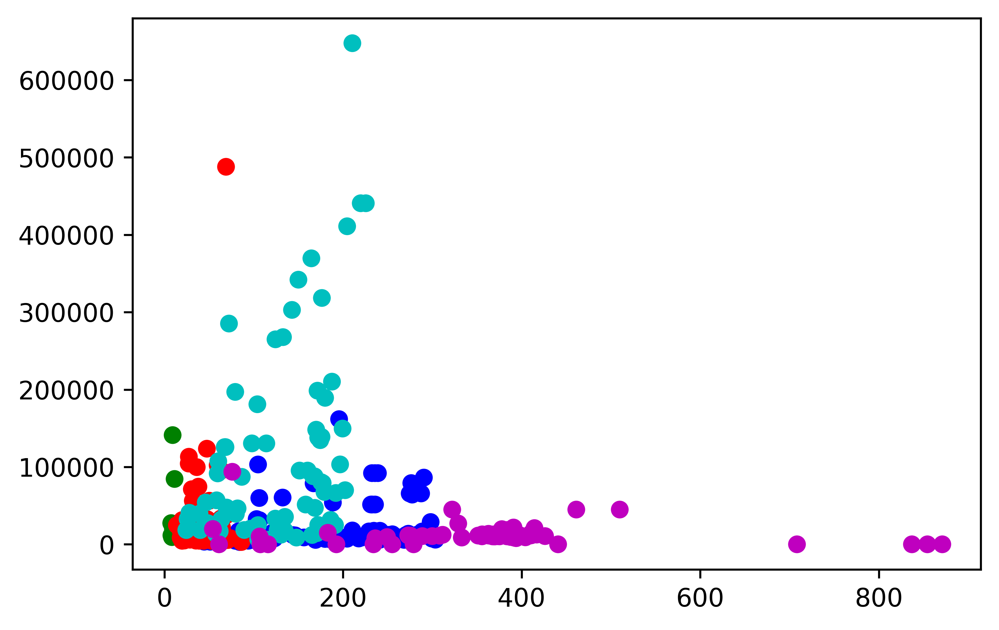

In [126]:
plt.scatter(df_px_added_cols_3_4['sum_of_eta'], df_px_added_cols_3_4['sum_of_eta_PX1000'], 
            c=df_px_added_cols_3_4['date'].map(
                dict(zip(df_px_added_cols_3_4['date'].unique(), ['b', 'g', 'r', 'c', 'm', 'y']))))

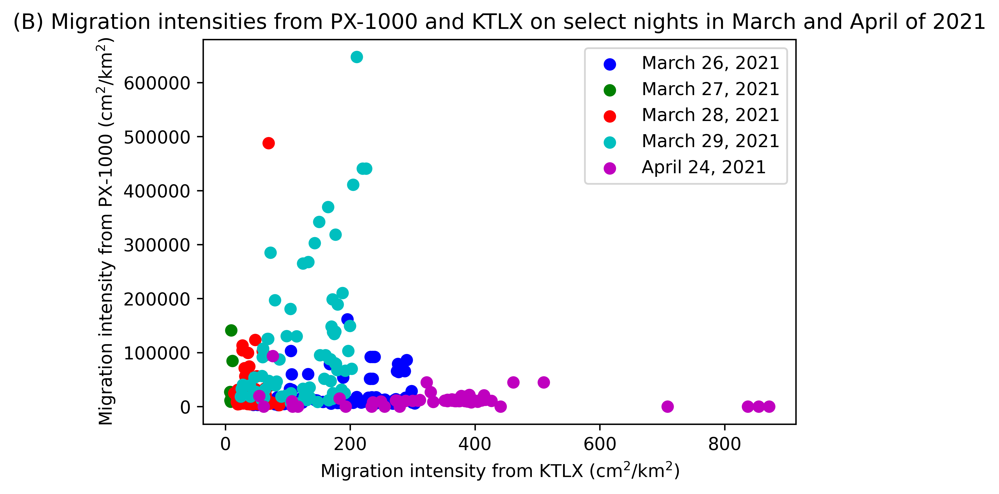

In [145]:
fig, ax = plt.subplots(dpi=600)

dates = ['March 26, 2021', 'March 27, 2021', 'March 28, 2021', 'March 29, 2021', 'April 24, 2021']

colors = ['b', 'g', 'r', 'c', 'm']

for i in range(len(dates)):
    
    df_subset = df_px_added_cols_3_4[df_px_added_cols_3_4['date'] == df_px_added_cols_3_4['date'].unique()[i]]

    ax.scatter(df_subset['sum_of_eta'], df_subset['sum_of_eta_PX1000'], c=colors[i], label=dates[i])

ax.legend()

plt.xlabel('Migration intensity from KTLX ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.ylabel('Migration intensity from PX-1000 ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.title('(B) Migration intensities from PX-1000 and KTLX on select nights in March and April of 2021')

plt.show()

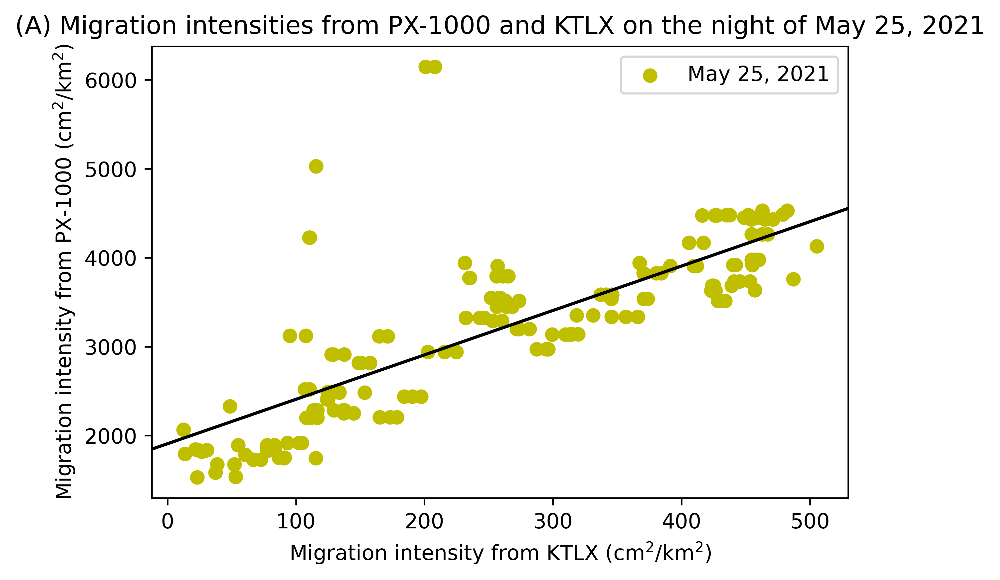

In [144]:
fig, ax = plt.subplots(dpi=600)

ax.scatter(df_px_added_cols_5['sum_of_eta'], df_px_added_cols_5['sum_of_eta_PX1000'], 
            c='y', label='May 25, 2021')

ax.legend()

model_ols = smf.ols(formula='sum_of_eta_PX1000 ~ sum_of_eta', data=df_px_added_cols_5)

res_ols = model_ols.fit()

abline_plot(model_results=res_ols, color='black', ax=ax)

plt.xlabel('Migration intensity from KTLX ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.ylabel('Migration intensity from PX-1000 ($\mathrm{cm^2}$/$\mathrm{km^2}$)')

plt.title('(A) Migration intensities from PX-1000 and KTLX on the night of May 25, 2021')

plt.show()

In [129]:
scipy.stats.pearsonr(df_px_added_cols_5['sum_of_eta'], df_px_added_cols_5['sum_of_eta_PX1000'])

(0.7684400151176278, 2.140908421579722e-34)

In [130]:
df_px_added_cols_5.shape

(170, 20)

In [131]:
scipy.stats.pearsonr(df_px_added_cols_3_4['sum_of_eta'], df_px_added_cols_3_4['sum_of_eta_PX1000'])

(-0.09772434544387662, 0.07995033676525681)

In [132]:
df_px_added_cols_20210327 = df_px_added_cols[df_px_added_cols['date'] == '20210327']
print(df_px_added_cols_20210327.shape)

df_px_added_cols_20210327.head(2)

(88, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210327,000458,96.245742,5.103788,181.45099,0,4,58,0.066667,0.016111,0.082778,000000,13000.272258,0,0,0,0.000000,0.0,0.000000,0.082778
1,20210327,001434,102.304289,5.103788,181.45099,0,14,34,0.233333,0.009444,0.242778,001000,4830.505495,0,10,0,0.166667,0.0,0.166667,0.076111


In [133]:
df_px_added_cols_20210328 = df_px_added_cols[df_px_added_cols['date'] == '20210328']
print(df_px_added_cols_20210328.shape)

df_px_added_cols_20210328.head(2)

(9, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
63,20210328,103454,7.838100,2.57985,209.742172,10,34,54,0.566667,0.015000,10.581667,103000,11594.546905,10,30,0,0.500000,0.0,10.500000,0.081667
64,20210328,104430,9.220916,2.57985,209.742172,10,44,30,0.733333,0.008333,10.741667,104000,141115.645344,10,40,0,0.666667,0.0,10.666667,0.075000


In [134]:
df_px_added_cols_20210329 = df_px_added_cols[df_px_added_cols['date'] == '20210329']
print(df_px_added_cols_20210329.shape)

df_px_added_cols_20210329.head(2)

(75, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210329,000251,54.761941,1.637692,35.943175,0,2,51,0.033333,0.014167,0.047500,000000,22684.455195,0,0,0,0.000000,0.0,0.000000,0.047500
1,20210329,001226,86.172359,1.637692,35.943175,0,12,26,0.200000,0.007222,0.207222,001000,2973.302025,0,10,0,0.166667,0.0,0.166667,0.040556


In [135]:
df_px_added_cols_20210330 = df_px_added_cols[df_px_added_cols['date'] == '20210330']
print(df_px_added_cols_20210330.shape)

df_px_added_cols_20210330.head(2)

(75, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
1,20210330,000514,67.558074,6.325282,7.982284,0,5,14,0.083333,0.003889,0.087222,001000,125606.488203,0,10,0,0.166667,0.0,0.166667,0.079444
1,20210330,001449,68.389471,6.325282,7.982284,0,14,49,0.233333,0.013611,0.246944,001000,125606.488203,0,10,0,0.166667,0.0,0.166667,0.080278


In [136]:
df_px_added_cols_20210425 = df_px_added_cols[df_px_added_cols['date'] == '20210425']
print(df_px_added_cols_20210425.shape)

df_px_added_cols_20210425.head(2)

(75, 20)


,date,time,sum_of_eta,mean_wind_speed,mean_wind_direction,hours,minutes,seconds,minutes_converted,seconds_converted,time_converted,time_PX1000,sum_of_eta_PX1000,hours_PX1000,minutes_PX1000,seconds_PX1000,minutes_converted_PX1000,seconds_converted_PX1000,time_converted_PX1000,time_difference
0,20210425,000516,871.116914,0.244471,229.433563,0,5,16,0.083333,0.004444,0.087778,010000,0.0,1,0,0,0.0,0.0,1.0,0.912222
0,20210425,001451,837.100157,0.244471,229.433563,0,14,51,0.233333,0.014167,0.247500,010000,0.0,1,0,0,0.0,0.0,1.0,0.752500


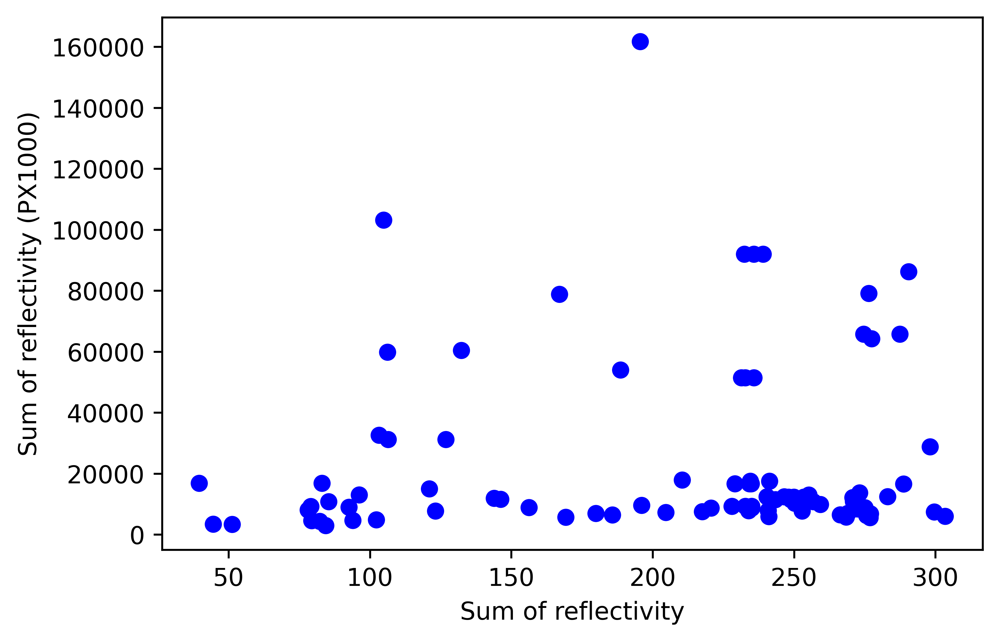

In [137]:
plt.scatter(df_px_added_cols_20210327['sum_of_eta'], df_px_added_cols_20210327['sum_of_eta_PX1000'], 
            c=df_px_added_cols_20210327['date'].map(
                dict(zip(df_px_added_cols_20210327['date'].unique(), ['b']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Sum of reflectivity (PX1000)')

plt.show()

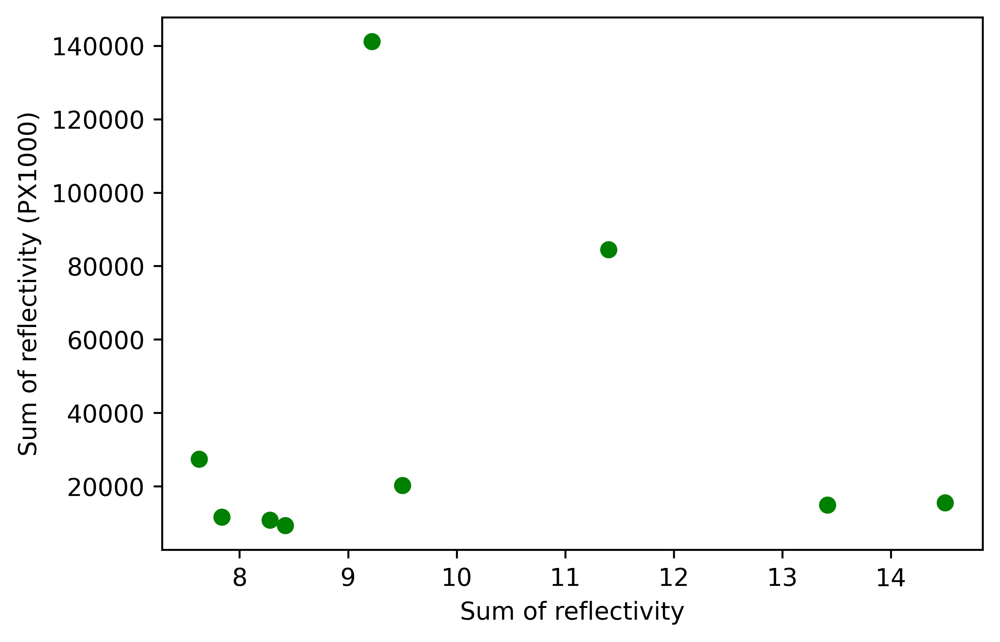

In [138]:
plt.scatter(df_px_added_cols_20210328['sum_of_eta'], df_px_added_cols_20210328['sum_of_eta_PX1000'], 
            c=df_px_added_cols_20210328['date'].map(
                dict(zip(df_px_added_cols_20210328['date'].unique(), ['g']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Sum of reflectivity (PX1000)')

plt.show()

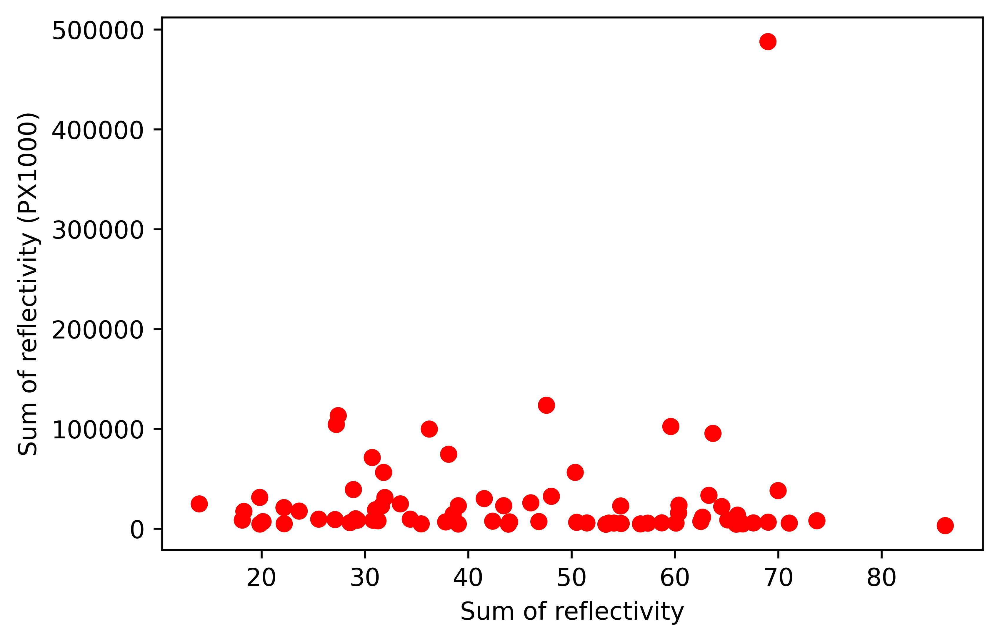

In [139]:
plt.scatter(df_px_added_cols_20210329['sum_of_eta'], df_px_added_cols_20210329['sum_of_eta_PX1000'], 
            c=df_px_added_cols_20210329['date'].map(
                dict(zip(df_px_added_cols_20210329['date'].unique(), ['r']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Sum of reflectivity (PX1000)')

plt.show()

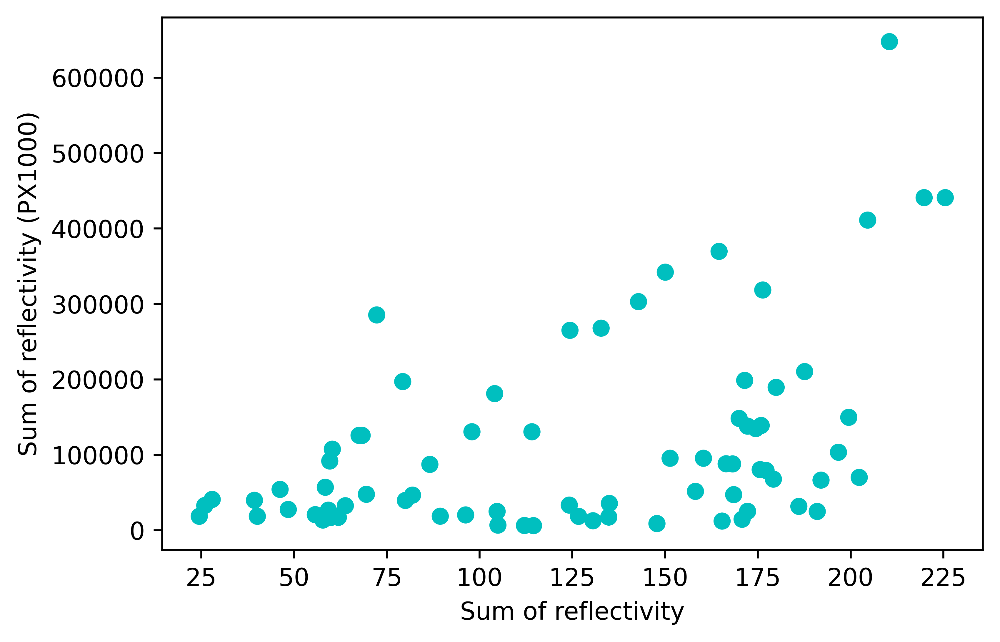

In [140]:
plt.scatter(df_px_added_cols_20210330['sum_of_eta'], df_px_added_cols_20210330['sum_of_eta_PX1000'], 
            c=df_px_added_cols_20210330['date'].map(
                dict(zip(df_px_added_cols_20210330['date'].unique(), ['c']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Sum of reflectivity (PX1000)')

plt.show()

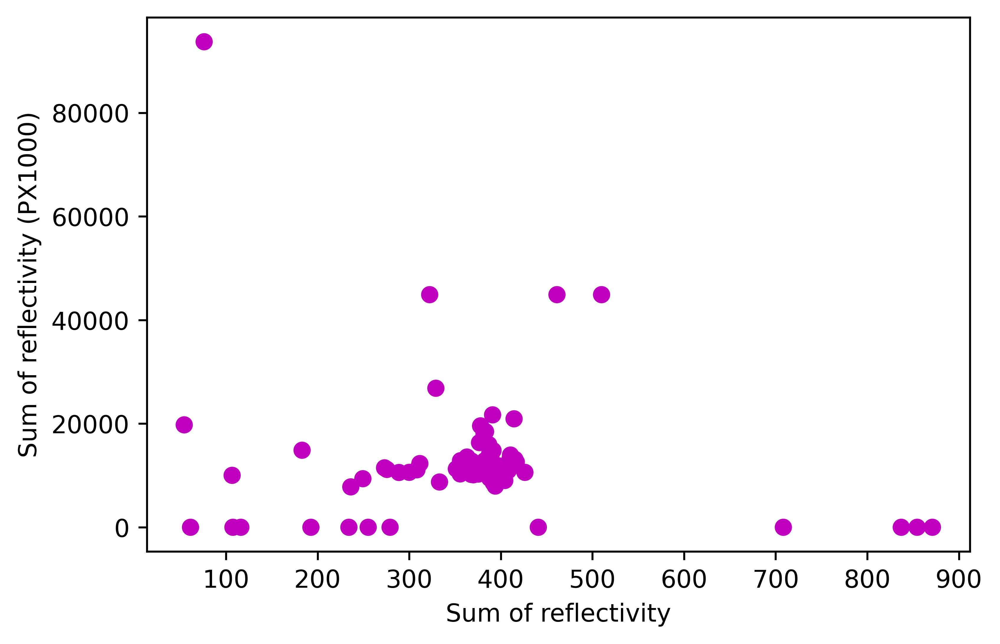

In [141]:
plt.scatter(df_px_added_cols_20210425['sum_of_eta'], df_px_added_cols_20210425['sum_of_eta_PX1000'], 
            c=df_px_added_cols_20210425['date'].map(
                dict(zip(df_px_added_cols_20210425['date'].unique(), ['m']))))

plt.xlabel('Sum of reflectivity')

plt.ylabel('Sum of reflectivity (PX1000)')

plt.show()